<div class="alert alert-block alert-success">

## <center> Tracking Issues created for Repos on GitHub </center>
## <center> Plot and Forecast Issues </center>
    

</div>

<hr style="border:2px solid black"> </hr>
<div class="alert alert-info">



        
## REQUIREMENT 1

Use Python/GitHub API to retrieve Issues/Repos information of the **past 2 months** for the following  repositories:
- https://github.com/meta-llama/llama3
- https://github.com/ollama/ollama
- https://github.com/langchain-ai/langchain
- https://github.com/langchain-ai/langgraph
- https://github.com/microsoft/autogen
- https://github.com/openai/openai-cookbook 
- https://github.com/elastic/elasticsearch 
- https://github.com/milvus-io/pymilvus 


## Important: Data Retrieval Timeframe

 - For **chart visualizations below**, retrieve **past 2 years** of data.
 - For **semantic search and vector embeddings**, use **past 2 months** of data from the above repositories.

    
</div>



In [1]:
pip install PyGithub

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install github3.py

Note: you may need to restart the kernel to use updated packages.


In [ ]:
#!/usr/bin/env python3
import os
import json
from datetime import datetime, timedelta
from bs4 import BeautifulSoup
import github3

# ── CONFIGURATION ────────────────────────────────────────────────────────────

# You can also export your token in the environment:
#   export GITHUB_TOKEN="ghp_…"
GITHUB_TOKEN = ""

# Fully-qualified repo names:
REPOSITORIES = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

OUTPUT_FILE = "issues.json"

# ── AUTHENTICATE ─────────────────────────────────────────────────────────────
gh = github3.login(token=GITHUB_TOKEN)
if not gh:
    raise RuntimeError("GitHub authentication failed – check your GITHUB_TOKEN")

# ── CALCULATE CUTOFF ───────────────────────────────────────────────────────────
# issues created on or after this date:
cutoff_date = datetime.utcnow() - timedelta(days=730)
cutoff_iso = cutoff_date.isoformat()  # e.g. "2023-04-24T15:30:00"

# ── FETCH & WRITE ─────────────────────────────────────────────────────────────
with open(OUTPUT_FILE, "w", encoding="utf-8") as out_f:
    for full_name in REPOSITORIES:
        print(f"→ Processing {full_name} since {cutoff_iso}…")
        # Search query: all issues (open or closed) created in the last 2 years
        query = f"type:issue repo:{full_name} created:>={cutoff_iso}"
        try:
            for issue in gh.search_issues(query):
                raw = issue.as_json()
                issue_data = json.loads(raw)

                # build a clean dict
                cleaned = {
                    "repository": full_name,
                    "number":    issue_data["number"],
                    "title":     issue_data["title"],
                    "body":      BeautifulSoup(issue_data.get("body_html") or "", "html.parser").get_text().strip(),
                    "state":     issue_data["state"],
                    "author":    issue_data["user"]["login"],
                    "labels":    [lbl["name"] for lbl in issue_data.get("labels", [])],
                    "created_at": issue_data["created_at"][:10],
                    "closed_at":  issue_data["closed_at"][:10] if issue_data.get("closed_at") else None,
                }

                out_f.write(json.dumps(cleaned, ensure_ascii=False) + "\n")

        except github3.exceptions.GitHubError as e:
            print(f"⚠  Error fetching issues for {full_name}: {e}")

print(f"\n✅  Done — all issues saved to {OUTPUT_FILE}")

→ Processing meta-llama/llama3 since 2023-04-26T05:10:00.534282…
→ Processing ollama/ollama since 2023-04-26T05:10:00.534282…
→ Processing langchain-ai/langchain since 2023-04-26T05:10:00.534282…
→ Processing langchain-ai/langgraph since 2023-04-26T05:10:00.534282…
→ Processing microsoft/autogen since 2023-04-26T05:10:00.534282…
→ Processing openai/openai-cookbook since 2023-04-26T05:10:00.534282…
→ Processing elastic/elasticsearch since 2023-04-26T05:10:00.534282…
→ Processing milvus-io/pymilvus since 2023-04-26T05:10:00.534282…

✅  Done — all issues saved to issues.json


<hr style="border:1px solid black"> </hr>

<div class="alert alert-info">   
    
## REQUIREMENT 2
- A line chart to plot the issues for every repository
    
</div>


In [4]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


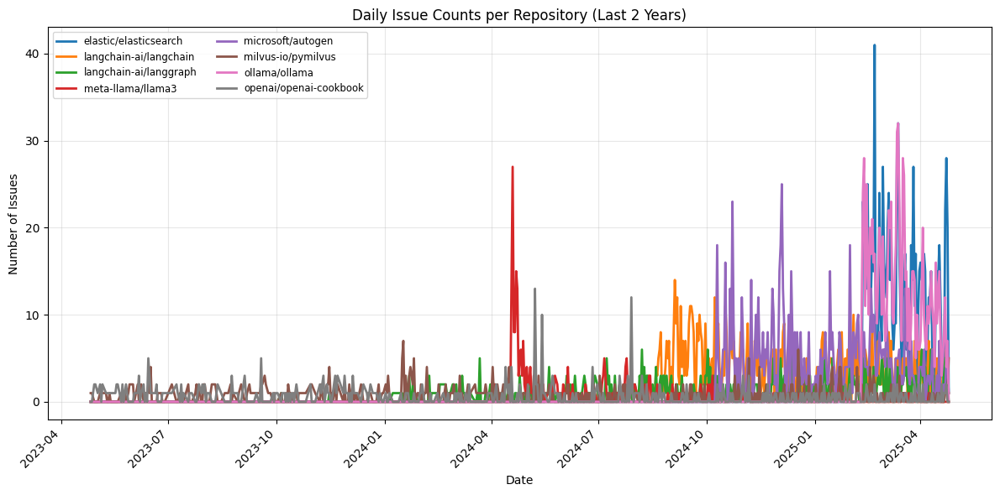

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load and preprocess
df = pd.read_json('issues.json', lines=True)
df['created_at'] = pd.to_datetime(df['created_at']).dt.date

# 2. Aggregate
daily_counts = (
    df
    .groupby(['repository', 'created_at'])
    .size()
    .reset_index(name='count')
)
pivot_df = (
    daily_counts
    .pivot(index='created_at', columns='repository', values='count')
    .fillna(0)
    .sort_index()
)

# 3. Plot smooth lines
plt.figure(figsize=(12, 6))
for repo in pivot_df.columns:
    plt.plot(pivot_df.index, pivot_df[repo], linewidth=2, label=repo)

plt.xlabel('Date')
plt.ylabel('Number of Issues')
plt.title('Daily Issue Counts per Repository (Last 2 Years)')
plt.xticks(rotation=45, ha='right')
plt.grid(alpha=0.3)
plt.legend(loc='upper left', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()


<hr style="border:1px solid black"> </hr>

<div class="alert alert-info">   
    
## REQUIREMENT 3
- A bar chart to plot the issues created for every month for every repository
    
</div>

<Figure size 1200x600 with 0 Axes>

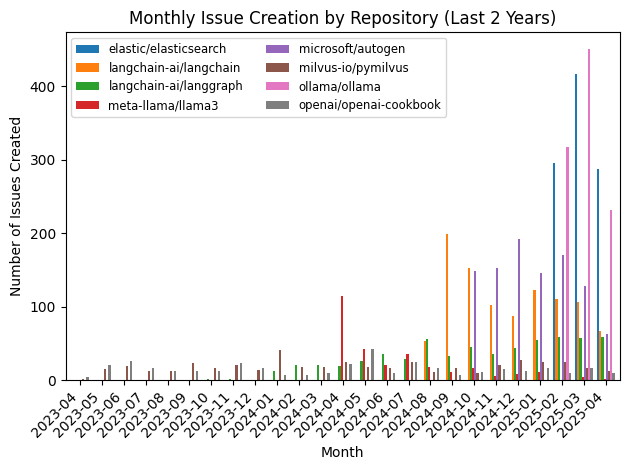

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load and preprocess
df = pd.read_json('issues.json', lines=True)
df['created_at'] = pd.to_datetime(df['created_at'])

# 2. Extract year–month
df['year_month'] = df['created_at'].dt.to_period('M').astype(str)

# 3. Count issues per repo per month
monthly_counts = (
    df
    .groupby(['year_month', 'repository'])
    .size()
    .reset_index(name='count')
)

# 4. Pivot to get months as rows and repos as columns
pivot_month = (
    monthly_counts
    .pivot(index='year_month', columns='repository', values='count')
    .fillna(0)
    .sort_index()
)

# 5. Plot grouped bar chart
plt.figure(figsize=(12, 6))
pivot_month.plot(kind='bar', width=0.8)

plt.xlabel('Month')
plt.ylabel('Number of Issues Created')
plt.title('Monthly Issue Creation by Repository (Last 2 Years)')
plt.xticks(rotation=45, ha='right')
plt.legend(loc='upper left', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 4
- A bar chart to plot the starts for every repository
    
</div>

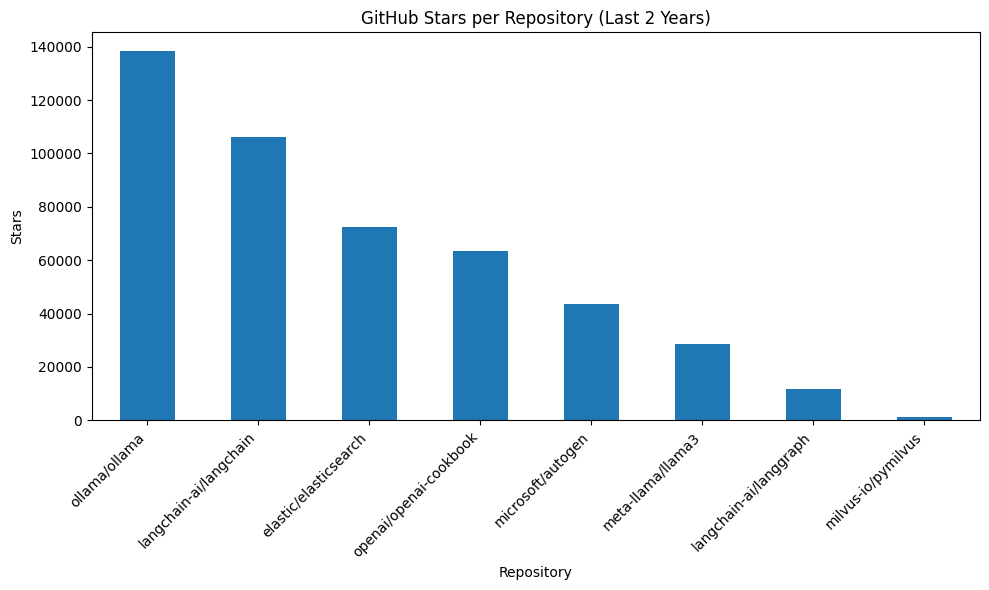

In [ ]:
# Requirement 4: Bar chart of stars for every repository

import os
import pandas as pd
import matplotlib.pyplot as plt
from github3 import login

# 1. Authenticate with GitHub
gh = login(token="")

# 2. Define your repositories
REPOSITORIES = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

# 3. Fetch star counts
star_data = []
for full_name in REPOSITORIES:
    owner, name = full_name.split("/")
    repo = gh.repository(owner, name)
    star_data.append({
        "repository": full_name,
        "stars": repo.stargazers_count
    })

# 4. Build DataFrame
df_stars = pd.DataFrame(star_data) \
             .set_index("repository") \
             .sort_values("stars", ascending=False)

# 5. Plot bar chart
plt.figure(figsize=(10, 6))
df_stars["stars"].plot(kind="bar")
plt.xlabel("Repository")
plt.ylabel("Stars")
plt.title("GitHub Stars per Repository (Last 2 Years)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 5
- A bar chart to plot the forks for every repository
    
</div>

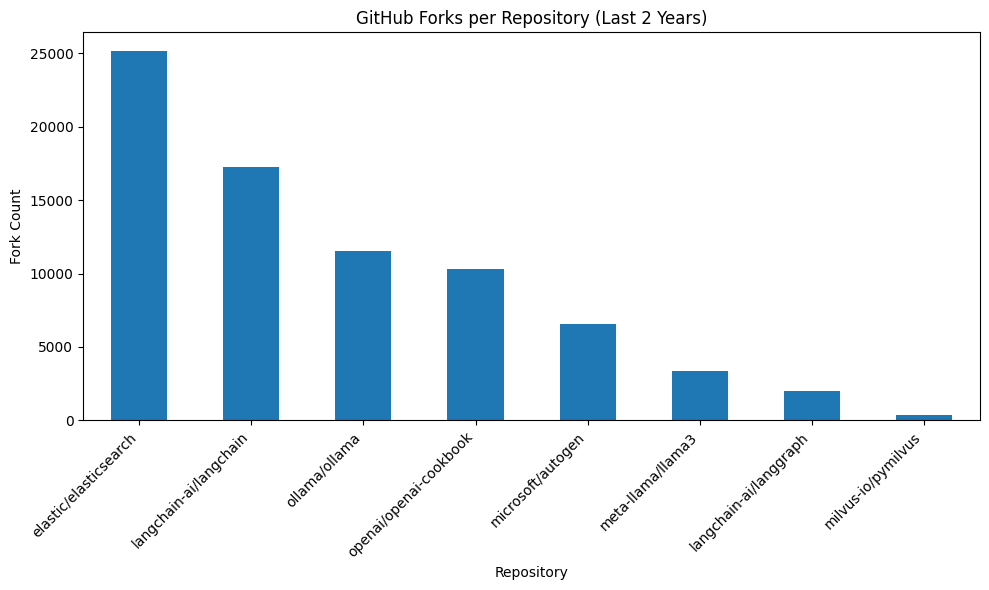

In [ ]:
# Requirement 5: Bar chart of forks for every repository

import os
import pandas as pd
import matplotlib.pyplot as plt
from github3 import login

# 1. Authenticate with GitHub
gh = login(token="")

# 2. Define your repositories
REPOSITORIES = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

# 3. Fetch fork counts
fork_data = []
for full_name in REPOSITORIES:
    owner, name = full_name.split("/")
    repo = gh.repository(owner, name)
    fork_data.append({
        "repository": full_name,
        "forks": repo.forks_count
    })

# 4. Build DataFrame
df_forks = pd.DataFrame(fork_data) \
             .set_index("repository") \
             .sort_values("forks", ascending=False)

# 5. Plot bar chart
plt.figure(figsize=(10, 6))
df_forks["forks"].plot(kind="bar")
plt.xlabel("Repository")
plt.ylabel("Fork Count")
plt.title("GitHub Forks per Repository (Last 2 Years)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 6
- A bar chart to plot the issues closed for every week for every repository
    
</div>

<Figure size 1200x600 with 0 Axes>

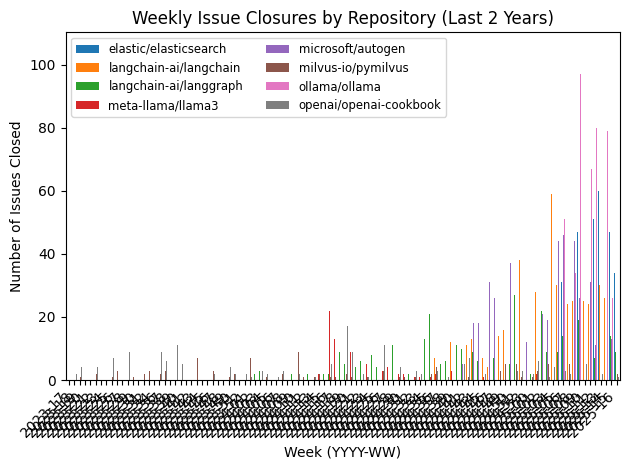

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load the JSONL into a DataFrame
df = pd.read_json('issues.json', lines=True)

# 2. Parse closed_at into datetime and drop any issues not yet closed
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')
df_closed = df.dropna(subset=['closed_at']).copy()

# 3. Extract Year‐Week (e.g. "2025-17")
df_closed['week'] = df_closed['closed_at'].dt.strftime('%Y-%W')

# 4. Count closures per repo per week
weekly_counts = (
    df_closed
    .groupby(['week', 'repository'])
    .size()
    .reset_index(name='count')
)

# 5. Pivot so each repo is a column
pivot_week = (
    weekly_counts
    .pivot(index='week', columns='repository', values='count')
    .fillna(0)
    .sort_index()
)

# 6. Plot grouped bar chart
plt.figure(figsize=(12, 6))
pivot_week.plot(kind='bar', width=0.8)

plt.xlabel('Week (YYYY-WW)')
plt.ylabel('Number of Issues Closed')
plt.title('Weekly Issue Closures by Repository (Last 2 Years)')
plt.xticks(rotation=45, ha='right')
plt.legend(loc='upper left', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 7
- A stack-bar Chart to plot the created and closed issues for every repository
    
</div>

<Figure size 1000x600 with 0 Axes>

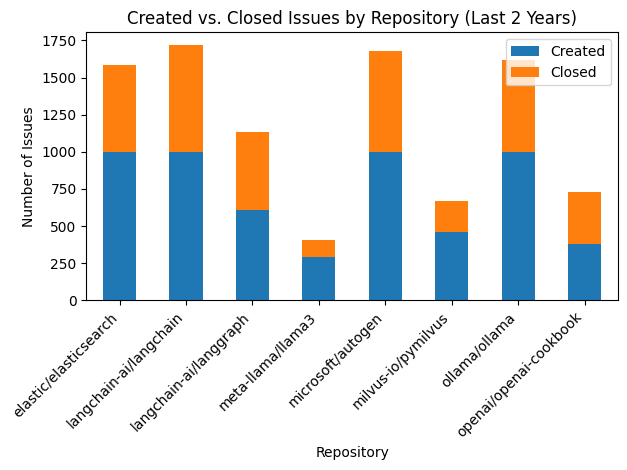

In [13]:
# REQUIREMENT 7: Stacked bar chart of created vs. closed issues per repository

import pandas as pd
import matplotlib.pyplot as plt

# 1. Load the JSONL into a DataFrame
df = pd.read_json('issues.json', lines=True)

# 2. Parse closed_at into datetime (closed_at is None for open issues)
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')

# 3. Compute counts per repository
created_counts = df.groupby('repository').size()
closed_counts  = df[df['closed_at'].notna()].groupby('repository').size()

# 4. Combine into a single DataFrame
counts = pd.DataFrame({
    'Created': created_counts,
    'Closed': closed_counts
}).fillna(0).sort_index()

# 5. Plot stacked bar chart
plt.figure(figsize=(10, 6))
counts.plot(kind='bar', stacked=True)

plt.xlabel('Repository')
plt.ylabel('Number of Issues')
plt.title('Created vs. Closed Issues by Repository (Last 2 Years)')
plt.xticks(rotation=45, ha='right')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 8 (TENSORFLOW/KERAS LSTM)
- Use TensorFlow/Keras LSTM package to forecast the following for every repository  
</div>

<div class="alert alert-block alert-success">   
    
#### REQ8-1). The day of the week maximum number of issues created 
    
</div>

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


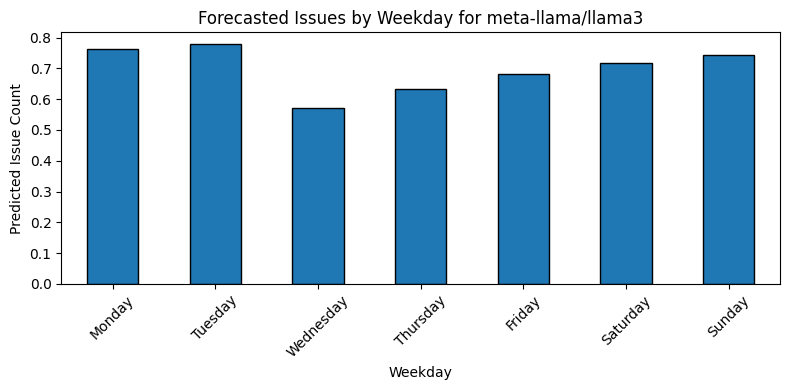

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


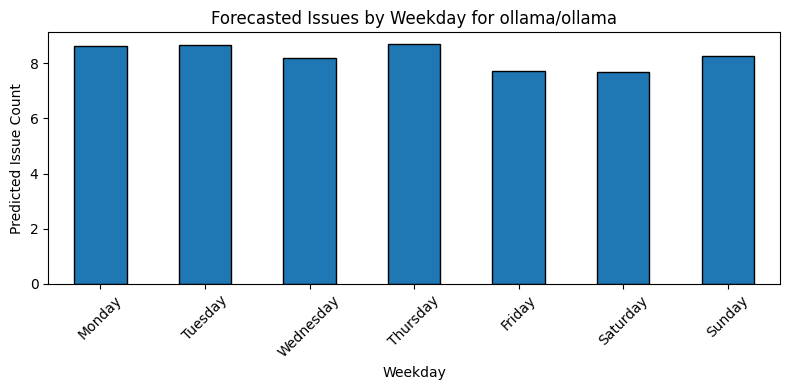

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


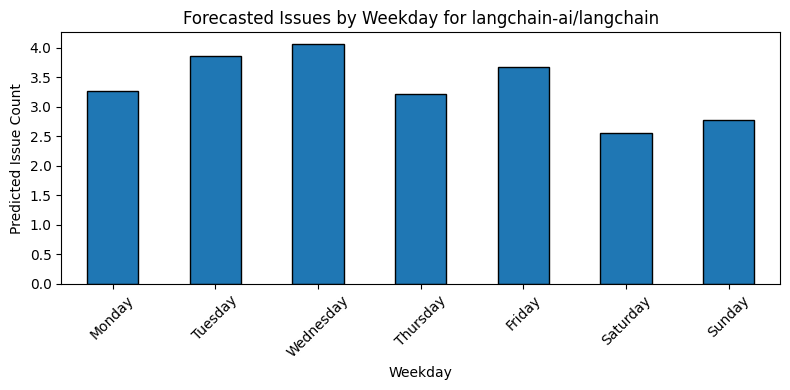

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


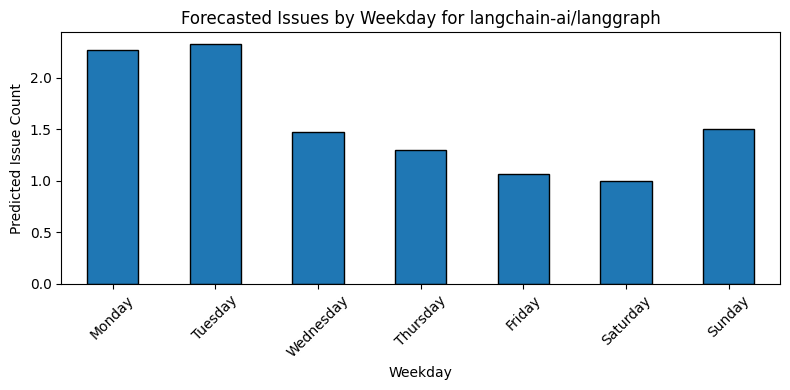

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


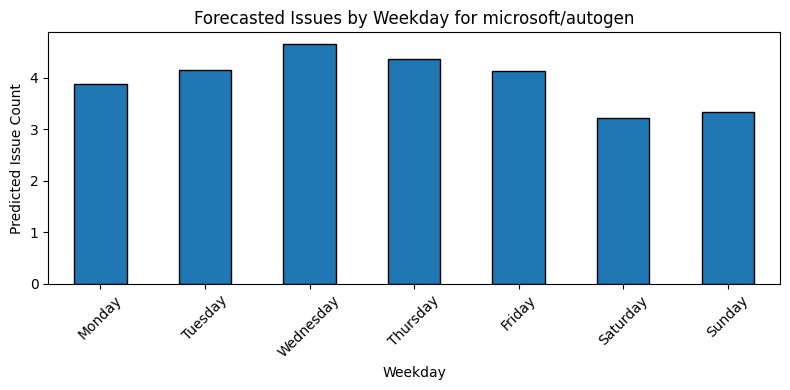

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


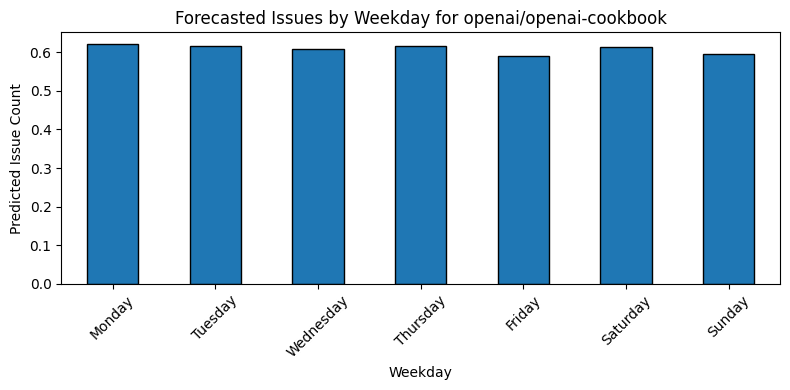

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


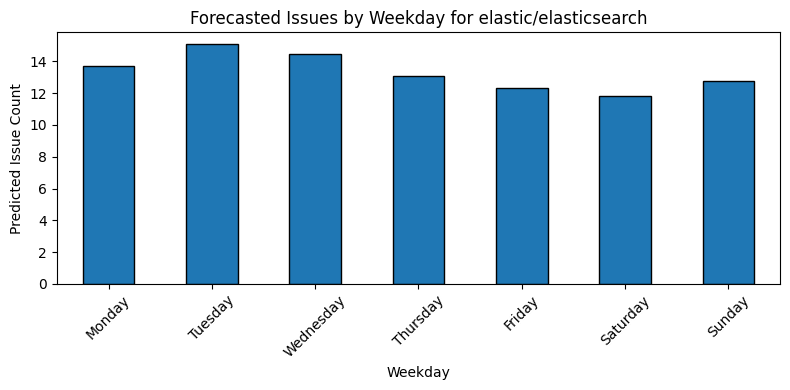

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


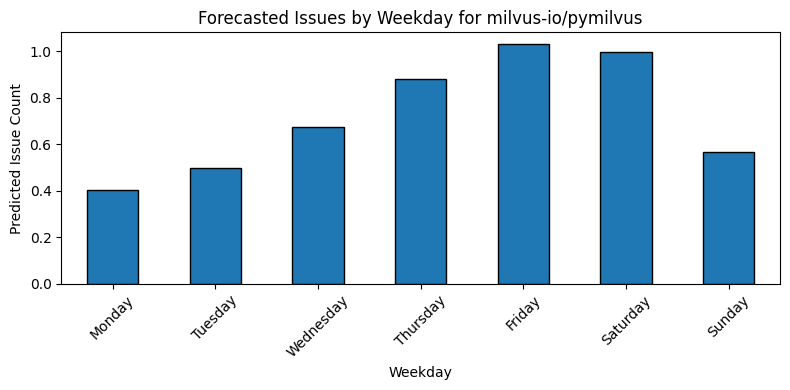

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# ── Load & Prepare Data ──────────────────────────────────────────────────────
df = pd.read_json('issues.json', lines=True)
df['created_at'] = pd.to_datetime(df['created_at'], errors='coerce')

# Filter to last 2 years using pandas Timestamp
cutoff = pd.Timestamp.now() - pd.Timedelta(days=730)
df_recent = df[df['created_at'] >= cutoff]

# Forecast settings
WINDOW_SIZE      = 7
FORECAST_HORIZON = 7

# Loop through each repository and plot its own weekday‐bar chart
for repo in df_recent['repository'].unique():
    repo_df = df_recent[df_recent['repository'] == repo]
    
    # 1) Build daily time series
    daily = (
        repo_df
        .set_index('created_at')
        .resample('D')
        .size()
        .rename('count')
        .to_frame()
        .asfreq('D', fill_value=0)
    )
    
    # 2) Scale values to [0,1]
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(daily)
    
    # 3) Create rolling window sequences
    X, y = [], []
    for i in range(len(scaled) - WINDOW_SIZE):
        X.append(scaled[i:i + WINDOW_SIZE, 0])
        y.append(scaled[i + WINDOW_SIZE, 0])
    if not X:
        continue
    X = np.array(X).reshape(-1, WINDOW_SIZE, 1)
    y = np.array(y)
    
    # 4) Build & train LSTM
    model = Sequential([
        LSTM(32, input_shape=(WINDOW_SIZE, 1)),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=20, batch_size=4, verbose=0)
    
    # 5) Forecast next 7 days
    preds = []
    window = scaled[-WINDOW_SIZE:].reshape(1, WINDOW_SIZE, 1)
    for _ in range(FORECAST_HORIZON):
        p = model.predict(window, verbose=0)[0, 0]
        preds.append(p)
        window = np.roll(window, -1, axis=1)
        window[0, -1, 0] = p
    
    # 6) Inverse scale predictions
    preds_inv = scaler.inverse_transform(np.array(preds).reshape(-1, 1)).flatten()
    
    # 7) Map predictions to future dates and weekdays
    last_date    = daily.index[-1]
    future_dates = last_date + pd.to_timedelta(np.arange(1, FORECAST_HORIZON + 1), unit='D')
    weekdays     = future_dates.day_name()
    
    # 8) Aggregate forecast by weekday
    df_fc = pd.DataFrame({'weekday': weekdays, 'predicted_count': preds_inv})
    order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    counts = df_fc.groupby('weekday')['predicted_count'] \
                  .sum() \
                  .reindex(order) \
                  .fillna(0)
    
    # 9) Plot a separate bar chart for this repo
    plt.figure(figsize=(8, 4))
    counts.plot(kind='bar', edgecolor='black')
    plt.title(f'Forecasted Issues by Weekday for {repo}')
    plt.xlabel('Weekday')
    plt.ylabel('Predicted Issue Count')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-success">   
    
#### REQ8-2). The day of the week maximum number of issues closed 

</div>

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


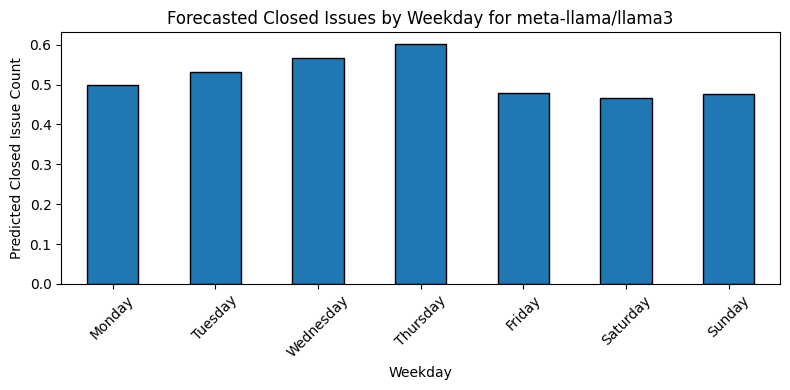

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


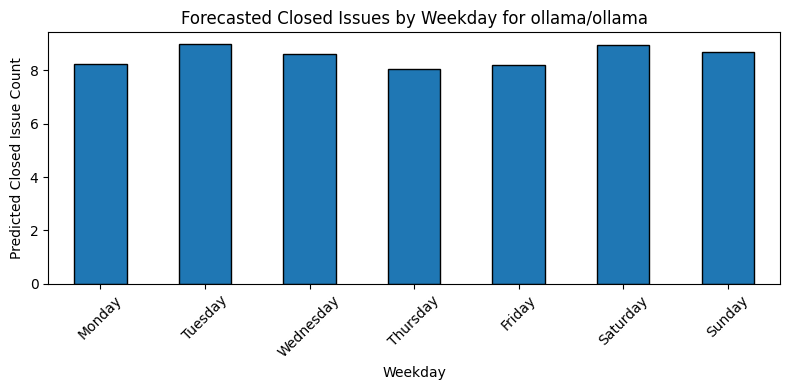

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


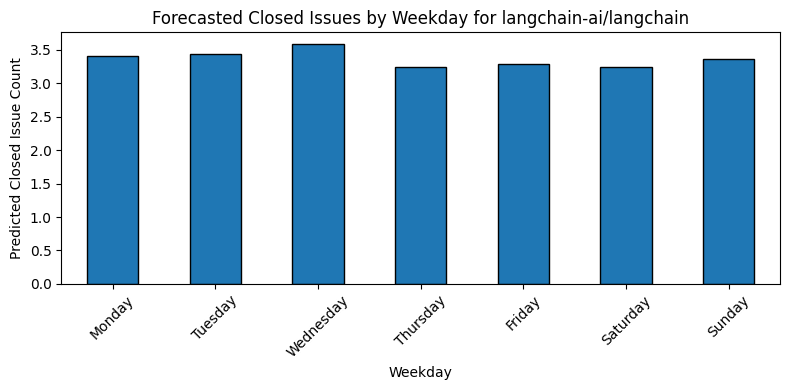

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


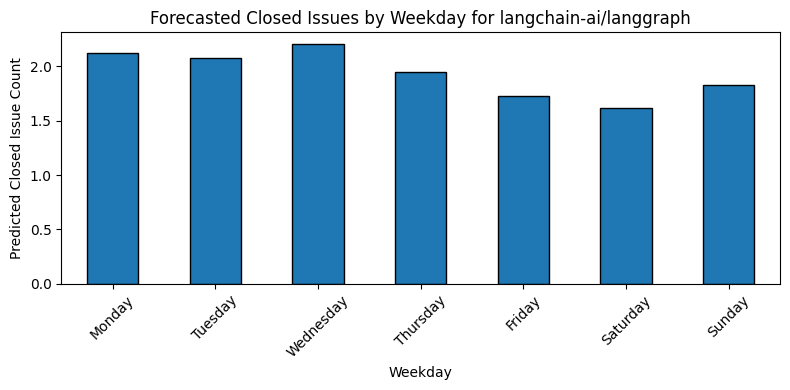

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


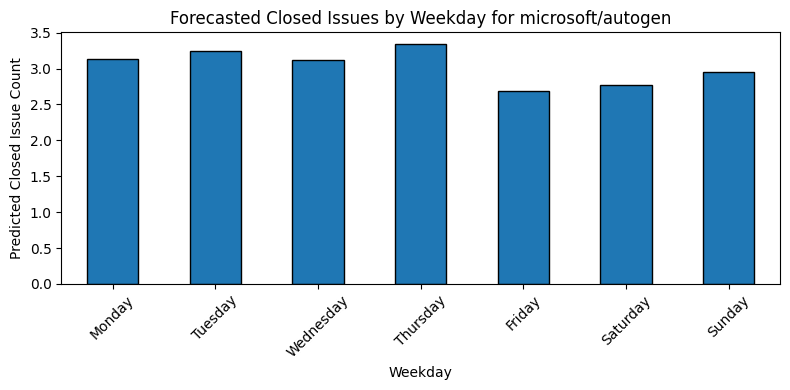

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


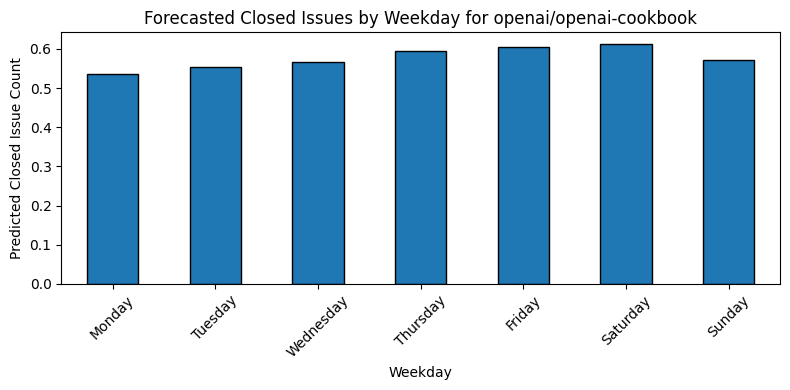

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


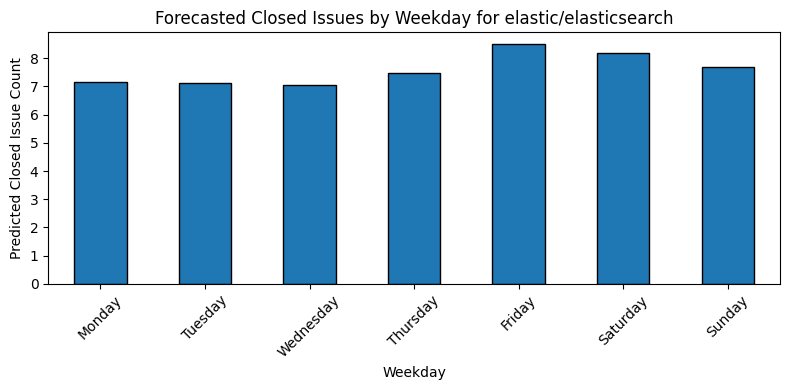

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


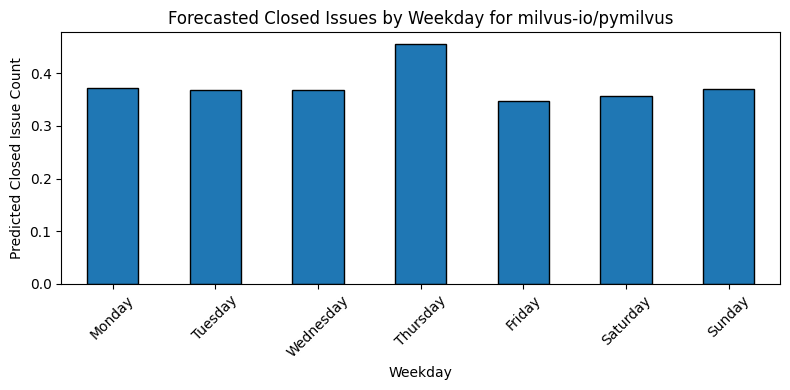

In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# ── Load & Prepare Data ──────────────────────────────────────────────────────
df = pd.read_json('issues.json', lines=True)
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')

# Filter to last 2 years using pandas Timestamp
cutoff = pd.Timestamp.now() - pd.Timedelta(days=730)
df_recent = df[df['closed_at'] >= cutoff]

# Forecast settings
WINDOW_SIZE      = 7
FORECAST_HORIZON = 7

# Loop through each repository and plot its own weekday‐bar chart for closed issues
for repo in df_recent['repository'].unique():
    repo_df = df_recent[df_recent['repository'] == repo]
    
    # 1) Build daily closed‐issues time series
    daily = (
        repo_df
        .set_index('closed_at')
        .resample('D')
        .size()
        .rename('count')
        .to_frame()
        .asfreq('D', fill_value=0)
    )
    
    # 2) Scale values to [0,1]
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(daily)
    
    # 3) Create rolling window sequences
    X, y = [], []
    for i in range(len(scaled) - WINDOW_SIZE):
        X.append(scaled[i:i + WINDOW_SIZE, 0])
        y.append(scaled[i + WINDOW_SIZE, 0])
    if not X:
        continue
    X = np.array(X).reshape(-1, WINDOW_SIZE, 1)
    y = np.array(y)
    
    # 4) Build & train LSTM
    model = Sequential([
        LSTM(32, input_shape=(WINDOW_SIZE, 1)),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=20, batch_size=4, verbose=0)
    
    # 5) Forecast next 7 days
    preds = []
    window = scaled[-WINDOW_SIZE:].reshape(1, WINDOW_SIZE, 1)
    for _ in range(FORECAST_HORIZON):
        p = model.predict(window, verbose=0)[0, 0]
        preds.append(p)
        window = np.roll(window, -1, axis=1)
        window[0, -1, 0] = p
    
    # 6) Inverse scale predictions
    preds_inv = scaler.inverse_transform(np.array(preds).reshape(-1, 1)).flatten()
    
    # 7) Map predictions to future dates and weekdays
    last_date    = daily.index[-1]
    future_dates = last_date + pd.to_timedelta(np.arange(1, FORECAST_HORIZON + 1), unit='D')
    weekdays     = future_dates.day_name()
    
    # 8) Aggregate forecast by weekday
    df_fc = pd.DataFrame({'weekday': weekdays, 'predicted_count': preds_inv})
    order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    counts = df_fc.groupby('weekday')['predicted_count'] \
                  .sum() \
                  .reindex(order) \
                  .fillna(0)
    
    # 9) Plot a separate bar chart for this repo
    plt.figure(figsize=(8, 4))
    counts.plot(kind='bar', edgecolor='black')
    plt.title(f'Forecasted Closed Issues by Weekday for {repo}')
    plt.xlabel('Weekday')
    plt.ylabel('Predicted Closed Issue Count')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-success">   
    
#### REQ8-3). The month of the year that has maximum number of issues closed 


</div>

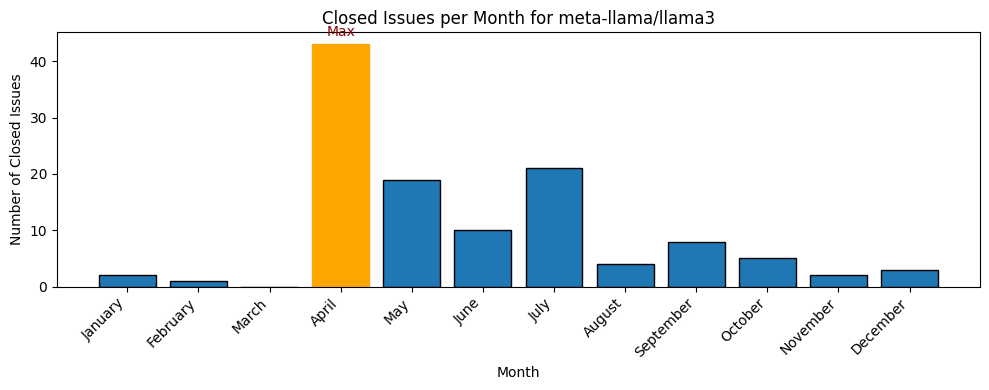

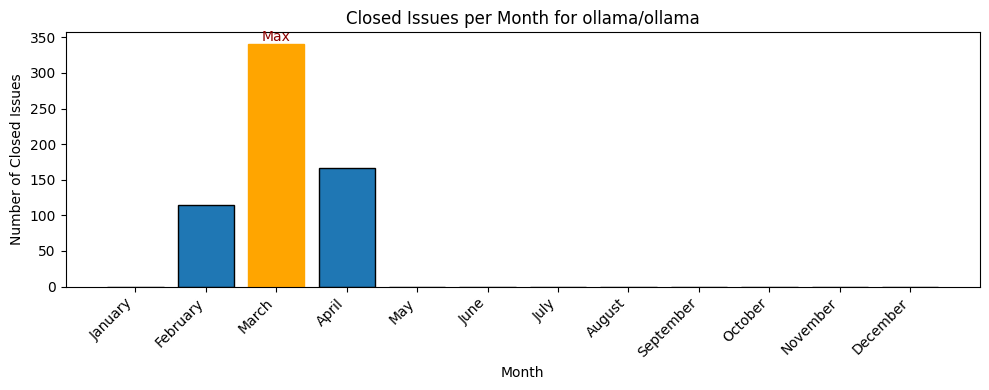

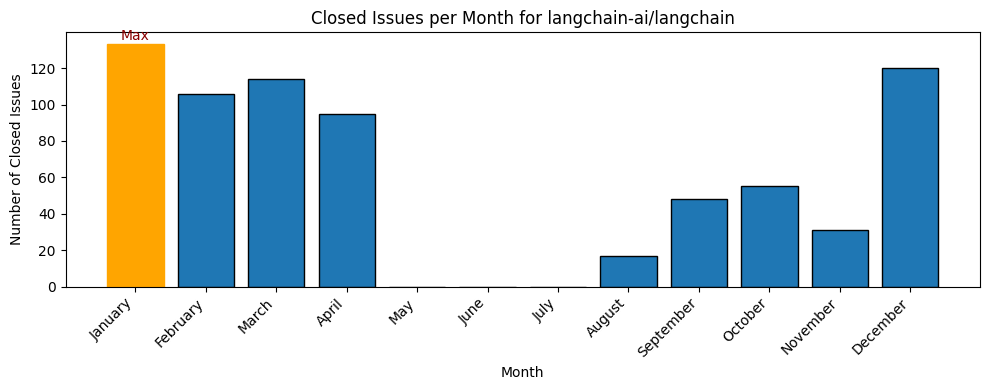

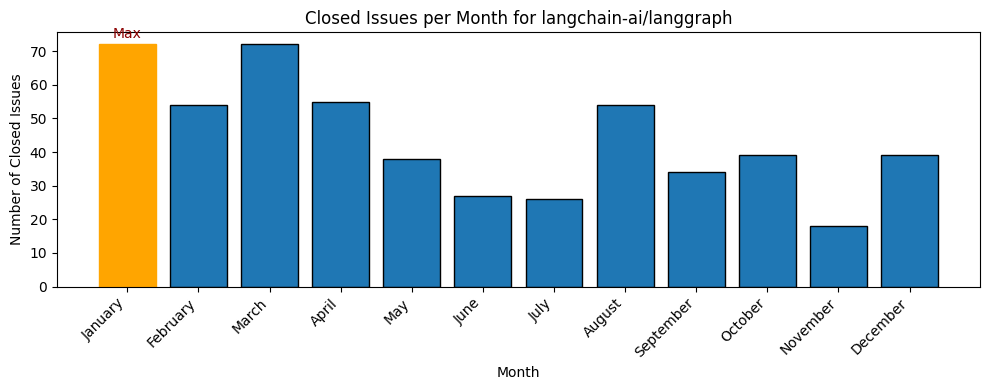

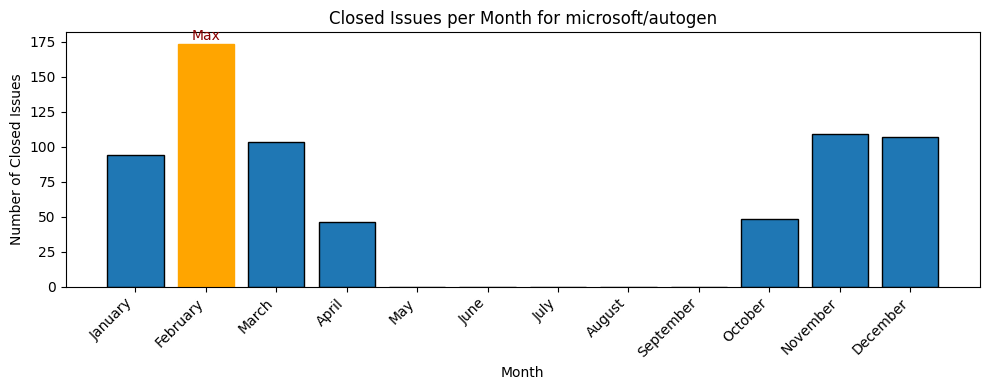

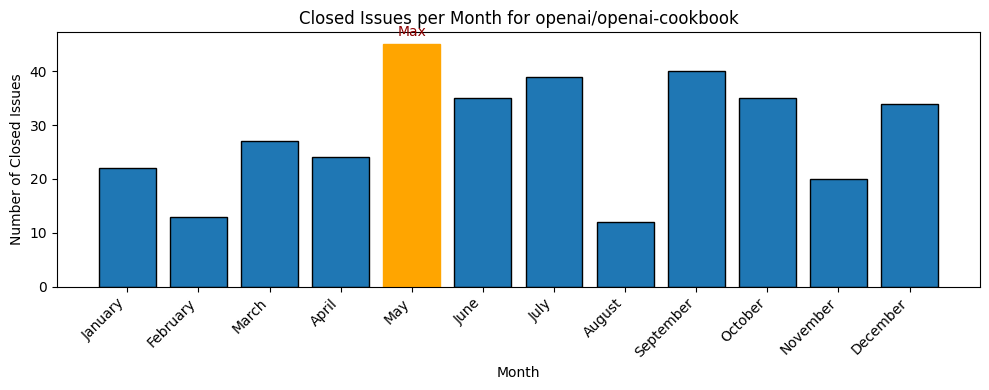

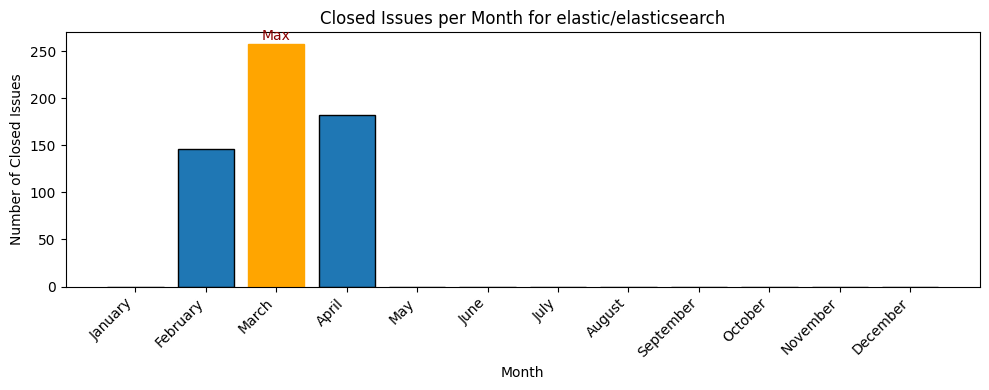

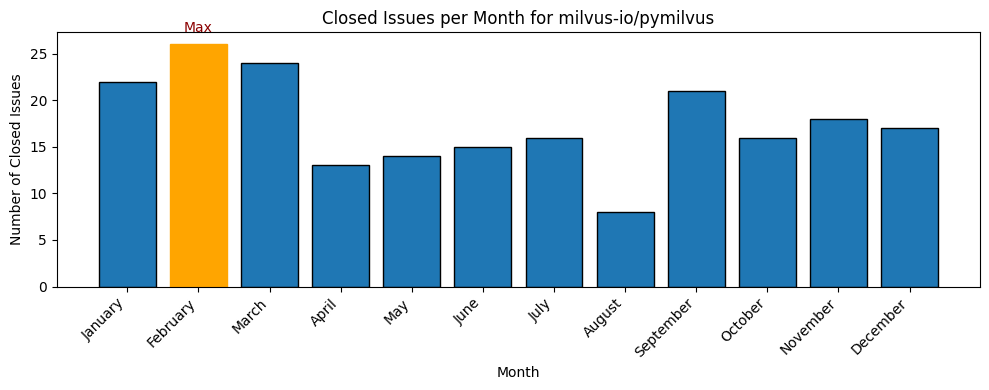

In [68]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load & prepare data
df = pd.read_json('issues.json', lines=True)
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')
df_closed = df.dropna(subset=['closed_at']).copy()

# 2. Define chronological month order
months_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]

# 3. Loop per repository and plot monthly closed‐issue counts
for repo in df_closed['repository'].unique():
    repo_df = df_closed[df_closed['repository'] == repo]
    if repo_df.empty:
        continue

    # 3a. Count closures by month
    monthly_counts = (
        repo_df
        .groupby(repo_df['closed_at'].dt.month_name())
        .size()
        .reindex(months_order, fill_value=0)
    )

    # 3b. Plot
    plt.figure(figsize=(10, 4))
    bars = plt.bar(monthly_counts.index, monthly_counts.values, edgecolor='black')
    plt.title(f'Closed Issues per Month for {repo}')
    plt.xlabel('Month')
    plt.ylabel('Number of Closed Issues')
    plt.xticks(rotation=45, ha='right')

    # 3c. Highlight and annotate the max month
    max_idx = monthly_counts.values.argmax()
    bars[max_idx].set_color('orange')
    plt.text(
        max_idx, 
        monthly_counts.values[max_idx] + 1, 
        'Max', 
        ha='center', 
        va='bottom', 
        color='darkred'
    )

    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-success">   
    
#### REQ8-4). Plot the created issues forecast 

</div>

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


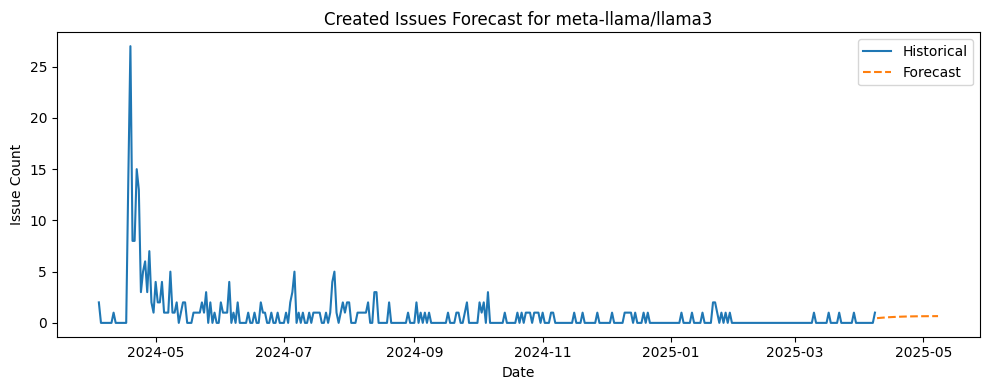

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


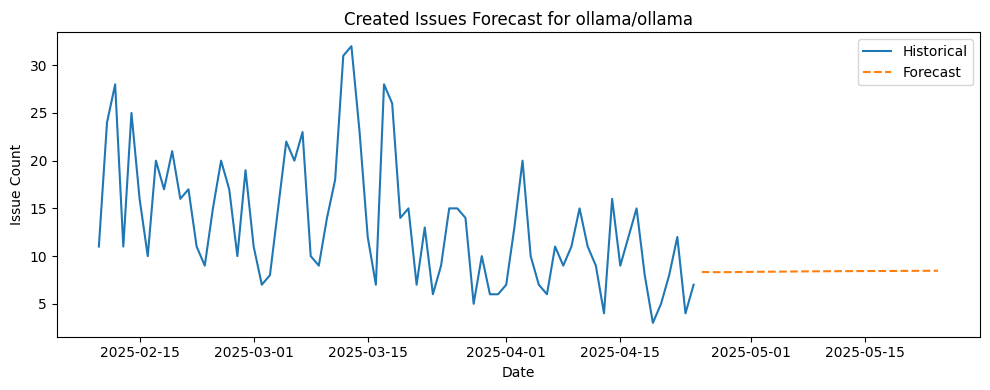

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


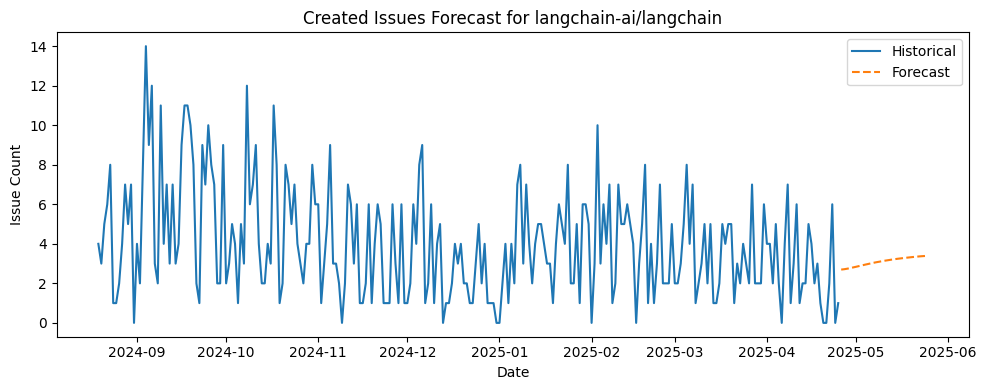

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


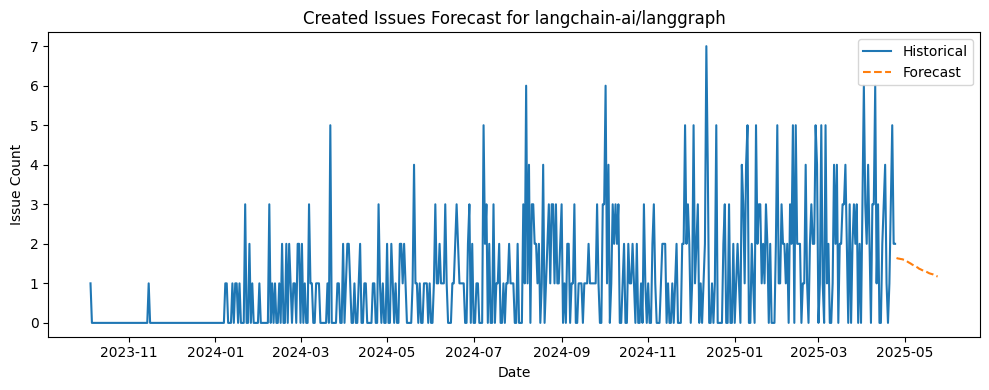

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


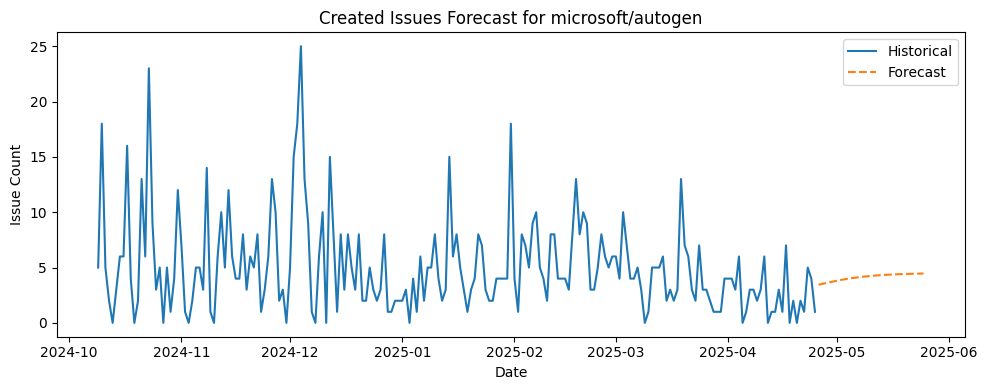

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


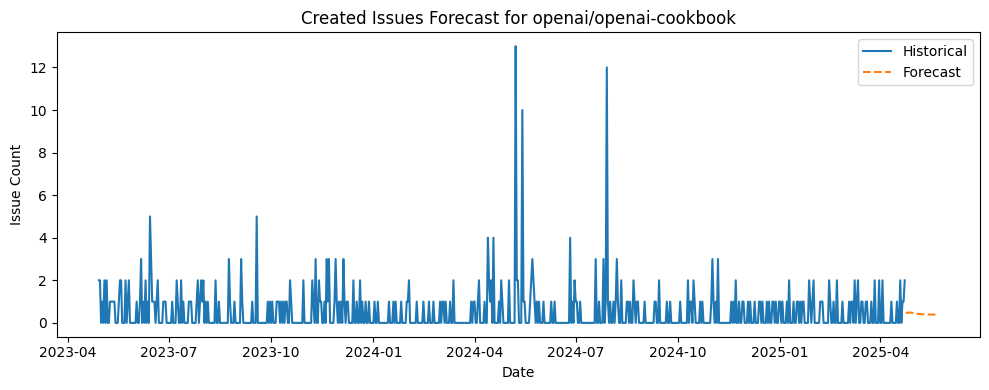

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


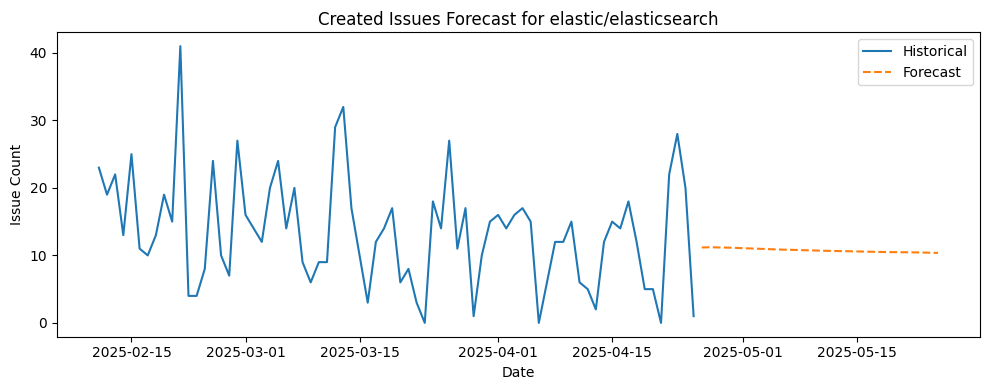

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


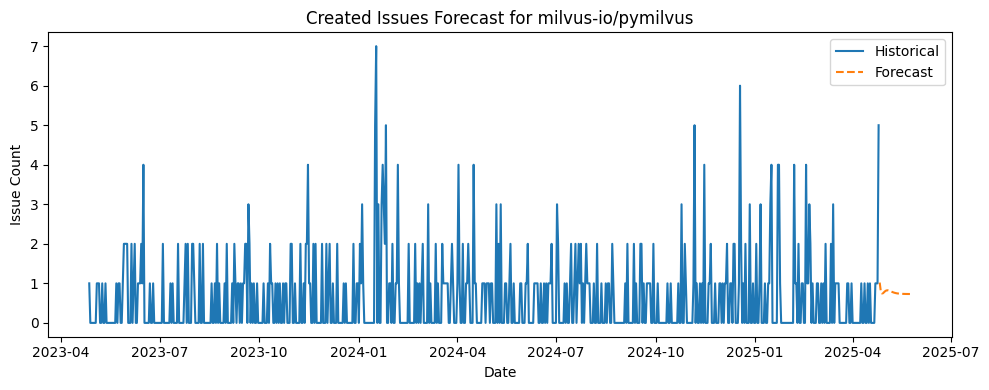

In [18]:
# REQUIREMENT 8.4: Plot created‐issues forecast (30-day history → 30-day forecast)

import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# 1. Load and prepare data
df = pd.read_json('issues.json', lines=True)
df['created_at'] = pd.to_datetime(df['created_at'])

# 2. Filter to last 2 years
today = datetime.now()
two_years_ago = today - timedelta(days=730)
df = df[df['created_at'] >= two_years_ago]

# 3. Settings
window_size      = 30   # days of history
forecast_horizon = 30   # days to predict
epochs           = 10
batch_size       = 16

# 4. Loop over each repository
for repo in df['repository'].unique():
    repo_df = df[df['repository'] == repo]

    # 4a. Daily issue counts
    daily = (
        repo_df
        .set_index('created_at')
        .resample('D')
        .size()
        .rename('count')
        .asfreq('D', fill_value=0)
        .to_frame()
    )

    # 4b. Scale to [0,1]
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(daily)

    # 4c. Build training sequences
    X, y = [], []
    for i in range(len(scaled) - window_size):
        X.append(scaled[i : i + window_size, 0])
        y.append(scaled[i + window_size, 0])
    X = np.array(X).reshape(-1, window_size, 1)
    y = np.array(y)

    # 4d. Build & train LSTM
    model = Sequential([
        LSTM(50, input_shape=(window_size, 1)),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=0)

    # 4e. Forecast next 30 days
    preds = []
    last_window = scaled[-window_size:].reshape(1, window_size, 1)
    for _ in range(forecast_horizon):
        p = model.predict(last_window, verbose=0)[0, 0]
        preds.append(p)
        last_window = np.roll(last_window, -1, axis=1)
        last_window[0, -1, 0] = p

    # 4f. Invert scaling and build date index
    forecast_values = scaler.inverse_transform(np.array(preds).reshape(-1, 1)).flatten()
    future_dates = [daily.index[-1] + timedelta(days=i + 1) for i in range(forecast_horizon)]

    # 5. Plot
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index, daily['count'], label='Historical')
    plt.plot(future_dates, forecast_values, label='Forecast', linestyle='--')
    plt.title(f'Created Issues Forecast for {repo}')
    plt.xlabel('Date')
    plt.ylabel('Issue Count')
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-success">   
    
#### REQ8-5). Plot the closed issues forecast 

</div>

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


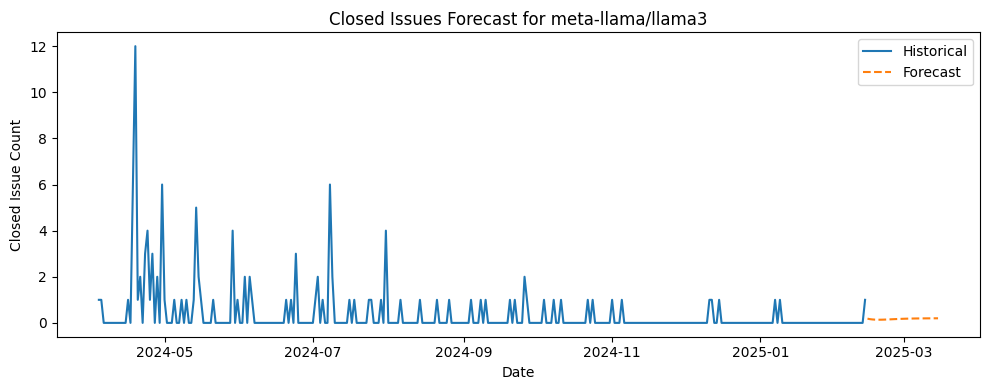

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


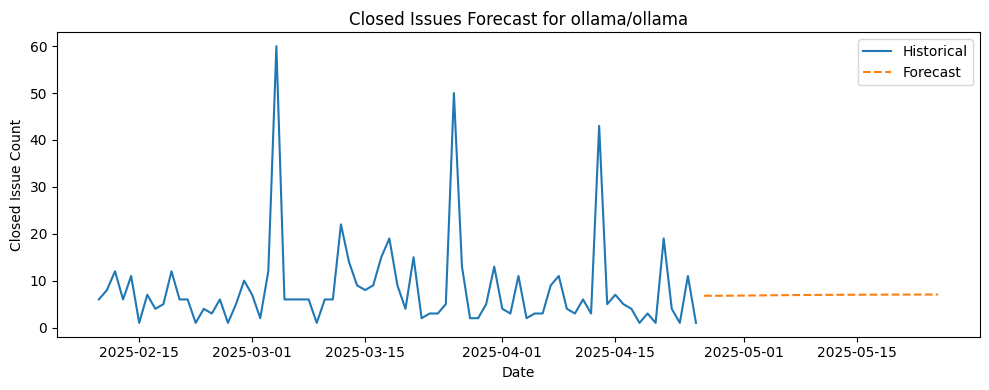

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


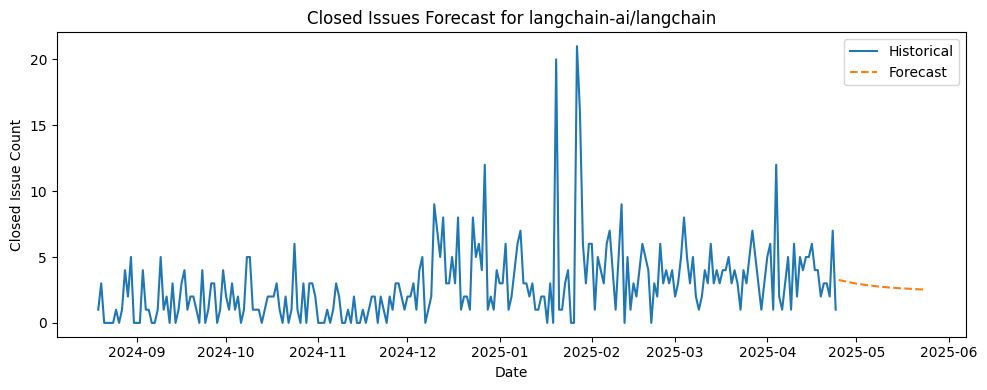

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


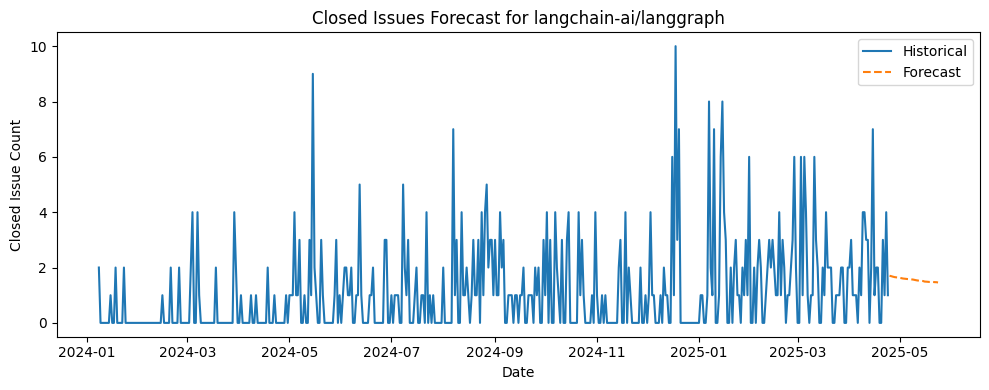

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


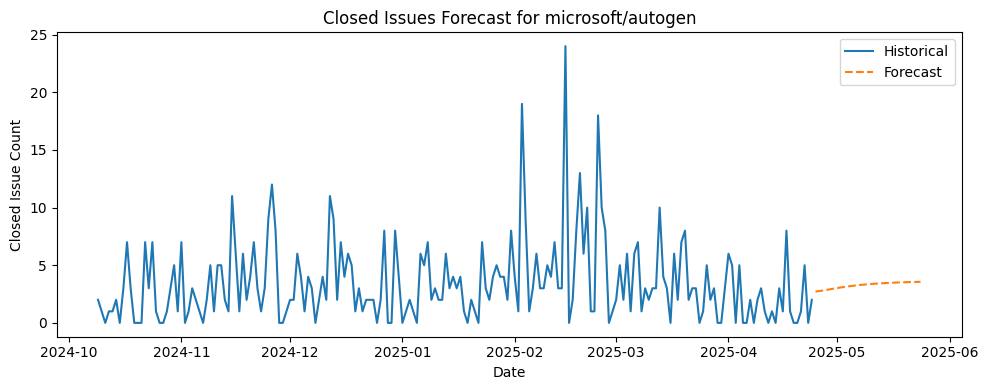

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


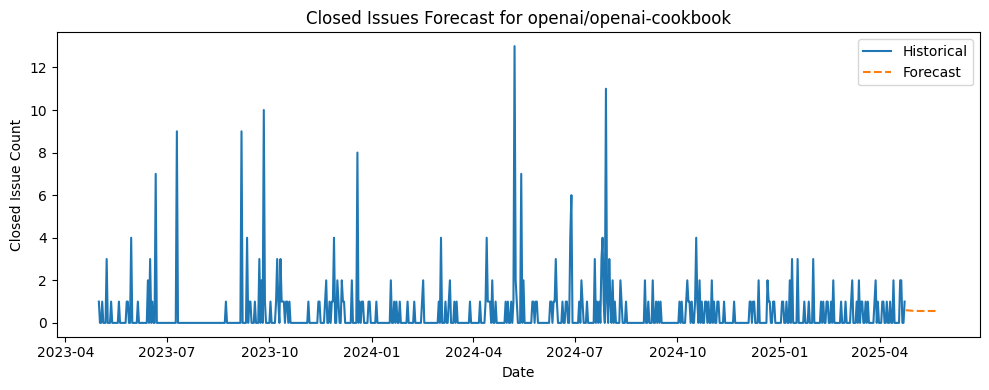

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


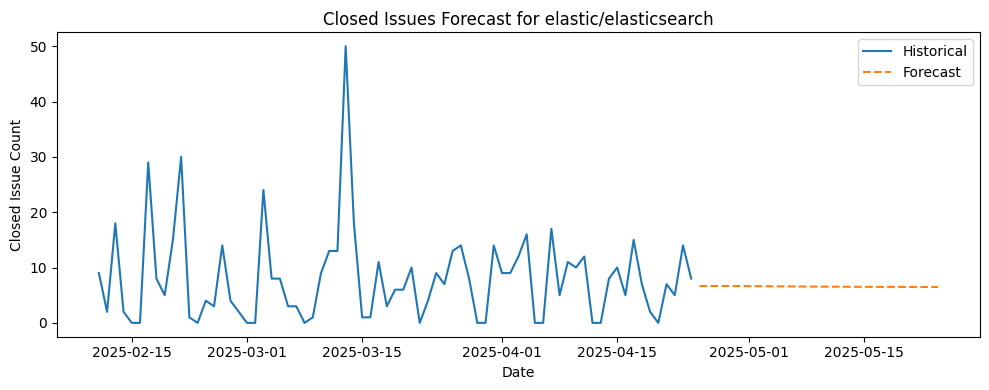

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


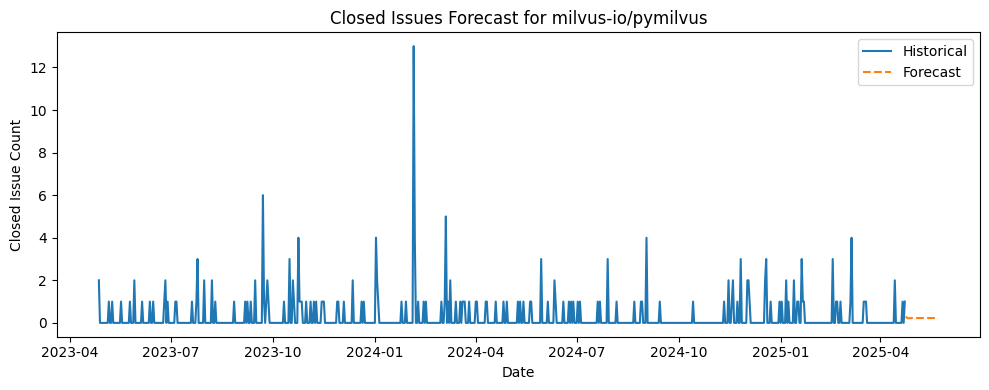

In [19]:
# REQUIREMENT 8.5: Plot closed‐issues forecast (30‐day history → 30‐day forecast)

import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# 1. Load and prepare data
df = pd.read_json('issues.json', lines=True)
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')
df = df.dropna(subset=['closed_at'])

# 2. Filter to last 2 years of closures
today = datetime.now()
two_years_ago = today - timedelta(days=730)
df = df[df['closed_at'] >= two_years_ago]

# 3. Settings
window_size      = 30   # days of history
forecast_horizon = 30   # days to predict
epochs           = 10
batch_size       = 16

# 4. Loop over each repository
for repo in df['repository'].unique():
    repo_df = df[df['repository'] == repo]

    # 4a. Daily closed‐issue counts
    daily_closed = (
        repo_df
        .set_index('closed_at')
        .resample('D')
        .size()
        .rename('count')
        .asfreq('D', fill_value=0)
        .to_frame()
    )

    # 4b. Scale to [0,1]
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(daily_closed)

    # 4c. Build training sequences
    X, y = [], []
    for i in range(len(scaled) - window_size):
        X.append(scaled[i : i + window_size, 0])
        y.append(scaled[i + window_size, 0])
    X = np.array(X).reshape(-1, window_size, 1)
    y = np.array(y)

    # 4d. Build & train LSTM
    model = Sequential([
        LSTM(50, input_shape=(window_size, 1)),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=0)

    # 4e. Forecast next 30 days
    preds = []
    last_window = scaled[-window_size:].reshape(1, window_size, 1)
    for _ in range(forecast_horizon):
        p = model.predict(last_window, verbose=0)[0, 0]
        preds.append(p)
        last_window = np.roll(last_window, -1, axis=1)
        last_window[0, -1, 0] = p

    # 4f. Invert scaling and build date index
    forecast_vals = scaler.inverse_transform(np.array(preds).reshape(-1, 1)).flatten()
    future_dates = [daily_closed.index[-1] + timedelta(days=i + 1) for i in range(forecast_horizon)]

    # 5. Plot
    plt.figure(figsize=(10, 4))
    plt.plot(daily_closed.index, daily_closed['count'], label='Historical')
    plt.plot(future_dates, forecast_vals, label='Forecast', linestyle='--')
    plt.title(f'Closed Issues Forecast for {repo}')
    plt.xlabel('Date')
    plt.ylabel('Closed Issue Count')
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-success">   
    
#### REQ8-6). Plot the pulls forecast 

</div>


▶ Processing pull‐request forecast for meta-llama/llama3…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


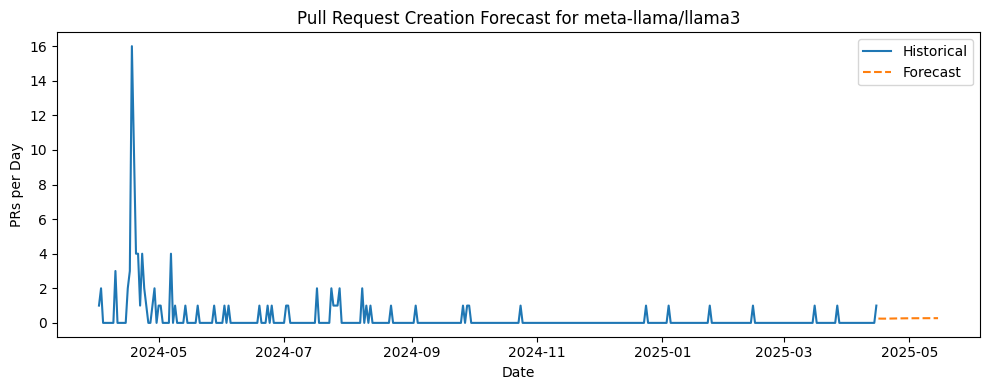


▶ Processing pull‐request forecast for ollama/ollama…


Request GET /search/issues?q=type%3Apr+repo%3Aollama%2Follama+created%3A%3E%3D2023-04-26T05%3A57%3A42.056217Z&page=27 failed with 403: Forbidden
Setting next backoff to 32.172878s
c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


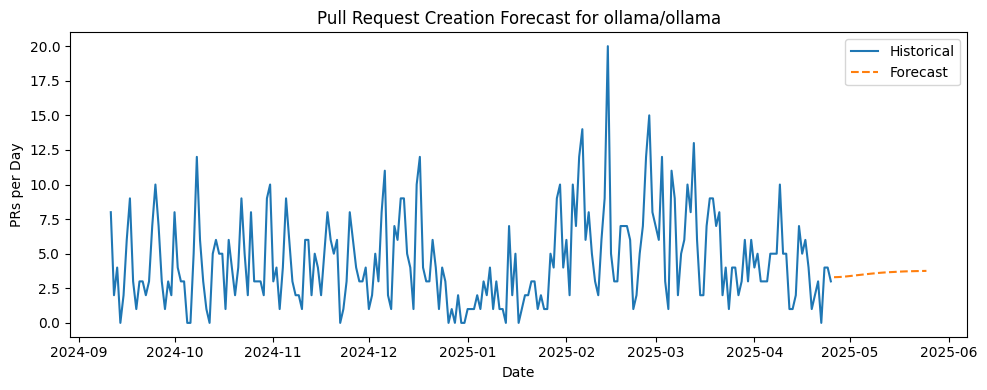


▶ Processing pull‐request forecast for langchain-ai/langchain…


Request GET /search/issues?q=type%3Apr+repo%3Alangchain-ai%2Flangchain+created%3A%3E%3D2023-04-26T05%3A57%3A42.056217Z&page=23 failed with 403: Forbidden
Setting next backoff to 31.230453s
c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


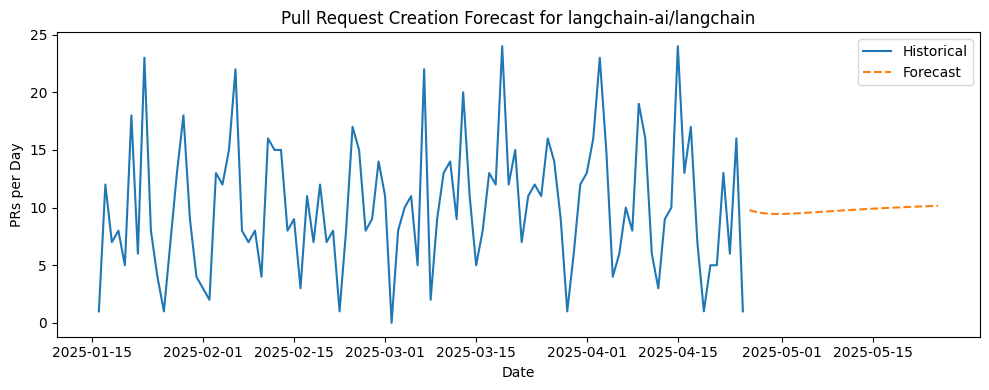


▶ Processing pull‐request forecast for langchain-ai/langgraph…


Request GET /search/issues?q=type%3Apr+repo%3Alangchain-ai%2Flanggraph+created%3A%3E%3D2023-04-26T05%3A57%3A42.056217Z&page=19 failed with 403: Forbidden
Setting next backoff to 31.691403s
c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


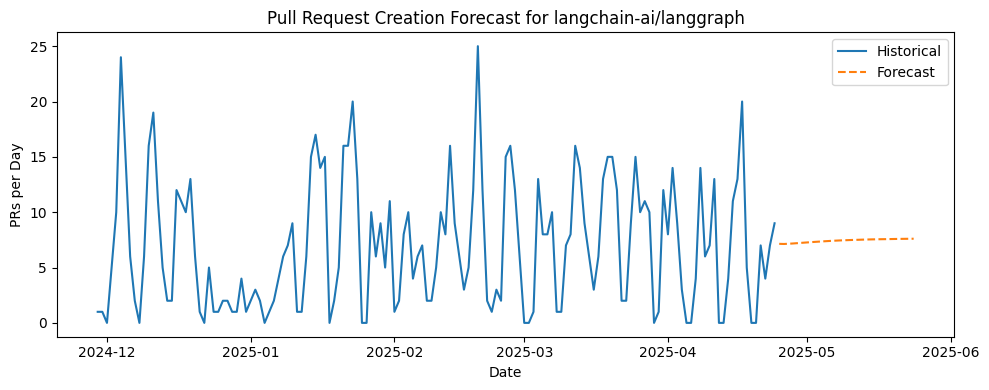


▶ Processing pull‐request forecast for microsoft/autogen…


Request GET /search/issues?q=type%3Apr+repo%3Amicrosoft%2Fautogen+created%3A%3E%3D2023-04-26T05%3A57%3A42.056217Z&page=15 failed with 403: Forbidden
Setting next backoff to 32.005457s
c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


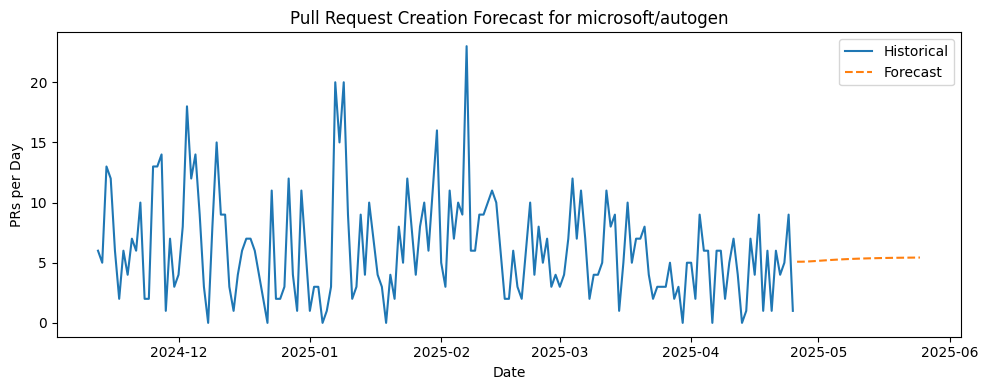


▶ Processing pull‐request forecast for openai/openai-cookbook…


Request GET /search/issues?q=type%3Apr+repo%3Aopenai%2Fopenai-cookbook+created%3A%3E%3D2023-04-26T05%3A57%3A42.056217Z&page=11 failed with 403: Forbidden
Setting next backoff to 31.449057s
c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


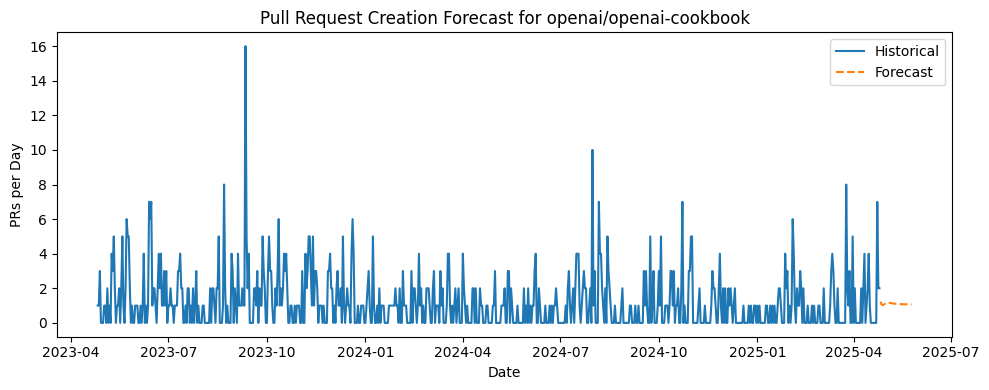


▶ Processing pull‐request forecast for elastic/elasticsearch…


Request GET /search/issues?q=type%3Apr+repo%3Aelastic%2Felasticsearch+created%3A%3E%3D2023-04-26T05%3A57%3A42.056217Z&page=11 failed with 403: Forbidden
Setting next backoff to 30.224778s


  ⚠️ Skipping elastic/elasticsearch: only 25 days of data (need 30).

▶ Processing pull‐request forecast for milvus-io/pymilvus…


Request GET /search/issues?q=type%3Apr+repo%3Amilvus-io%2Fpymilvus+created%3A%3E%3D2023-04-26T05%3A57%3A42.056217Z&page=7 failed with 403: Forbidden
Setting next backoff to 33.902237s
c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


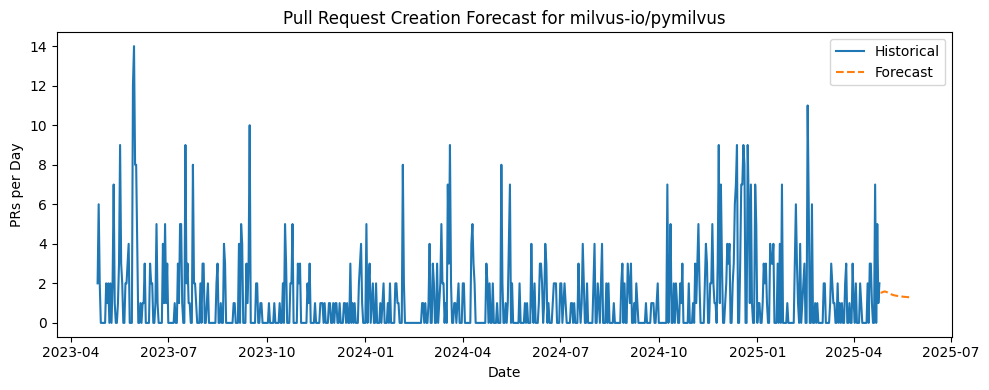

In [ ]:
# REQUIREMENT 8.6: Plot pull‐requests creation forecast (30‐day history → 30‐day forecast)

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# ── ML imports ───────────────────────────────────────────────────────────────
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# ── GitHub API import ───────────────────────────────────────────────────────
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
gh = Github(GITHUB_TOKEN)

REPOSITORIES = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

# ── TIME CUTOFF ──────────────────────────────────────────────────────────────
now_utc = datetime.utcnow()
two_years_ago = now_utc - timedelta(days=730)

# ── FORECAST SETTINGS ───────────────────────────────────────────────────────
WINDOW_SIZE      = 30   # days of history per sample
FORECAST_HORIZON = 30   # days to forecast
EPOCHS           = 10
BATCH_SIZE       = 16

for repo_full in REPOSITORIES:
    print(f"\n▶ Processing pull‐request forecast for {repo_full}…")
    # 1) Fetch all PR creation dates in the last 2 years
    query = f"type:pr repo:{repo_full} created:>={two_years_ago.isoformat()}Z"
    pulls = gh.search_issues(query)
    dates = [pr.created_at for pr in pulls]

    if not dates:
        print(f"  – No pull requests in the last 2 years for {repo_full}")
        continue

    # 2) Build daily count series
    df = pd.DataFrame({"date": pd.to_datetime(dates)})
    daily = (
        df.set_index("date")
          .resample("D")
          .size()
          .rename("count")
          .asfreq("D", fill_value=0)
          .to_frame()
    )

    # 3) Normalize
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(daily)

    # Guard: need at least WINDOW_SIZE days
    if len(scaled) < WINDOW_SIZE:
        print(f"  ⚠️ Skipping {repo_full}: only {len(scaled)} days of data (need {WINDOW_SIZE}).")
        continue

    # 4) Build sequences
    X, y = [], []
    for i in range(len(scaled) - WINDOW_SIZE):
        X.append(scaled[i : i + WINDOW_SIZE, 0])
        y.append(scaled[i + WINDOW_SIZE, 0])
    X = np.array(X).reshape(-1, WINDOW_SIZE, 1)
    y = np.array(y)

    # 5) Define & train LSTM
    model = Sequential([
        LSTM(50, input_shape=(WINDOW_SIZE, 1)),
        Dense(1)
    ])
    model.compile(optimizer="adam", loss="mse")
    model.fit(X, y, epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=0)

    # 6) Forecast next FORECAST_HORIZON days
    preds = []
    window = scaled[-WINDOW_SIZE:].reshape(1, WINDOW_SIZE, 1)
    for _ in range(FORECAST_HORIZON):
        p = model.predict(window, verbose=0)[0, 0]
        preds.append(p)
        window = np.roll(window, -1, axis=1)
        window[0, -1, 0] = p

    # 7) Inverse‐scale & build future index
    forecast_vals = scaler.inverse_transform(np.array(preds).reshape(-1, 1)).flatten()
    last_day = daily.index[-1]
    future_days = [last_day + timedelta(days=i+1) for i in range(FORECAST_HORIZON)]

    # 8) Plot
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index, daily["count"], label="Historical")
    plt.plot(future_days, forecast_vals, linestyle="--", label="Forecast")
    plt.title(f"Pull Request Creation Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("PRs per Day")
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-success">   
    
#### REQ8-7). Plot the commits forecast

</div>

c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


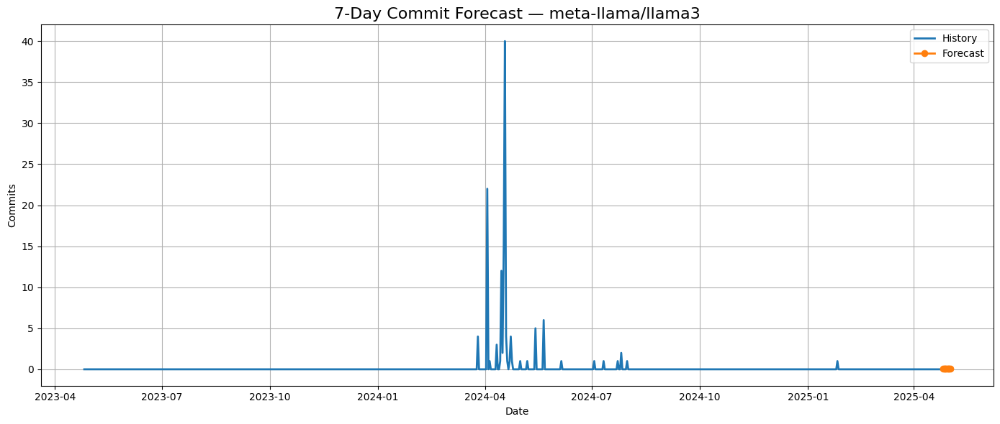

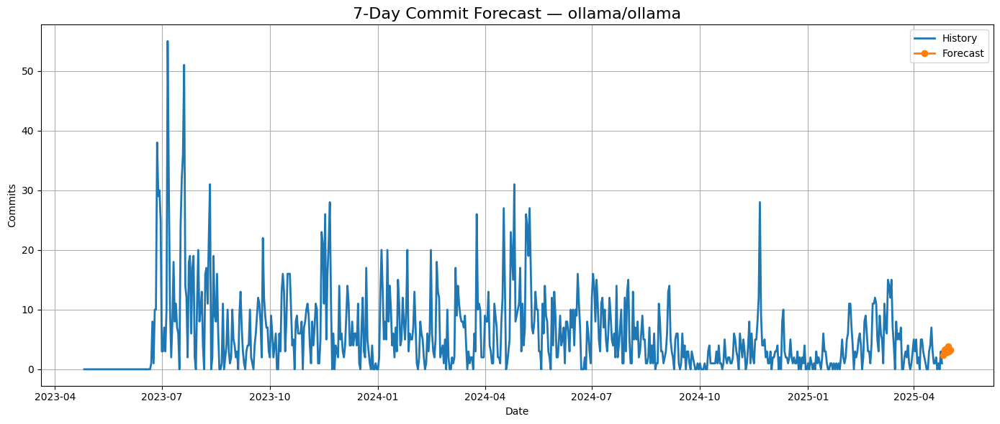

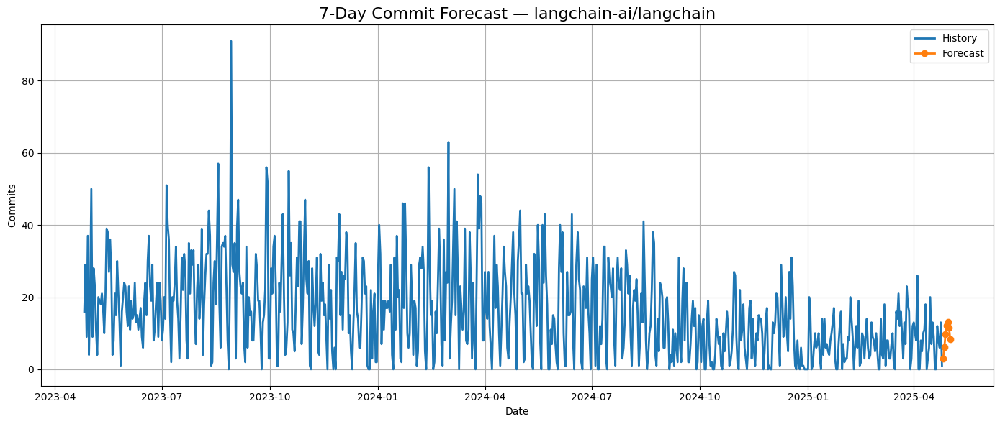

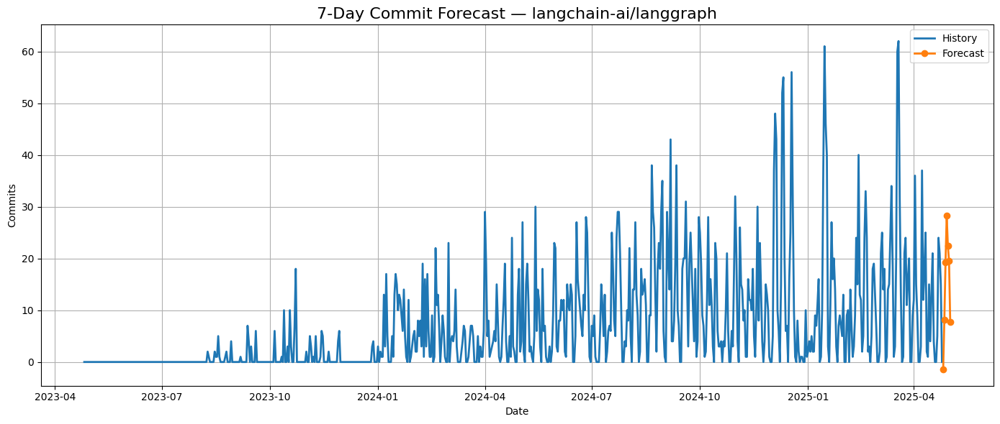

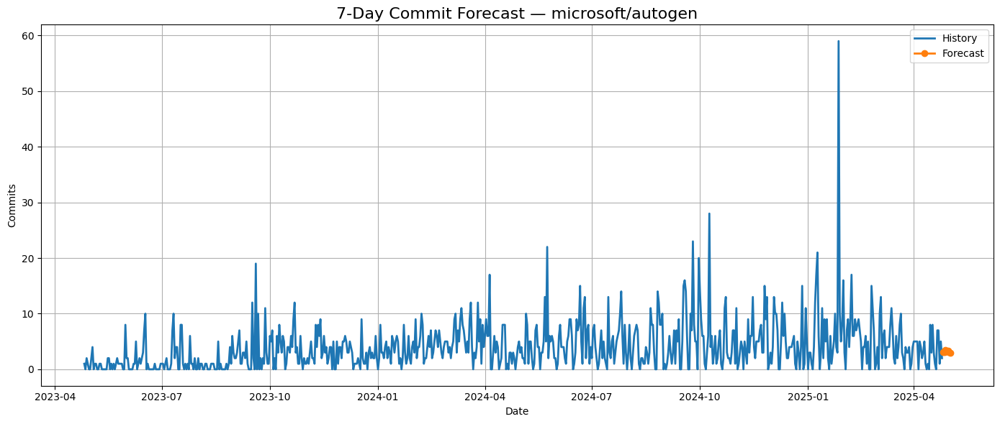

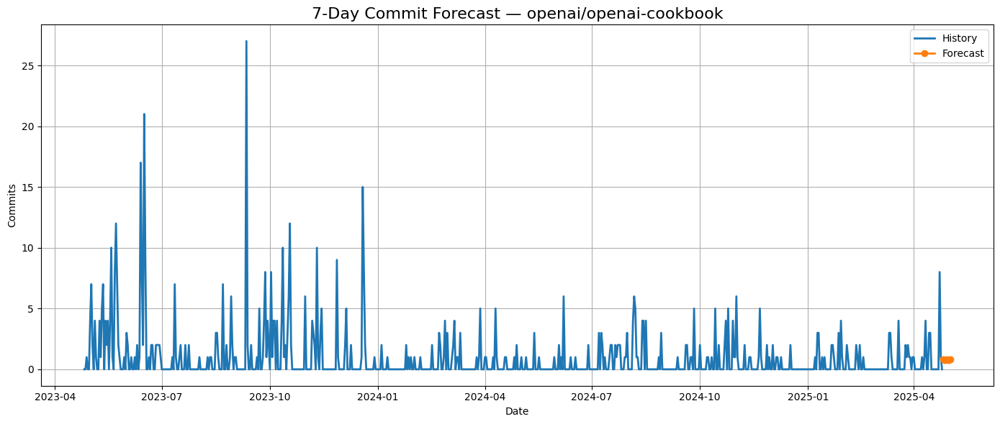

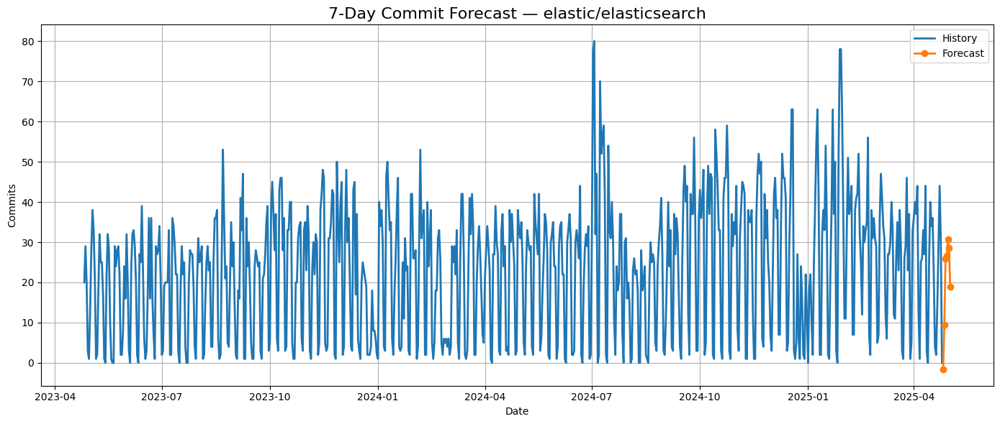

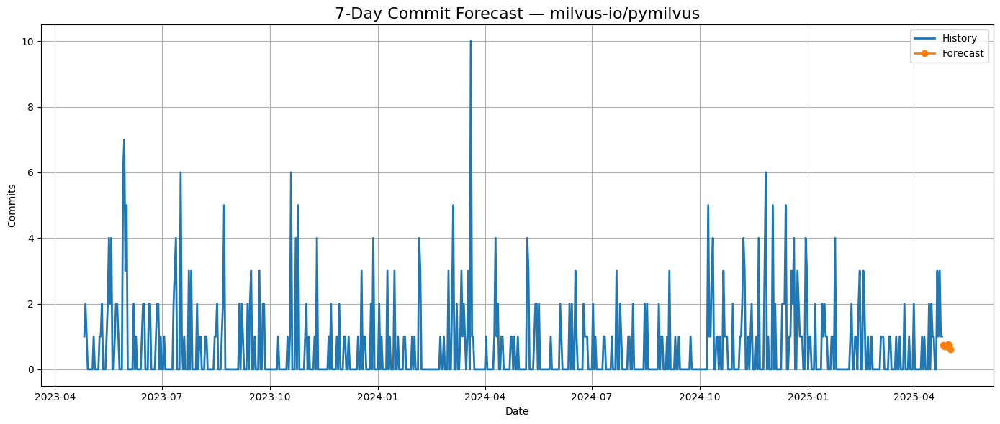

In [ ]:
import os, json, pandas as pd, numpy as np, matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone
from github import Github
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

TOKEN = ""       # set your PAT in the environment
REPOS = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

N_IN, N_OUT = 30, 7                      # 30-day window → 7-day forecast
CUTOFF      = datetime.now(timezone.utc) - timedelta(days=365*2)

gh = Github(TOKEN)

for repo_name in REPOS:
    repo   = gh.get_repo(repo_name)
    counts = {}                          # daily commit counts

    for commit in repo.get_commits(since=CUTOFF):
        day = commit.commit.author.date.date()
        counts[day] = counts.get(day, 0) + 1

    dates  = pd.date_range(CUTOFF.date(), datetime.now(timezone.utc).date(), freq="D")
    series = pd.Series([counts.get(d.date(), 0) for d in dates], index=dates)

    vals = series.values.astype(np.float32)

    X, y = [], []
    for i in range(len(vals) - N_IN - N_OUT + 1):
        X.append(vals[i:i+N_IN])
        y.append(vals[i+N_IN:i+N_IN+N_OUT])
    X = np.array(X).reshape(-1, N_IN, 1)
    y = np.array(y)

    model = Sequential([LSTM(50, activation="relu", input_shape=(N_IN,1)),
                        Dense(N_OUT)])
    model.compile("adam", "mse")
    model.fit(X, y, epochs=20, verbose=0)

    forecast = model.predict(vals[-N_IN:].reshape(1, N_IN, 1), verbose=0)[0]
    future   = [series.index[-1] + timedelta(days=i) for i in range(1, N_OUT+1)]

    plt.figure(figsize=(14,6))
    plt.plot(series.index, vals, label="History", linewidth=2)
    plt.plot(future, forecast, marker="o", label="Forecast", linewidth=2)
    plt.title(f"7-Day Commit Forecast — {repo_name}", fontsize=16)
    plt.xlabel("Date"), plt.ylabel("Commits")
    plt.legend(); plt.grid(True); plt.tight_layout(); plt.show()


<div class="alert alert-block alert-success">   
    
#### REQ8-8). Plot the branches forecast

</div>


▶ Processing branch‐creation forecast for meta-llama/llama3…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


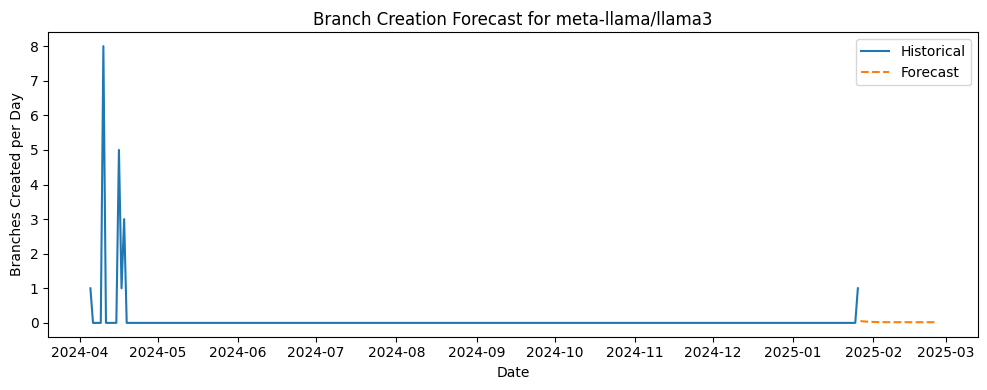


▶ Processing branch‐creation forecast for ollama/ollama…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


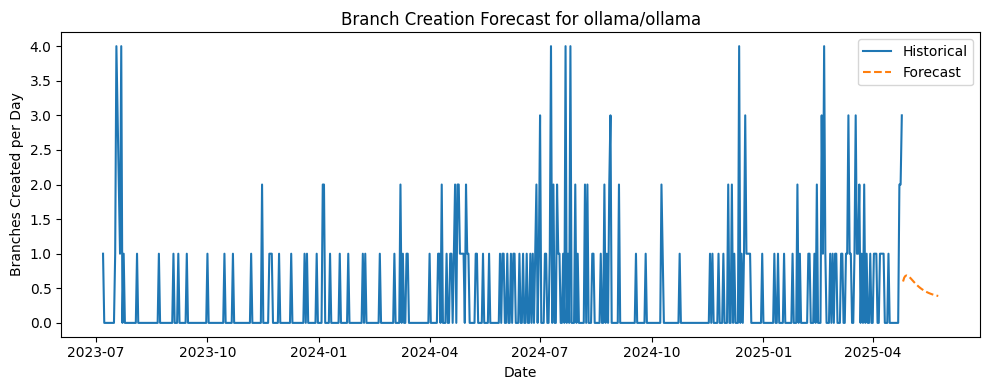


▶ Processing branch‐creation forecast for langchain-ai/langchain…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


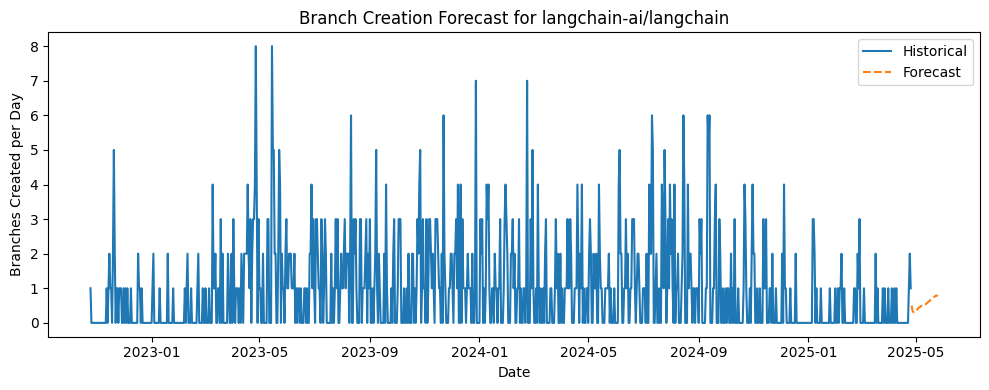


▶ Processing branch‐creation forecast for langchain-ai/langgraph…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


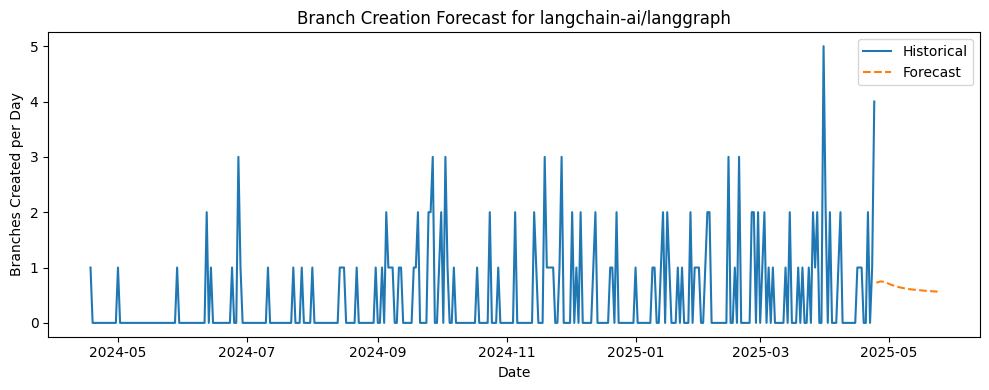


▶ Processing branch‐creation forecast for microsoft/autogen…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


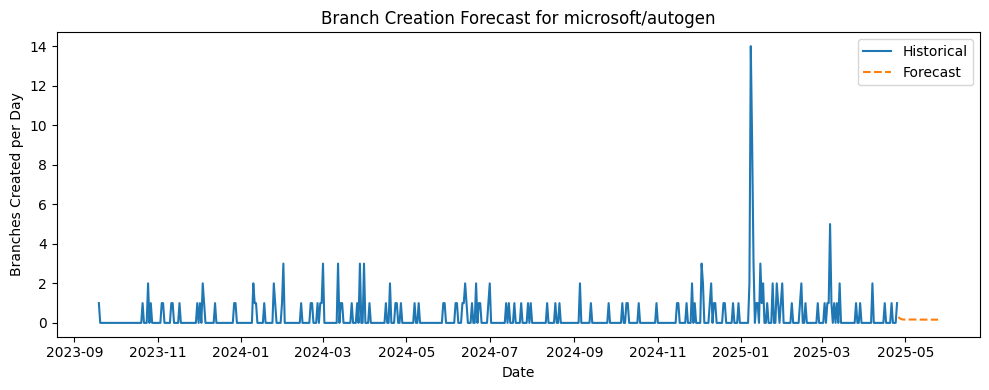


▶ Processing branch‐creation forecast for openai/openai-cookbook…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


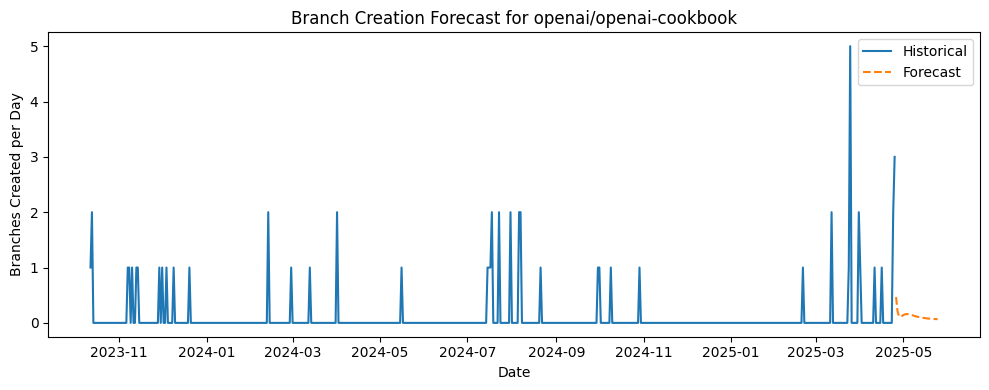


▶ Processing branch‐creation forecast for elastic/elasticsearch…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


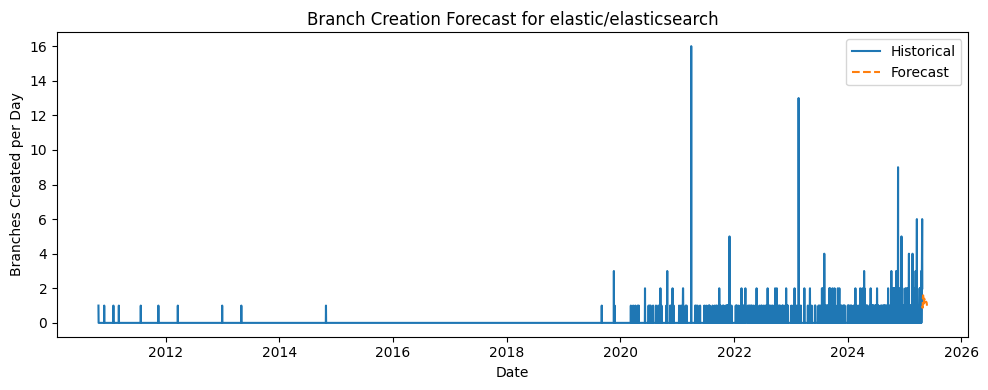


▶ Processing branch‐creation forecast for milvus-io/pymilvus…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


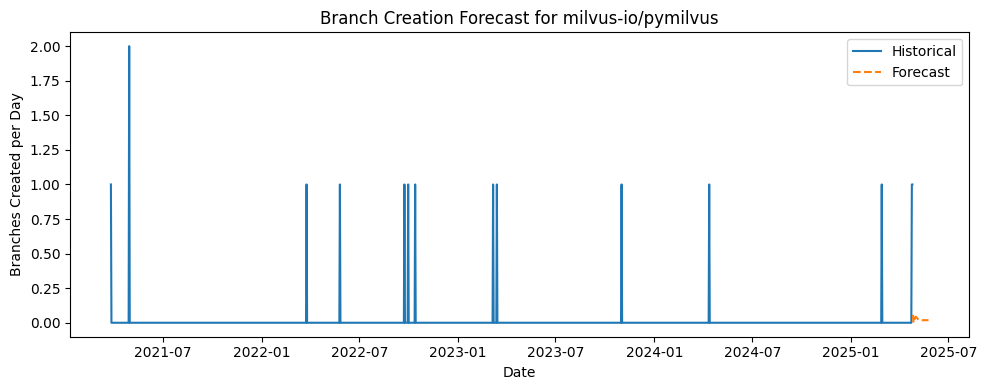

In [ ]:
# REQUIREMENT 8.8: Plot branch‐creation forecast (30‐day history → 30‐day forecast)

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# ── ML imports ───────────────────────────────────────────────────────────────
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# ── GitHub API import ───────────────────────────────────────────────────────
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
gh = Github(GITHUB_TOKEN)

REPOSITORIES = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

# ── TIME CUTOFF ──────────────────────────────────────────────────────────────
now_utc = datetime.utcnow()
two_years_ago = now_utc - timedelta(days=730)

# ── FORECAST SETTINGS ───────────────────────────────────────────────────────
WINDOW_SIZE      = 30   # days of history per sample
FORECAST_HORIZON = 30   # days to forecast
EPOCHS           = 10
BATCH_SIZE       = 16

for repo_full in REPOSITORIES:
    print(f"\n▶ Processing branch‐creation forecast for {repo_full}…")
    # 1) Fetch all branches and use each branch’s head commit date as its “creation”
    repo = gh.get_repo(repo_full)
    branches = repo.get_branches()
    dates = [b.commit.commit.author.date for b in branches]

    if not dates:
        print(f"  – No branches found for {repo_full}")
        continue

    # 2) Build daily count series of new branches
    df = pd.DataFrame({"date": pd.to_datetime(dates)})
    daily = (
        df.set_index("date")
          .resample("D")
          .size()
          .rename("count")
          .asfreq("D", fill_value=0)
          .to_frame()
    )

    # 3) Normalize
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(daily)

    # Guard: need at least WINDOW_SIZE days of data
    if len(scaled) < WINDOW_SIZE:
        print(f"  ⚠️ Skipping {repo_full}: only {len(scaled)} days of data (need {WINDOW_SIZE}).")
        continue

    # 4) Build training sequences
    X, y = [], []
    for i in range(len(scaled) - WINDOW_SIZE):
        X.append(scaled[i : i + WINDOW_SIZE, 0])
        y.append(scaled[i + WINDOW_SIZE, 0])
    X = np.array(X).reshape(-1, WINDOW_SIZE, 1)
    y = np.array(y)

    # 5) Define & train LSTM
    model = Sequential([
        LSTM(50, input_shape=(WINDOW_SIZE, 1)),
        Dense(1)
    ])
    model.compile(optimizer="adam", loss="mse")
    model.fit(X, y, epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=0)

    # 6) Forecast next FORECAST_HORIZON days
    preds = []
    window = scaled[-WINDOW_SIZE:].reshape(1, WINDOW_SIZE, 1)
    for _ in range(FORECAST_HORIZON):
        p = model.predict(window, verbose=0)[0, 0]
        preds.append(p)
        window = np.roll(window, -1, axis=1)
        window[0, -1, 0] = p

    # 7) Inverse‐scale & build future index
    forecast_vals = scaler.inverse_transform(np.array(preds).reshape(-1, 1)).flatten()
    last_day = daily.index[-1]
    future_days = [last_day + timedelta(days=i+1) for i in range(FORECAST_HORIZON)]

    # 8) Plot
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index, daily["count"], label="Historical")
    plt.plot(future_days, forecast_vals, linestyle="--", label="Forecast")
    plt.title(f"Branch Creation Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("Branches Created per Day")
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-success">   
    
#### REQ8-9). Plot the contributors forecast

</div>


▶ Processing contributor‐forecast for meta-llama/llama3…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


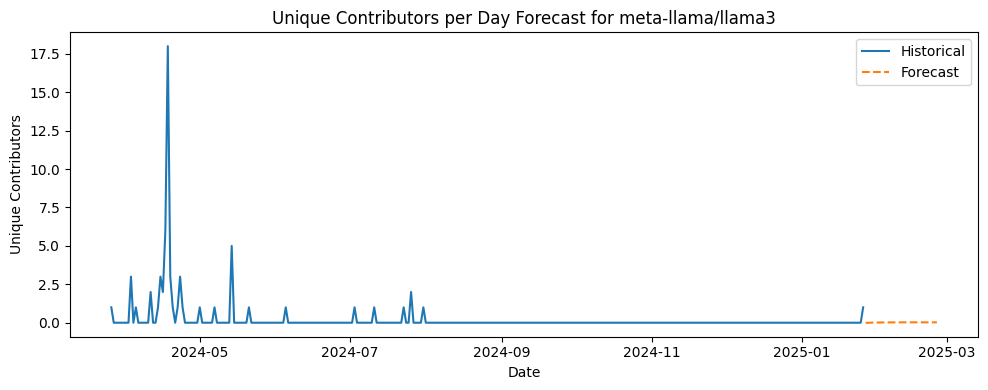


▶ Processing contributor‐forecast for ollama/ollama…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


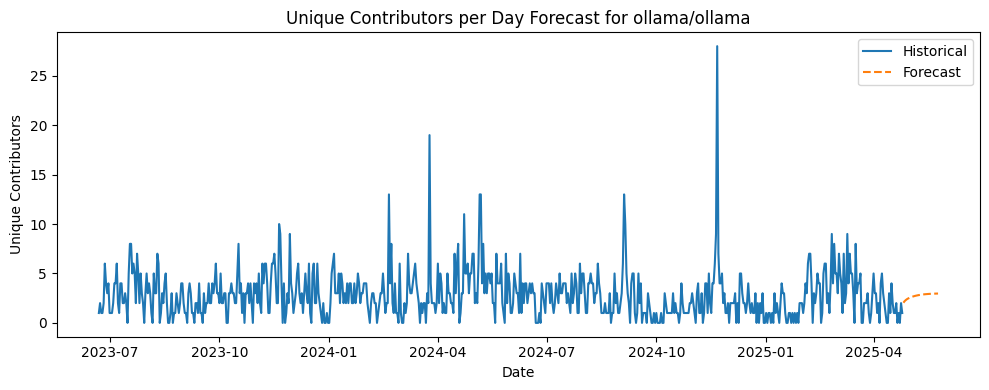


▶ Processing contributor‐forecast for langchain-ai/langchain…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


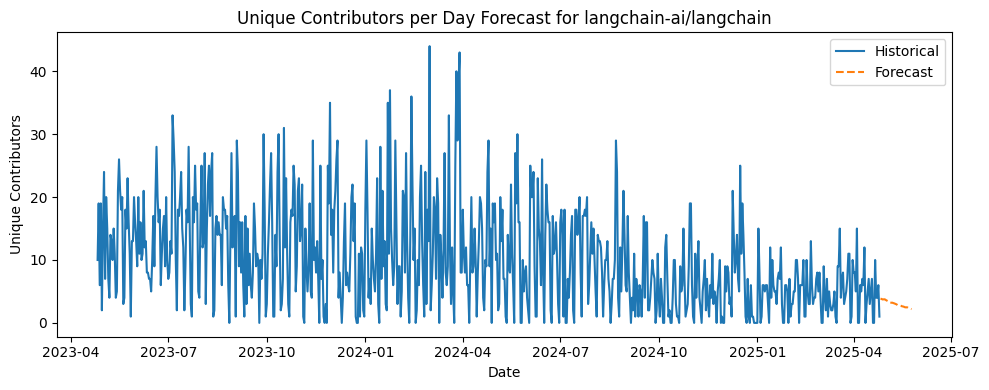


▶ Processing contributor‐forecast for langchain-ai/langgraph…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


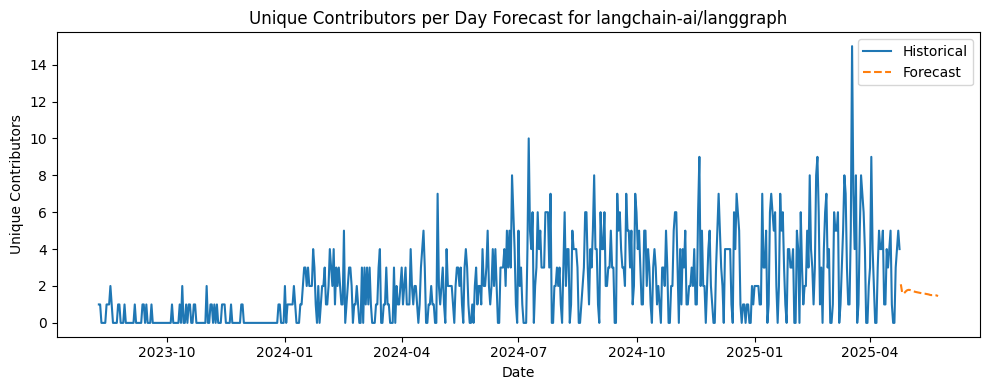


▶ Processing contributor‐forecast for microsoft/autogen…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


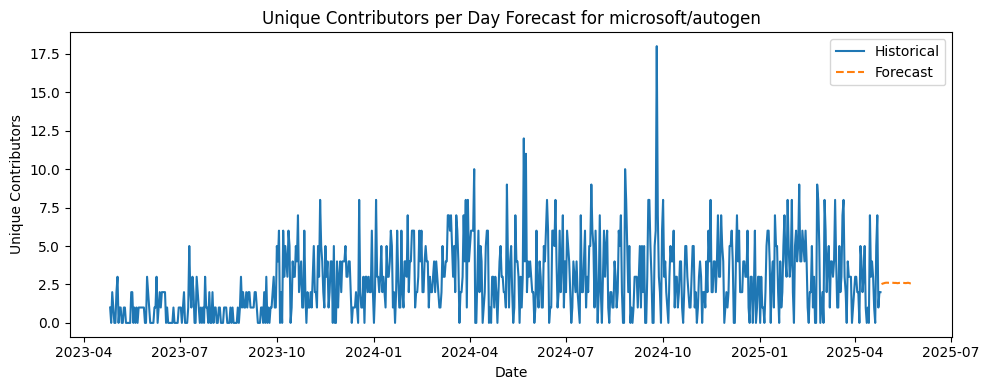


▶ Processing contributor‐forecast for openai/openai-cookbook…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


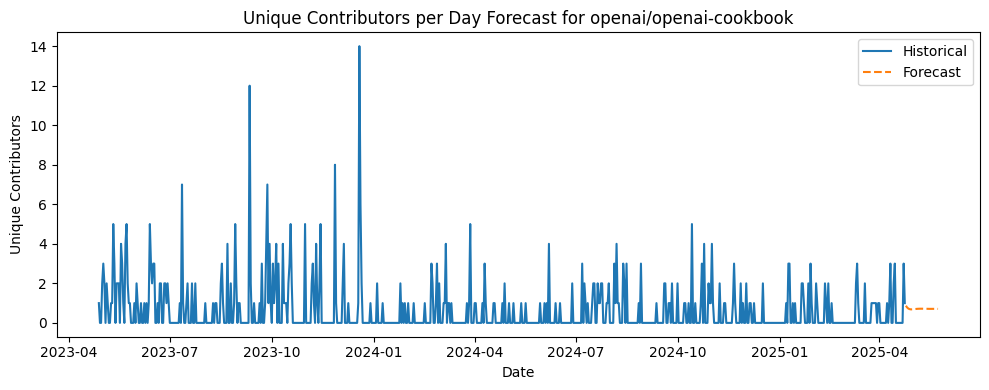


▶ Processing contributor‐forecast for elastic/elasticsearch…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


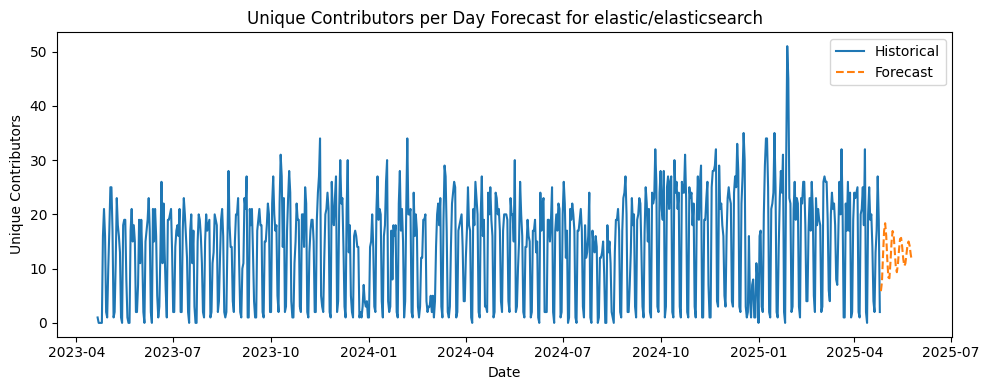


▶ Processing contributor‐forecast for milvus-io/pymilvus…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


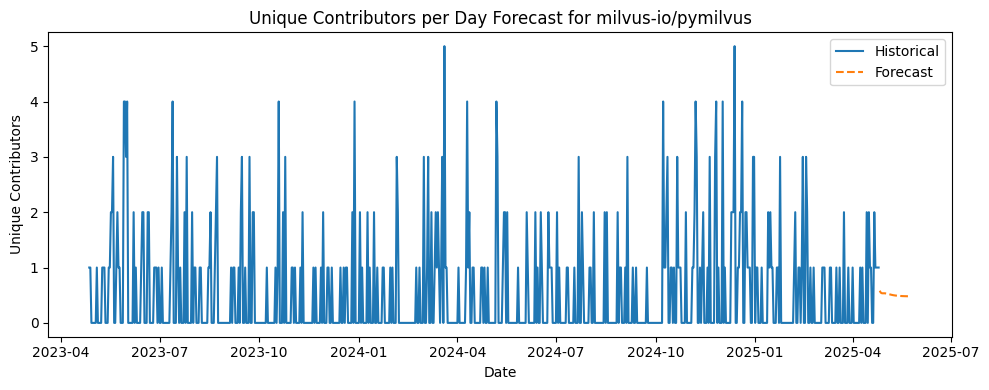

In [ ]:
# REQUIREMENT 8.9: Plot contributor‐count forecast (30‐day history → 30‐day forecast)

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# ── ML imports ───────────────────────────────────────────────────────────────
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# ── GitHub API import ───────────────────────────────────────────────────────
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
gh = Github(GITHUB_TOKEN)

REPOSITORIES = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

# ── TIME CUTOFF ──────────────────────────────────────────────────────────────
now_utc       = datetime.utcnow()
two_years_ago = now_utc - timedelta(days=730)

# ── FORECAST SETTINGS ───────────────────────────────────────────────────────
WINDOW_SIZE      = 30   # days of history per sample
FORECAST_HORIZON = 30   # days to forecast
EPOCHS           = 10
BATCH_SIZE       = 16

for repo_full in REPOSITORIES:
    print(f"\n▶ Processing contributor‐forecast for {repo_full}…")
    repo = gh.get_repo(repo_full)

    # 1) Fetch all commits in the last 2 years
    commits = repo.get_commits(since=two_years_ago)
    # collect (date, author) pairs
    data = []
    for c in commits:
        dt = c.commit.author.date.date()
        author = c.author.login if c.author else c.commit.author.name
        data.append((dt, author))

    if not data:
        print(f"  – No commits for {repo_full}")
        continue

    # 2) Build daily unique‐author counts
    df = pd.DataFrame(data, columns=['date','author'])
    df['date'] = pd.to_datetime(df['date'])
    daily = (
        df
        .groupby('date')['author']
        .nunique()
        .rename('count')
        .asfreq('D', fill_value=0)
        .to_frame()
    )

    # 3) Normalize
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(daily)

    # Guard: need at least WINDOW_SIZE days
    if len(scaled) < WINDOW_SIZE:
        print(f"  ⚠️ Skipping {repo_full}: only {len(scaled)} days (need {WINDOW_SIZE}).")
        continue

    # 4) Build sequences
    X, y = [], []
    for i in range(len(scaled) - WINDOW_SIZE):
        X.append(scaled[i : i + WINDOW_SIZE, 0])
        y.append(scaled[i + WINDOW_SIZE, 0])
    X = np.array(X).reshape(-1, WINDOW_SIZE, 1)
    y = np.array(y)

    # 5) Define & train LSTM
    model = Sequential([
        LSTM(50, input_shape=(WINDOW_SIZE, 1)),
        Dense(1)
    ])
    model.compile(optimizer="adam", loss="mse")
    model.fit(X, y, epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=0)

    # 6) Forecast next FORECAST_HORIZON days
    preds = []
    window = scaled[-WINDOW_SIZE:].reshape(1, WINDOW_SIZE, 1)
    for _ in range(FORECAST_HORIZON):
        p = model.predict(window, verbose=0)[0, 0]
        preds.append(p)
        window = np.roll(window, -1, axis=1)
        window[0, -1, 0] = p

    # 7) Inverse‐scale & build future index
    forecast_vals = scaler.inverse_transform(np.array(preds).reshape(-1, 1)).flatten()
    last_day = daily.index[-1]
    future_days = [last_day + timedelta(days=i+1) for i in range(FORECAST_HORIZON)]

    # 8) Plot
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index, daily["count"], label="Historical")
    plt.plot(future_days, forecast_vals, linestyle="--", label="Forecast")
    plt.title(f"Unique Contributors per Day Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("Unique Contributors")
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-success">   
    
#### REQ8-10). Plot the releases forecast

</div>


▶ Processing releases forecast for meta-llama/llama3…
  – No releases in the last 2 years for meta-llama/llama3

▶ Processing releases forecast for ollama/ollama…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


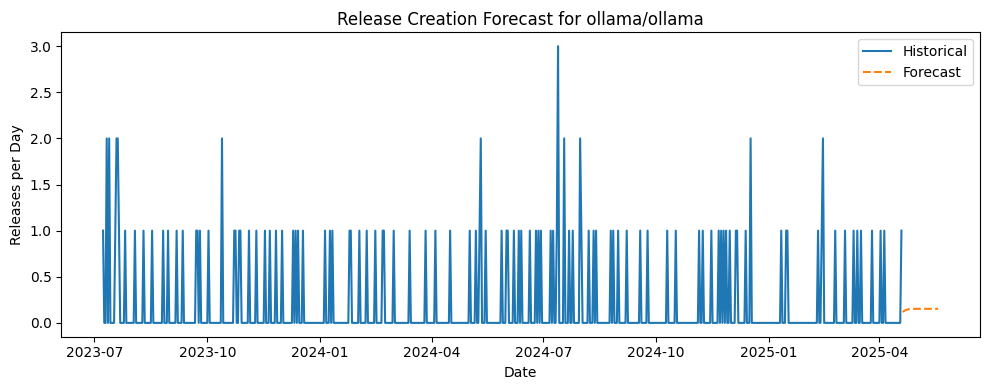


▶ Processing releases forecast for langchain-ai/langchain…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


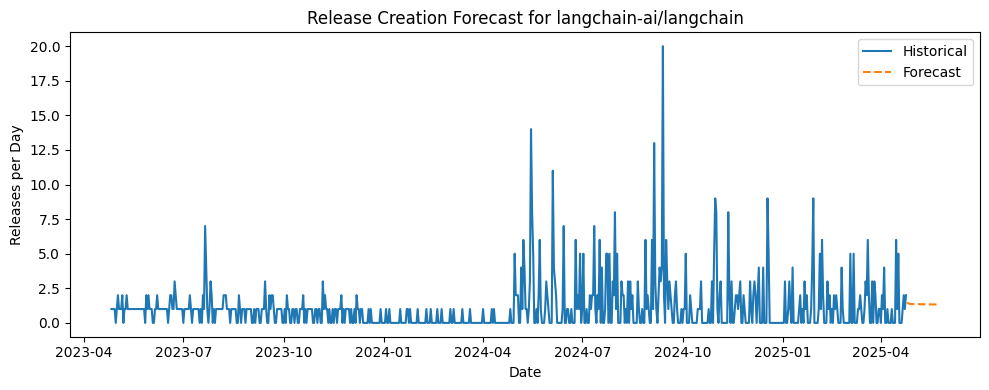


▶ Processing releases forecast for langchain-ai/langgraph…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


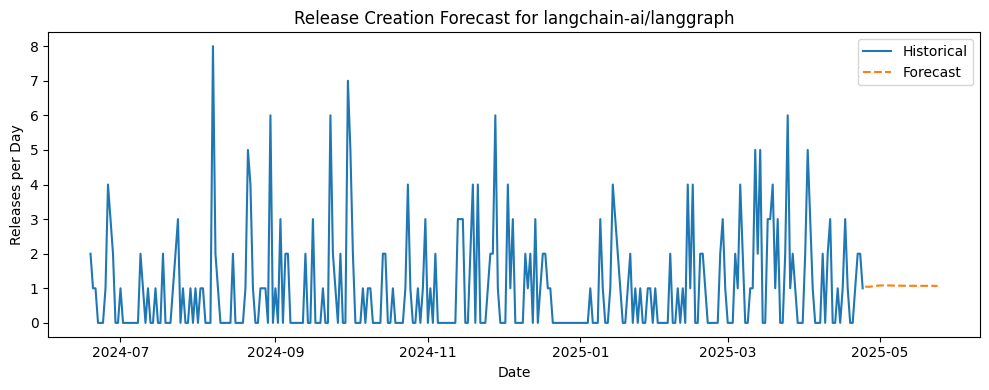


▶ Processing releases forecast for microsoft/autogen…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


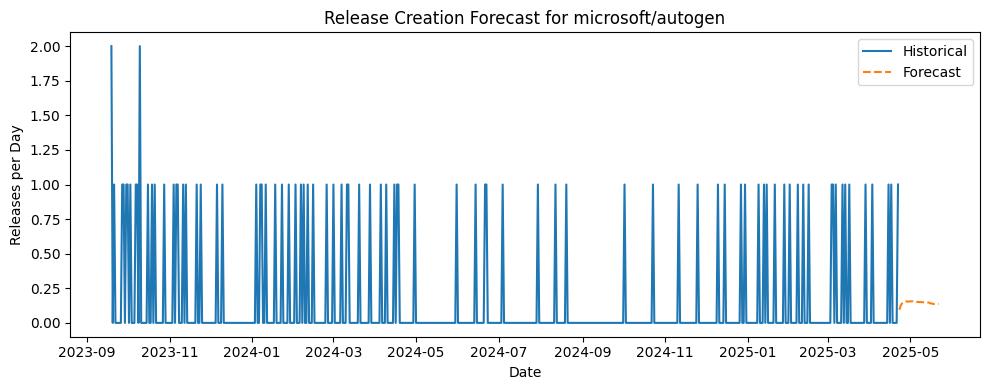


▶ Processing releases forecast for openai/openai-cookbook…
  – No releases in the last 2 years for openai/openai-cookbook

▶ Processing releases forecast for elastic/elasticsearch…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


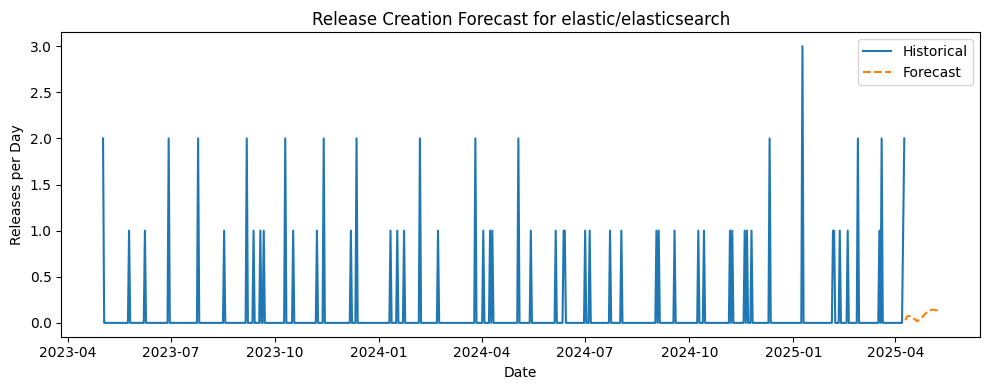


▶ Processing releases forecast for milvus-io/pymilvus…


c:\Users\ASUS\Desktop\IIT\SEM 2\SPM\Assignments\HW5_SINGH_JIVAN\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


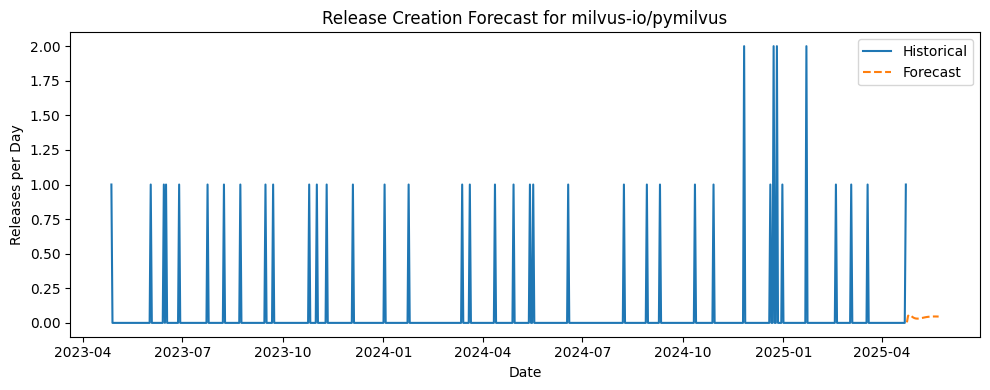

In [ ]:
# REQUIREMENT 8.10: Plot release‐creation forecast (30‐day history → 30‐day forecast)

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone

# ── ML imports ───────────────────────────────────────────────────────────────
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# ── GitHub API import ───────────────────────────────────────────────────────
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""

gh = Github(GITHUB_TOKEN)

REPOSITORIES = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

# ── TIME CUTOFF ──────────────────────────────────────────────────────────────
now_utc      = datetime.now(timezone.utc)
two_years_ago = now_utc - timedelta(days=730)

# ── FORECAST SETTINGS ───────────────────────────────────────────────────────
WINDOW_SIZE      = 30   # days of history per sample
FORECAST_HORIZON = 30   # days to forecast
EPOCHS           = 10
BATCH_SIZE       = 16

for repo_full in REPOSITORIES:
    print(f"\n▶ Processing releases forecast for {repo_full}…")
    repo     = gh.get_repo(repo_full)
    releases = list(repo.get_releases())
    
    # Now both sides are timezone-aware UTC
    dates = [rel.created_at for rel in releases if rel.created_at >= two_years_ago]
    if not dates:
        print(f"  – No releases in the last 2 years for {repo_full}")
        continue

    # Build daily series
    df = pd.DataFrame({"date": pd.to_datetime(dates)})
    daily = (
        df.set_index("date")
          .resample("D")
          .size()
          .rename("count")
          .asfreq("D", fill_value=0)
          .to_frame()
    )

    # Normalize
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(daily)

    # Check enough data
    if len(scaled) < WINDOW_SIZE:
        print(f"  ⚠️ Skipping {repo_full}: only {len(scaled)} days (need {WINDOW_SIZE}).")
        continue

    # Build sequences
    X, y = [], []
    for i in range(len(scaled) - WINDOW_SIZE):
        X.append(scaled[i : i + WINDOW_SIZE, 0])
        y.append(scaled[i + WINDOW_SIZE, 0])
    X = np.array(X).reshape(-1, WINDOW_SIZE, 1)
    y = np.array(y)

    # Define & train LSTM
    model = Sequential([
        LSTM(50, input_shape=(WINDOW_SIZE, 1)),
        Dense(1)
    ])
    model.compile(optimizer="adam", loss="mse")
    model.fit(X, y, epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=0)

    # Forecast
    preds = []
    window = scaled[-WINDOW_SIZE:].reshape(1, WINDOW_SIZE, 1)
    for _ in range(FORECAST_HORIZON):
        p = model.predict(window, verbose=0)[0, 0]
        preds.append(p)
        window = np.roll(window, -1, axis=1)
        window[0, -1, 0] = p

    # Inverse-scale & future index
    forecast_vals = scaler.inverse_transform(np.array(preds).reshape(-1, 1)).flatten()
    last_day     = daily.index[-1]
    future_days  = [last_day + timedelta(days=i+1) for i in range(FORECAST_HORIZON)]

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index, daily["count"], label="Historical")
    plt.plot(future_days, forecast_vals, linestyle="--", label="Forecast")
    plt.title(f"Release Creation Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("Releases per Day")
    plt.legend()
    plt.tight_layout()
    plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 9 (FACEBOOK/PROPHET)
- Use Facebook/Prophet package to forecast the following for every repository
    
</div>

<div class="alert alert-block alert-warning">   
    
#### REQ9-1). The day of the week maximum number of issues created 
    
</div>

In [29]:
pip install prophet

  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
  Using cached importlib_resources-6.5.2-py3-none-any.whl.metadata (3.9 kB)
   ---------------------------------------- 0.0/13.3 MB ? eta -:--:--
   - -------------------------------------- 0.5/13.3 MB 5.6 MB/s eta 0:00:03
   --- ------------------------------------ 1.3/13.3 MB 4.0 MB/s eta 0:00:04
   ------- -------------------------------- 2.4/13.3 MB 4.6 MB/s eta 0:00:03
   --------- ------------------------------ 3.1/13.3 MB 4.0 MB/s eta 0:00:03
   ----------- ---------------------------- 3.9/13.3 MB 4.1 MB/s eta 0:00:03
   -------------- ------------------------- 5.0/13.3 MB 4.2 MB/s eta 0:00:02
   ---------------- ----------------------- 5.5/13.3 MB 4.2 MB/s eta 0:00:02
   ------------------ --------------------- 6.3/13.3 MB 3.9 MB/s eta 0:00:02
   ------------------- -------------------- 6.6/13.3 MB 3.8 MB/s eta 0:00:02
   ---------------------- ----------------- 7.3/13.3 MB 3.6 MB/s eta 0:00:02
   --------------------

13:51:45 - cmdstanpy - INFO - Chain [1] start processing
13:51:47 - cmdstanpy - INFO - Chain [1] done processing


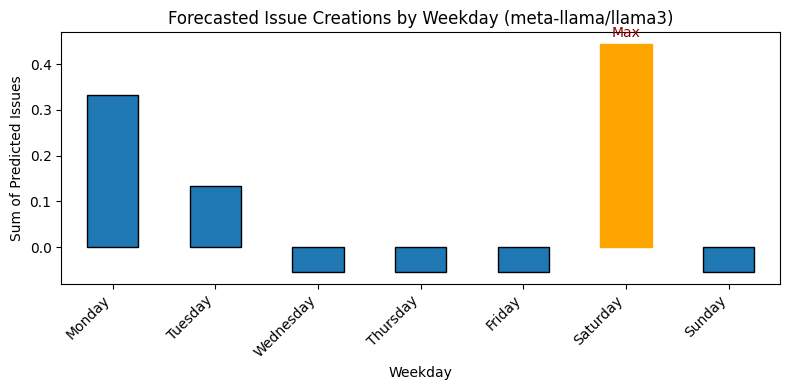

13:51:47 - cmdstanpy - INFO - Chain [1] start processing
13:51:48 - cmdstanpy - INFO - Chain [1] done processing


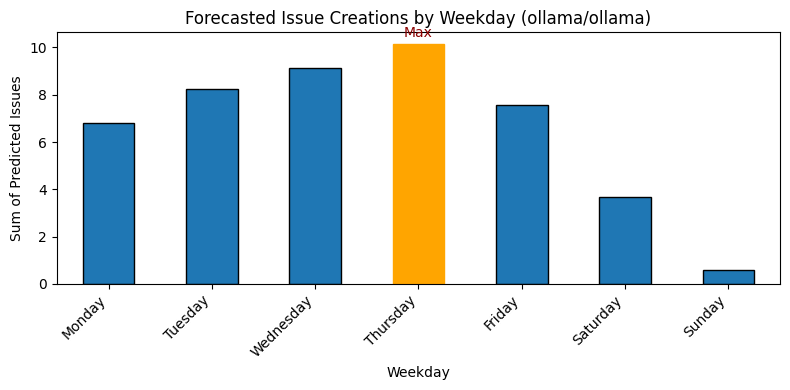

13:51:49 - cmdstanpy - INFO - Chain [1] start processing
13:51:49 - cmdstanpy - INFO - Chain [1] done processing


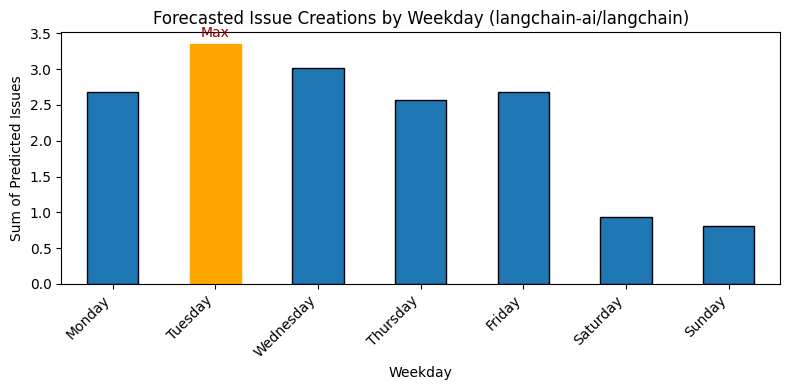

13:51:50 - cmdstanpy - INFO - Chain [1] start processing
13:51:50 - cmdstanpy - INFO - Chain [1] done processing


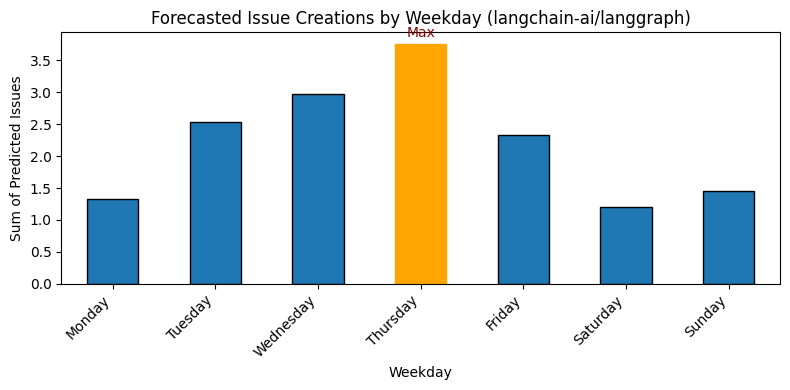

13:51:50 - cmdstanpy - INFO - Chain [1] start processing
13:51:51 - cmdstanpy - INFO - Chain [1] done processing


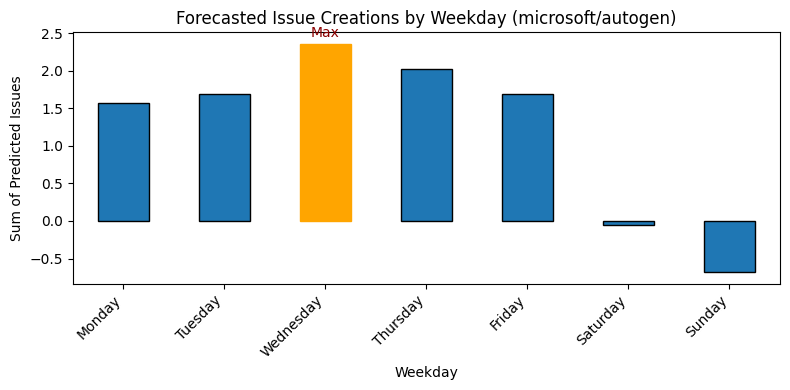

13:51:51 - cmdstanpy - INFO - Chain [1] start processing
13:51:51 - cmdstanpy - INFO - Chain [1] done processing


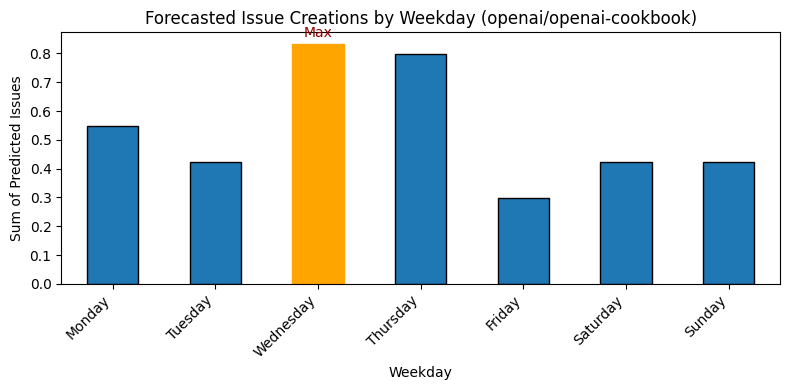

13:51:52 - cmdstanpy - INFO - Chain [1] start processing
13:51:52 - cmdstanpy - INFO - Chain [1] done processing


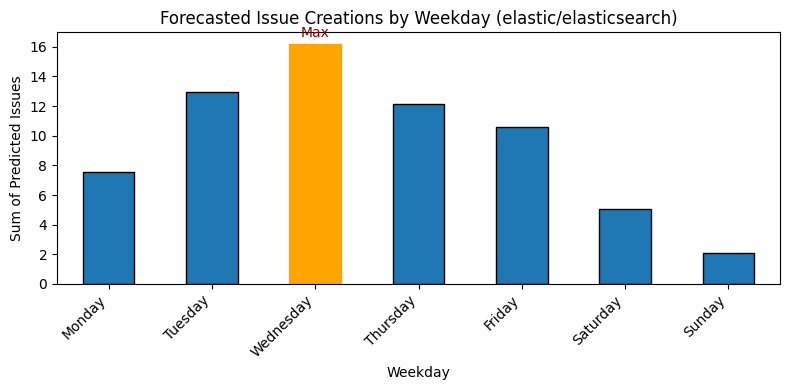

13:51:53 - cmdstanpy - INFO - Chain [1] start processing
13:51:53 - cmdstanpy - INFO - Chain [1] done processing


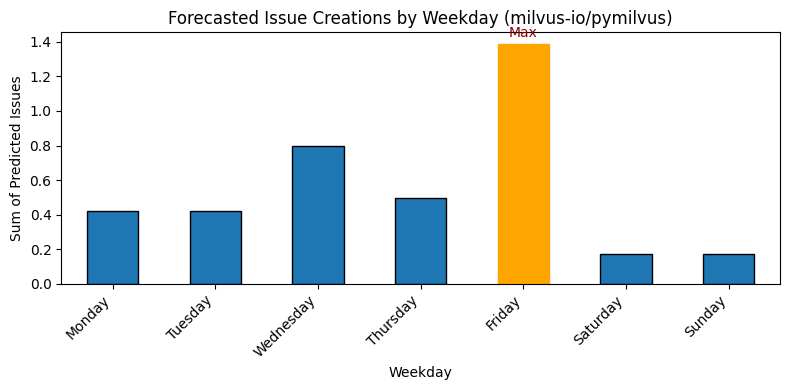

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet
from datetime import datetime, timedelta

# ── Load & prepare data ──────────────────────────────────────────────────────
df = pd.read_json('issues.json', lines=True)
df['created_at'] = pd.to_datetime(df['created_at'], errors='coerce')

# Filter to last 2 months
today = datetime.now()
two_months_ago = today - timedelta(days=60)
df_recent = df[df['created_at'] >= two_months_ago]

# Forecast settings
FORECAST_HORIZON = 7  # days ahead
WEEK_ORDER = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

# ── Loop per repository and plot weekday‐bar chart of forecasted issues ────
for repo in df_recent['repository'].unique():
    repo_df = df_recent[df_recent['repository'] == repo]
    if repo_df.empty:
        continue

    # 1) Build daily series for Prophet
    daily = (
        repo_df
        .groupby(repo_df['created_at'].dt.date)
        .size()
        .reset_index(name='y')
        .rename(columns={'created_at':'ds'})
    )
    daily['ds'] = pd.to_datetime(daily['ds'])
    # fill missing days
    full_idx = pd.date_range(daily['ds'].min(), daily['ds'].max(), freq='D')
    daily = (
        daily
        .set_index('ds')
        .reindex(full_idx, fill_value=0)
        .rename_axis('ds')
        .reset_index()
    )

    # 2) Fit Prophet (weekly seasonality only)
    m = Prophet(weekly_seasonality=True,
                daily_seasonality=False,
                yearly_seasonality=False)
    m.fit(daily)

    # 3) Forecast next 7 days
    future = m.make_future_dataframe(periods=FORECAST_HORIZON, freq='D')
    fcst = m.predict(future)

    # 4) Extract forecast period and assign weekday names
    fcst_period = fcst[fcst['ds'] > daily['ds'].max()].copy()
    fcst_period['weekday'] = fcst_period['ds'].dt.day_name()

    # 5) Aggregate predicted counts by weekday
    counts = (
        fcst_period
        .groupby('weekday')['yhat']
        .sum()
        .reindex(WEEK_ORDER)
        .fillna(0)
    )

    # 6) Plot a separate bar chart for this repo
    plt.figure(figsize=(8, 4))
    bars = counts.plot(kind='bar', edgecolor='black')
    plt.title(f'Forecasted Issue Creations by Weekday ({repo})')
    plt.xlabel('Weekday')
    plt.ylabel('Sum of Predicted Issues')
    plt.xticks(rotation=45, ha='right')

    # 7) Annotate the maximum bar
    max_idx = counts.values.argmax()
    bars.patches[max_idx].set_color('orange')
    plt.text(
        max_idx,
        counts.values[max_idx] + counts.values.max()*0.02,
        'Max',
        ha='center', va='bottom', color='darkred'
    )

    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-2). The day of the week maximum number of issues closed 

</div>

13:53:54 - cmdstanpy - INFO - Chain [1] start processing
13:53:54 - cmdstanpy - INFO - Chain [1] done processing


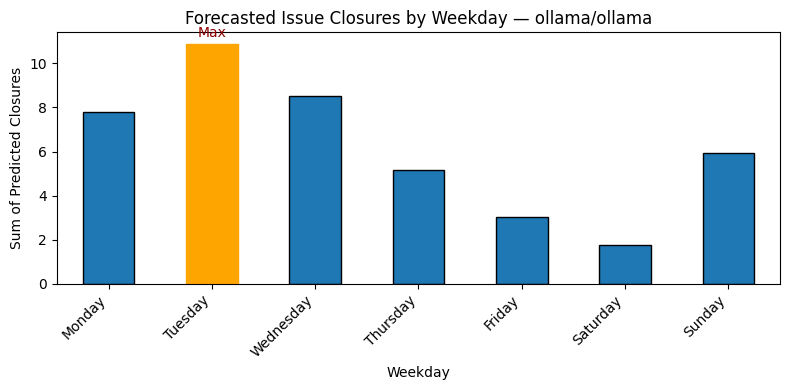

13:53:55 - cmdstanpy - INFO - Chain [1] start processing
13:53:55 - cmdstanpy - INFO - Chain [1] done processing


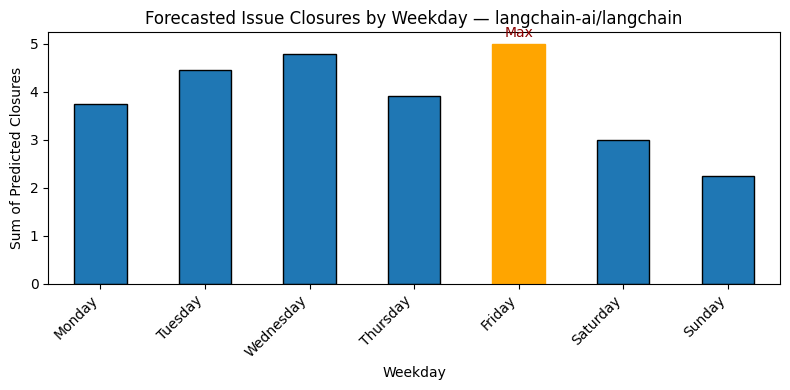

13:53:56 - cmdstanpy - INFO - Chain [1] start processing
13:53:56 - cmdstanpy - INFO - Chain [1] done processing


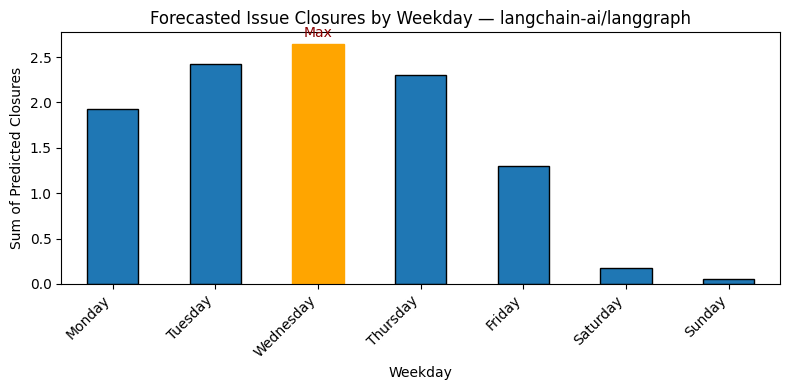

13:53:57 - cmdstanpy - INFO - Chain [1] start processing
13:53:57 - cmdstanpy - INFO - Chain [1] done processing


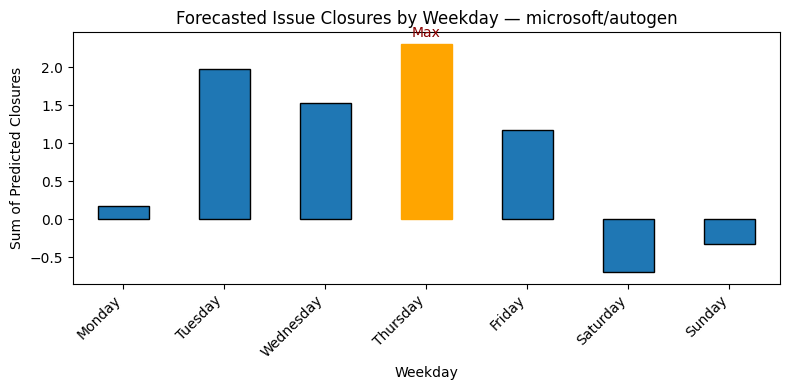

13:53:58 - cmdstanpy - INFO - Chain [1] start processing
13:53:58 - cmdstanpy - INFO - Chain [1] done processing


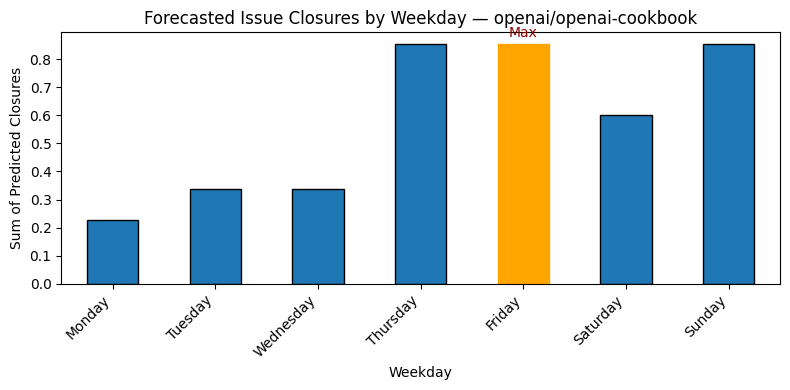

13:53:59 - cmdstanpy - INFO - Chain [1] start processing
13:53:59 - cmdstanpy - INFO - Chain [1] done processing


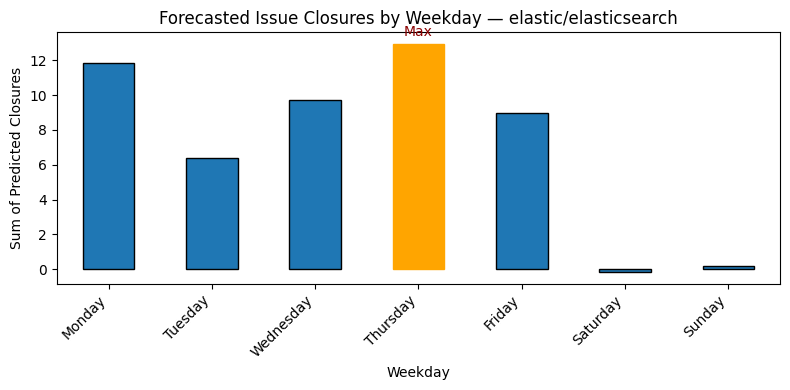

13:53:59 - cmdstanpy - INFO - Chain [1] start processing
13:54:00 - cmdstanpy - INFO - Chain [1] done processing


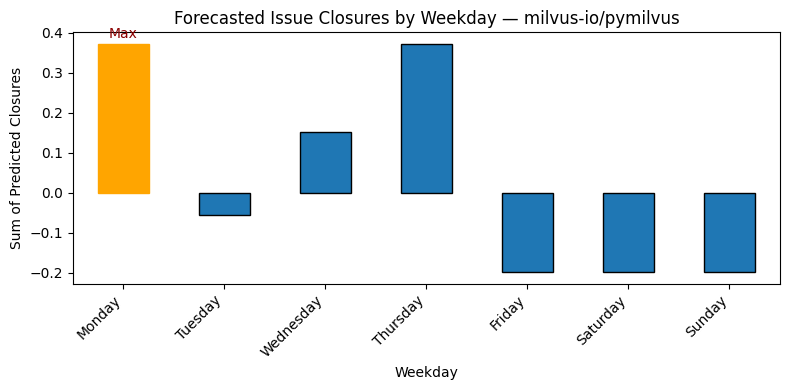

In [70]:
import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet
from datetime import datetime, timedelta

# ── CONFIG ───────────────────────────────────────────────────────────────────
INPUT_FILE    = "issues.json"   # JSONL with at least 'repository' and 'closed_at'
FORECAST_DAYS = 7
LOOKBACK_DAYS = 60

# ── LOAD & FILTER ─────────────────────────────────────────────────────────────
df = pd.read_json(INPUT_FILE, lines=True)
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')

cutoff = datetime.now() - timedelta(days=LOOKBACK_DAYS)
df_recent = df[df['closed_at'] >= cutoff]

WEEK_ORDER = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

# ── PROCESS & PLOT PER REPO ───────────────────────────────────────────────────
for repo in df_recent['repository'].unique():
    repo_df = df_recent[df_recent['repository'] == repo]
    if repo_df.empty:
        continue

    # 1) Build daily closed‐issue counts
    daily = (
        repo_df
        .groupby(repo_df['closed_at'].dt.date)
        .size()
        .reset_index(name='y')
        .rename(columns={'closed_at':'ds'})
    )
    daily['ds'] = pd.to_datetime(daily['ds'])
    full_idx = pd.date_range(daily['ds'].min(), daily['ds'].max(), freq='D')
    daily = (
        daily
        .set_index('ds')
        .reindex(full_idx, fill_value=0)
        .rename_axis('ds')
        .reset_index()
    )

    # 2) Fit Prophet (weekly seasonality only)
    m = Prophet(
        weekly_seasonality=True,
        daily_seasonality=False,
        yearly_seasonality=False
    )
    m.fit(daily)

    # 3) Forecast the next 7 days
    future = m.make_future_dataframe(periods=FORECAST_DAYS, freq='D')
    forecast = m.predict(future)

    # 4) Restrict to forecast period and tag weekdays
    fc = forecast[forecast['ds'] > daily['ds'].max()].copy()
    fc['weekday'] = fc['ds'].dt.day_name()

    # 5) Aggregate predicted closures by weekday
    counts = (
        fc
        .groupby('weekday')['yhat']
        .sum()
        .reindex(WEEK_ORDER)
        .fillna(0)
    )

    # 6) Plot a bar chart for this repository
    fig, ax = plt.subplots(figsize=(8, 4))
    bars = counts.plot(kind='bar', ax=ax, edgecolor='black')
    ax.set_title(f'Forecasted Issue Closures by Weekday — {repo}')
    ax.set_xlabel('Weekday')
    ax.set_ylabel('Sum of Predicted Closures')
    plt.xticks(rotation=45, ha='right')

    # 7) Highlight and annotate the max weekday
    idx_max = counts.values.argmax()
    bars.patches[idx_max].set_color('orange')
    ax.text(
        idx_max,
        counts.values[idx_max] * 1.02,
        'Max',
        ha='center',
        va='bottom',
        color='darkred'
    )

    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-3). The month of the year that has maximum number of issues closed 


</div>

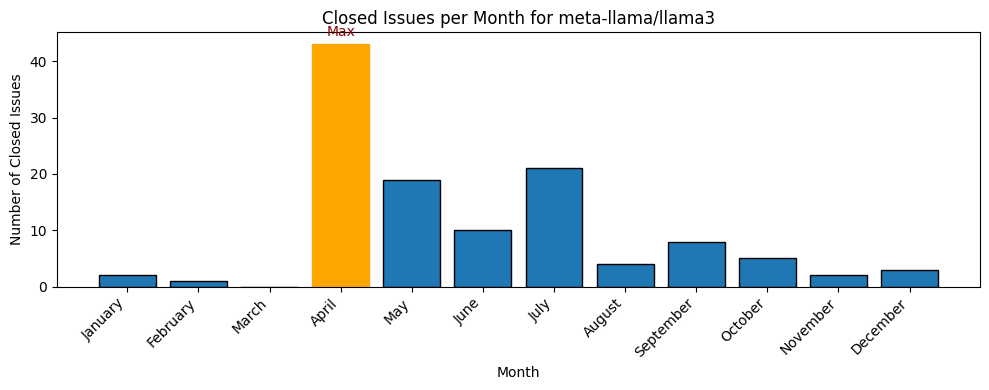

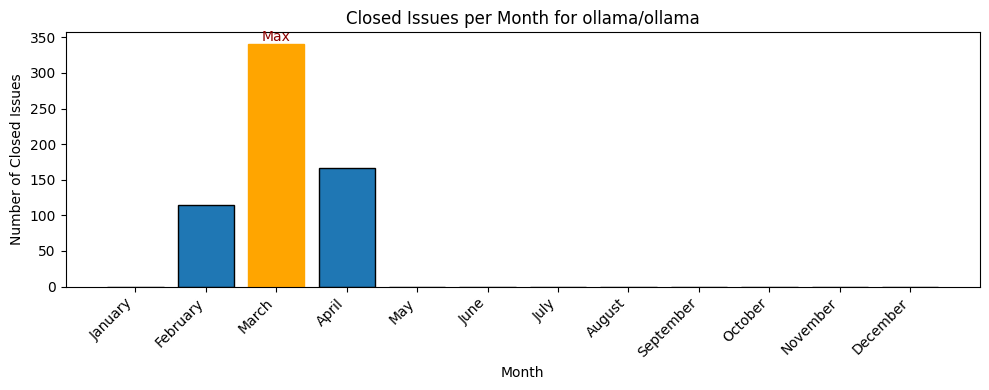

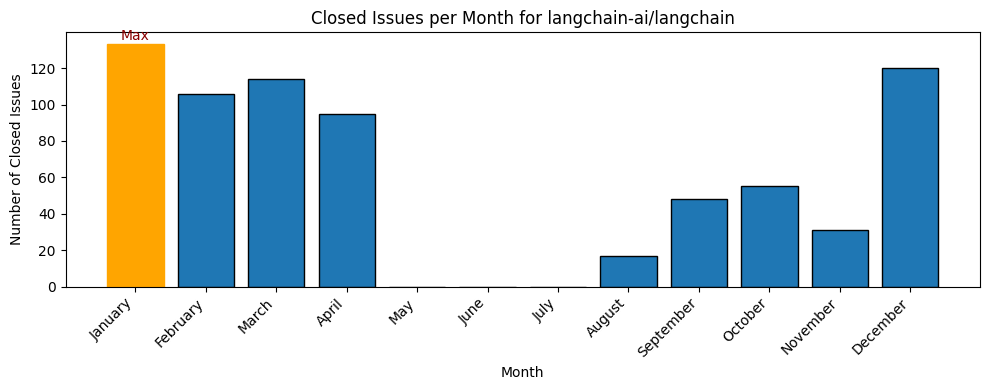

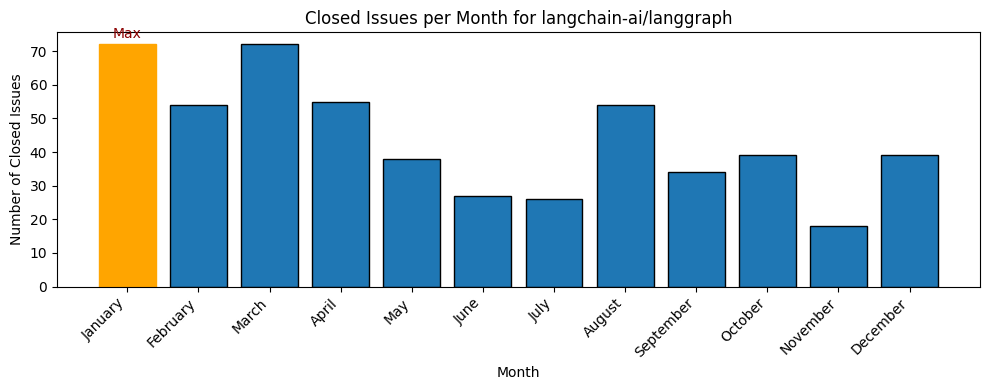

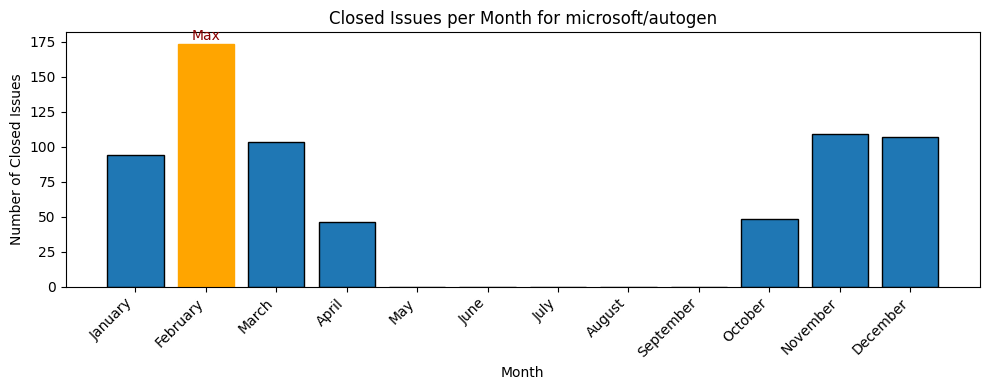

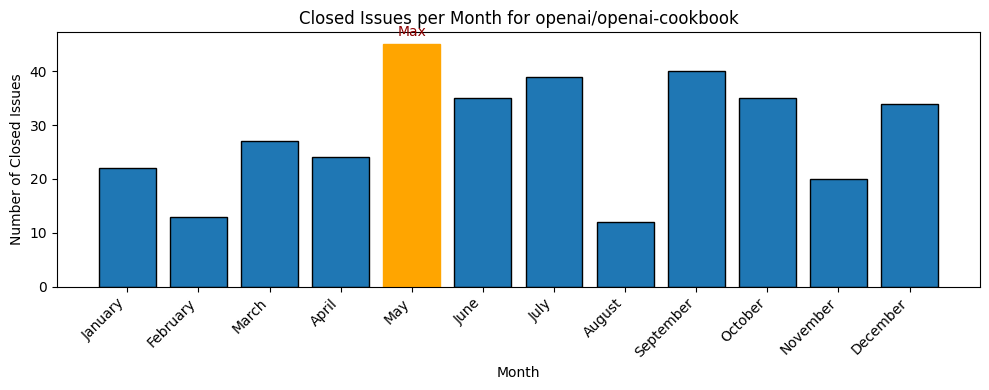

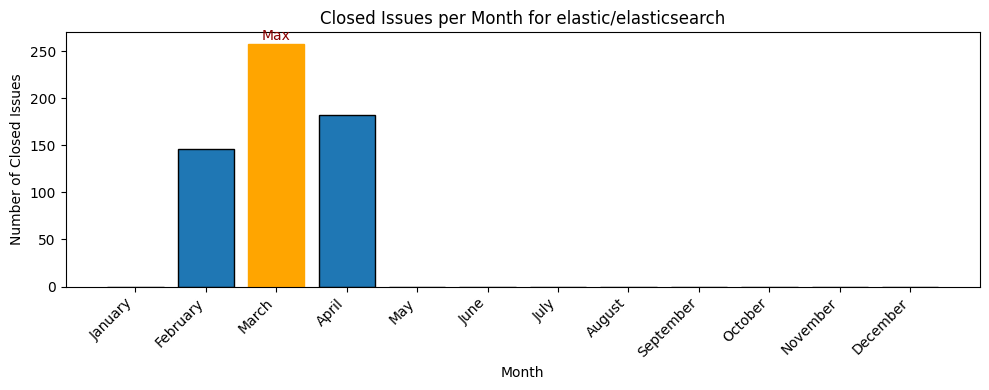

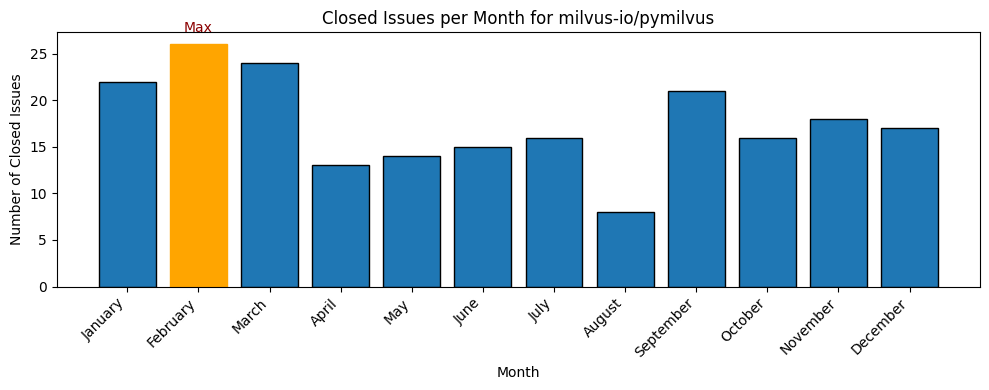

In [71]:
import pandas as pd
import matplotlib.pyplot as plt

# ── Load & prepare data ──────────────────────────────────────────────────────
df = pd.read_json('issues.json', lines=True)
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')
df_closed = df.dropna(subset=['closed_at']).copy()

# Chronological month order
months_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]

# ── Loop per repository and plot monthly closed‐issue counts ─────────────────
for repo in df_closed['repository'].unique():
    repo_df = df_closed[df_closed['repository'] == repo]
    if repo_df.empty:
        continue

    # 1) Count closures by month
    monthly_counts = (
        repo_df
        .groupby(repo_df['closed_at'].dt.month_name())
        .size()
        .reindex(months_order, fill_value=0)
    )

    # 2) Plot
    plt.figure(figsize=(10, 4))
    bars = plt.bar(monthly_counts.index, monthly_counts.values, edgecolor='black')
    plt.title(f'Closed Issues per Month for {repo}')
    plt.xlabel('Month')
    plt.ylabel('Number of Closed Issues')
    plt.xticks(rotation=45, ha='right')

    # 3) Highlight & annotate the month with max closures
    max_idx = monthly_counts.values.argmax()
    bars[max_idx].set_color('orange')
    plt.text(
        max_idx,
        monthly_counts.values[max_idx] + 1,
        'Max',
        ha='center',
        va='bottom',
        color='darkred'
    )

    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-4). Plot the created issues forecast 

</div>

02:18:12 - cmdstanpy - INFO - Chain [1] start processing
02:18:12 - cmdstanpy - INFO - Chain [1] done processing


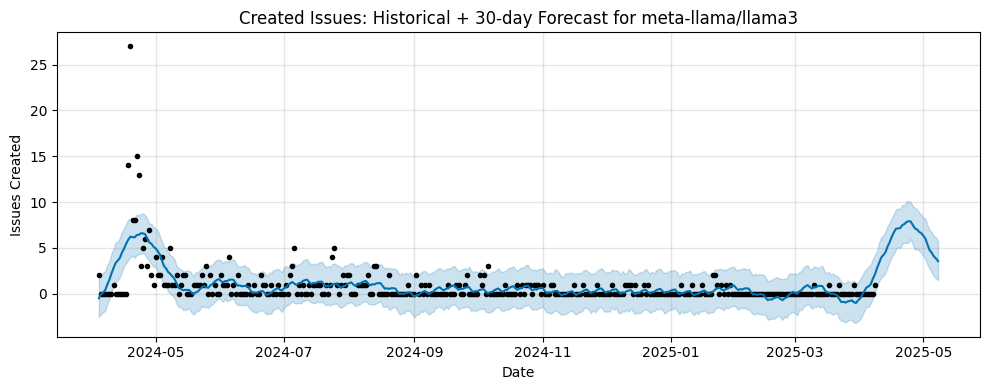

02:18:12 - cmdstanpy - INFO - Chain [1] start processing
02:18:12 - cmdstanpy - INFO - Chain [1] done processing


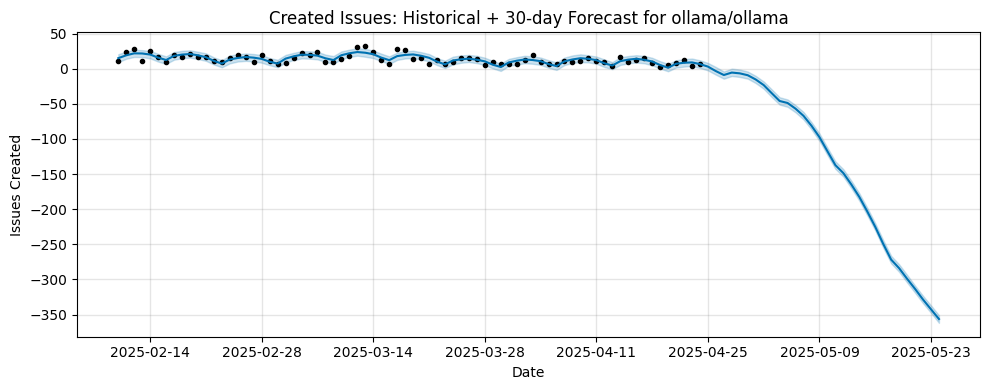

02:18:13 - cmdstanpy - INFO - Chain [1] start processing
02:18:13 - cmdstanpy - INFO - Chain [1] done processing


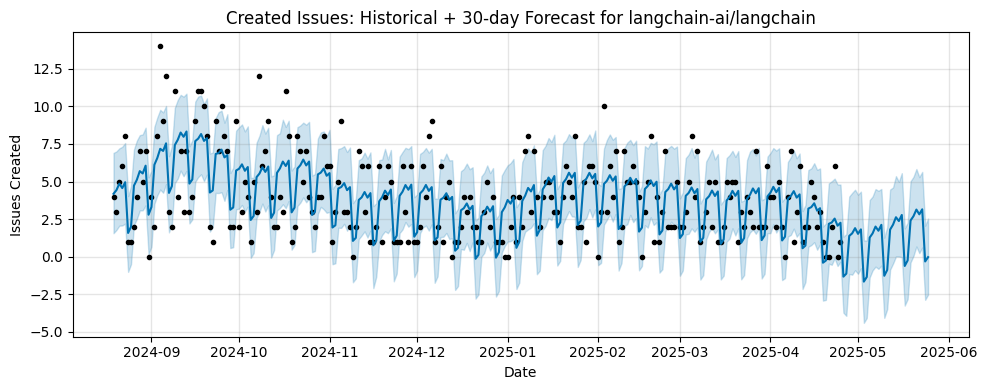

02:18:13 - cmdstanpy - INFO - Chain [1] start processing
02:18:13 - cmdstanpy - INFO - Chain [1] done processing


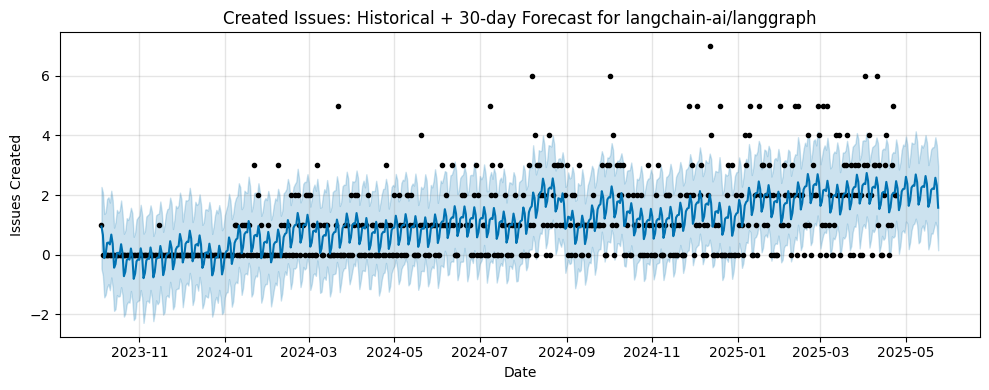

02:18:14 - cmdstanpy - INFO - Chain [1] start processing
02:18:14 - cmdstanpy - INFO - Chain [1] done processing


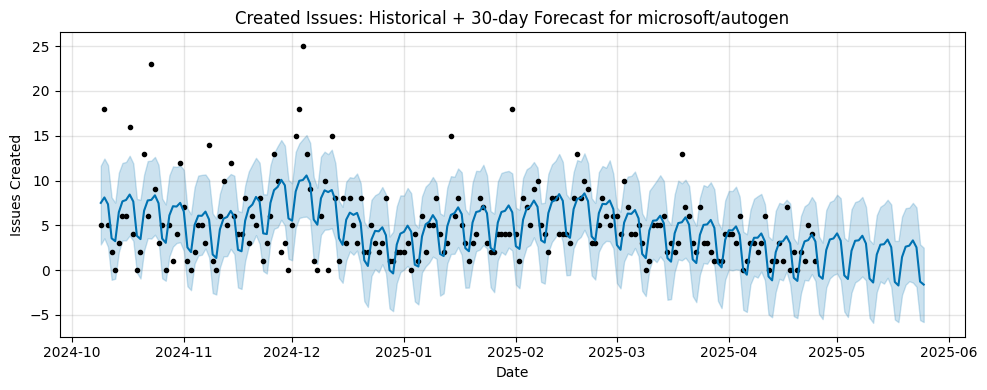

02:18:14 - cmdstanpy - INFO - Chain [1] start processing
02:18:14 - cmdstanpy - INFO - Chain [1] done processing


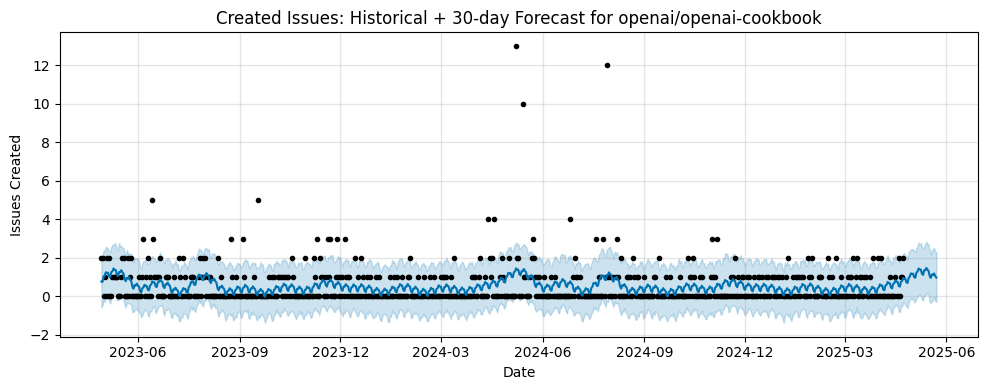

02:18:15 - cmdstanpy - INFO - Chain [1] start processing
02:18:15 - cmdstanpy - INFO - Chain [1] done processing


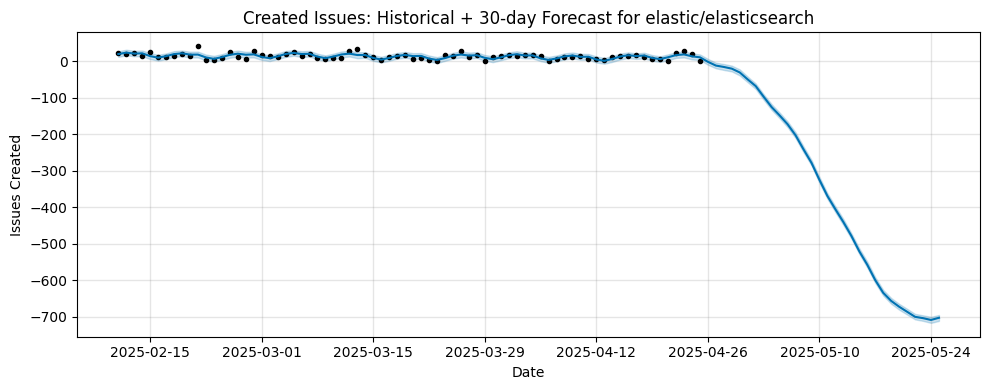

02:18:15 - cmdstanpy - INFO - Chain [1] start processing
02:18:15 - cmdstanpy - INFO - Chain [1] done processing


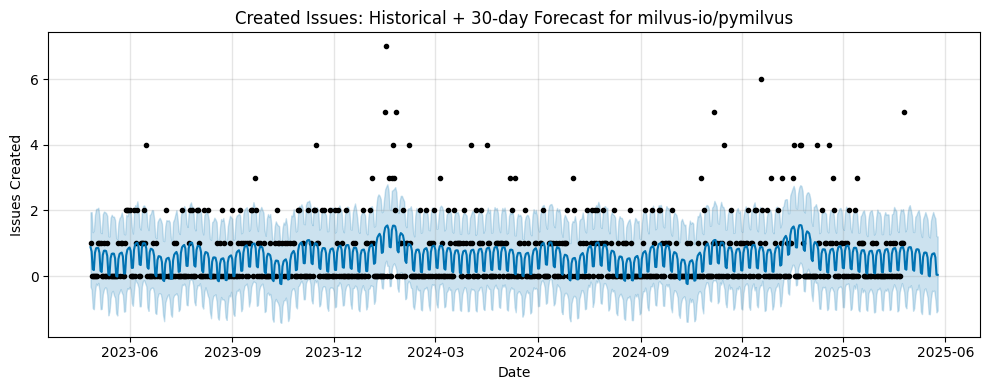

In [34]:
# REQ9-4: Created Issues Forecast using Prophet (Historical + 30-day forecast)

import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet
from datetime import datetime, timedelta

# ── CONFIG ───────────────────────────────────────────────────────────────────
INPUT_FILE    = "issues.json"   # one JSON object per line
FORECAST_DAYS = 30

# ── LOAD & FILTER ─────────────────────────────────────────────────────────────
df = pd.read_json(INPUT_FILE, lines=True)
df['created_at'] = pd.to_datetime(df['created_at'], errors='coerce')

# keep only the last two years of data
now    = datetime.now()
cutoff = now - timedelta(days=730)
df     = df[df['created_at'] >= cutoff]

# ── PROCESS PER REPO ──────────────────────────────────────────────────────────
for repo in df['repository'].unique():
    repo_df = df[df['repository'] == repo]
    if repo_df.empty:
        print(f"{repo}: no data in last 2 years, skipping.")
        continue

    # 1) build daily counts
    daily = (
        repo_df
        .set_index('created_at')
        .resample('D')
        .size()
        .rename('y')
        .to_frame()
        .reset_index()
        .rename(columns={'created_at':'ds'})
    )

    # 2) fill any missing days with zero
    full_idx = pd.date_range(daily['ds'].min(), daily['ds'].max(), freq='D')
    daily = (
        daily
        .set_index('ds')
        .reindex(full_idx, fill_value=0)
        .rename_axis('ds')
        .reset_index()
    )

    # 3) fit Prophet (weekly + yearly seasonality)
    m = Prophet(
        daily_seasonality=False,
        weekly_seasonality=True,
        yearly_seasonality=True
    )
    m.fit(daily)

    # 4) make future frame & forecast
    future   = m.make_future_dataframe(periods=FORECAST_DAYS, freq='D')
    forecast = m.predict(future)

    # 5) plot
    fig, ax = plt.subplots(figsize=(10, 4))
    m.plot(forecast, ax=ax)
    ax.set_title(f"Created Issues: Historical + {FORECAST_DAYS}-day Forecast for {repo}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Issues Created")
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-5). Plot the closed issues forecast 

</div>

02:18:48 - cmdstanpy - INFO - Chain [1] start processing
02:18:48 - cmdstanpy - INFO - Chain [1] done processing


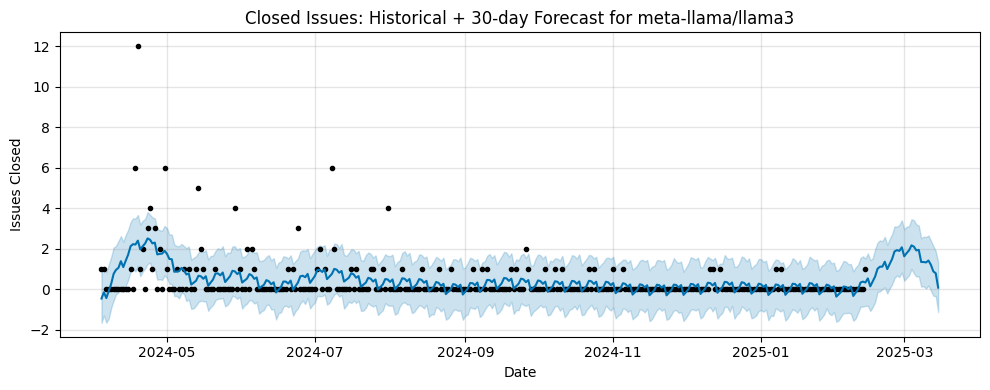

02:18:48 - cmdstanpy - INFO - Chain [1] start processing
02:18:48 - cmdstanpy - INFO - Chain [1] done processing


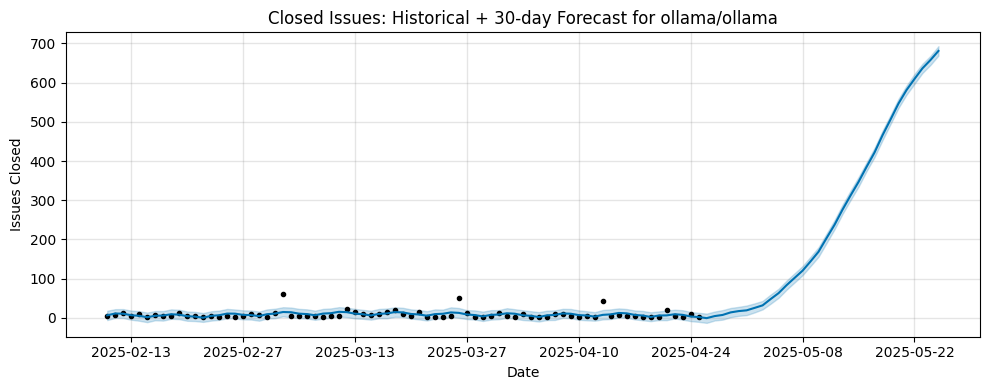

02:18:49 - cmdstanpy - INFO - Chain [1] start processing
02:18:49 - cmdstanpy - INFO - Chain [1] done processing


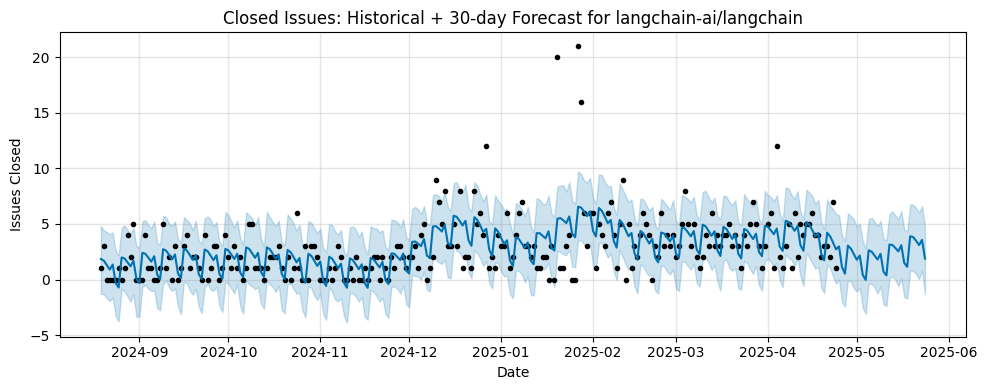

02:18:49 - cmdstanpy - INFO - Chain [1] start processing
02:18:49 - cmdstanpy - INFO - Chain [1] done processing


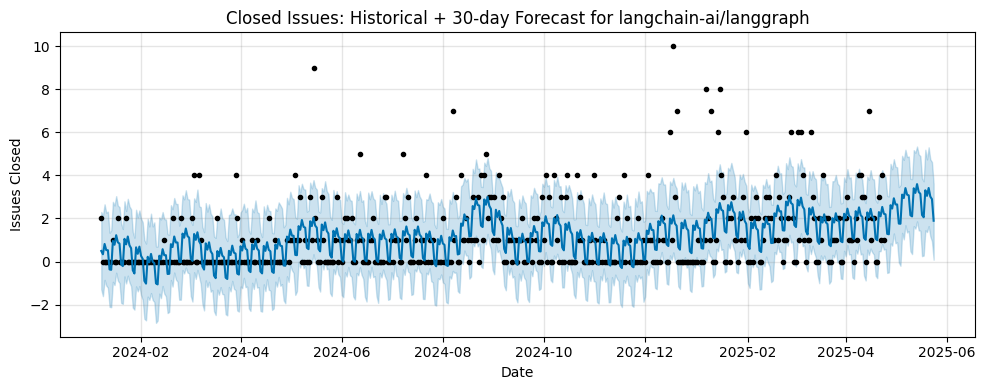

02:18:49 - cmdstanpy - INFO - Chain [1] start processing
02:18:49 - cmdstanpy - INFO - Chain [1] done processing


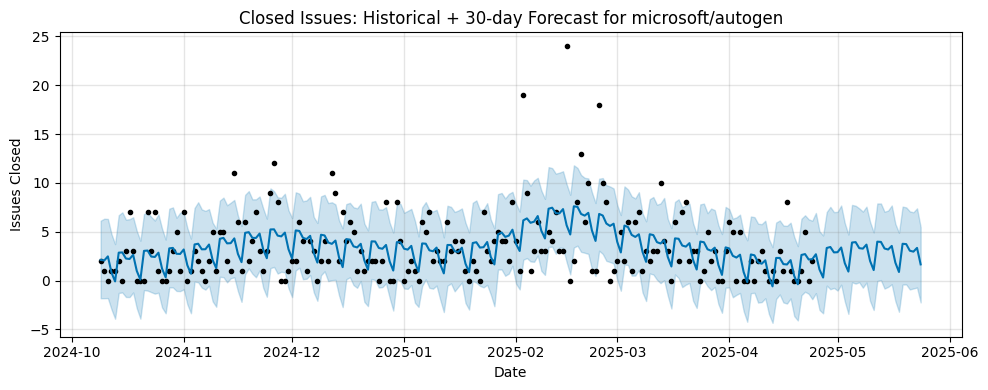

02:18:50 - cmdstanpy - INFO - Chain [1] start processing
02:18:50 - cmdstanpy - INFO - Chain [1] done processing


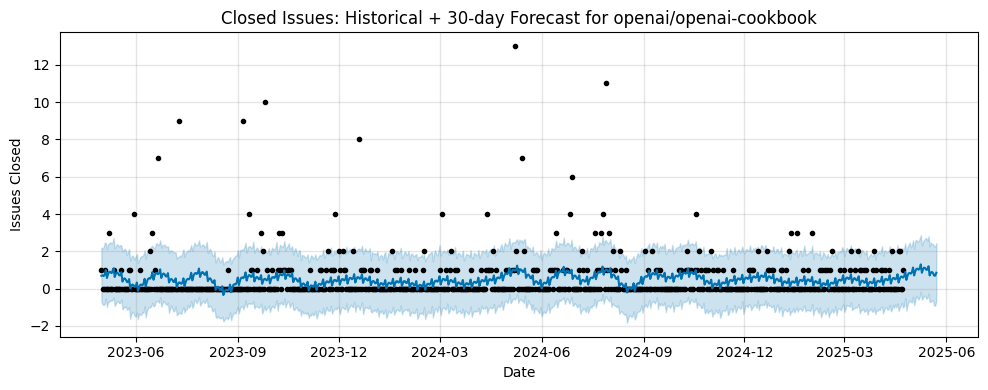

02:18:50 - cmdstanpy - INFO - Chain [1] start processing
02:18:50 - cmdstanpy - INFO - Chain [1] done processing


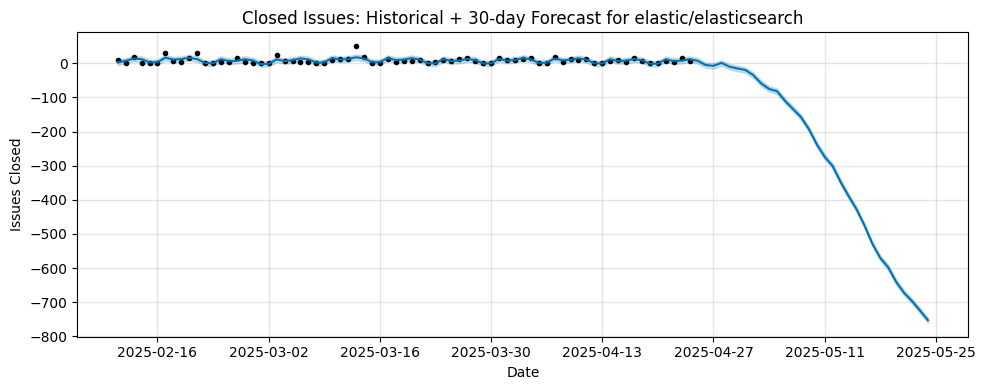

02:18:51 - cmdstanpy - INFO - Chain [1] start processing
02:18:51 - cmdstanpy - INFO - Chain [1] done processing


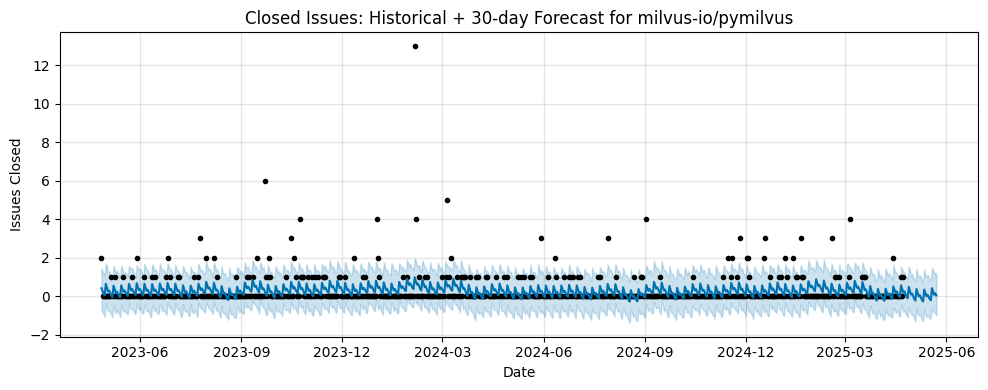

In [35]:
# REQ9-5: Closed Issues Forecast using Prophet (Historical + 30-day forecast)

import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet
from datetime import datetime, timedelta

# ── CONFIG ───────────────────────────────────────────────────────────────────
INPUT_FILE    = "issues.json"   # one JSON object per line
FORECAST_DAYS = 30

# ── LOAD & FILTER ─────────────────────────────────────────────────────────────
df = pd.read_json(INPUT_FILE, lines=True)
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')

# keep only the last two years of closures
now    = datetime.now()
cutoff = now - timedelta(days=730)
df     = df[df['closed_at'] >= cutoff].dropna(subset=['closed_at'])

# ── PROCESS PER REPO ──────────────────────────────────────────────────────────
for repo in df['repository'].unique():
    repo_df = df[df['repository'] == repo]
    if repo_df.empty:
        print(f"{repo}: no closed‐issue data in last 2 years, skipping.")
        continue

    # 1) build daily closed‐issue counts
    daily = (
        repo_df
        .set_index('closed_at')
        .resample('D')
        .size()
        .rename('y')
        .to_frame()
        .reset_index()
        .rename(columns={'closed_at': 'ds'})
    )

    # 2) fill any missing days with zero
    full_idx = pd.date_range(daily['ds'].min(), daily['ds'].max(), freq='D')
    daily = (
        daily
        .set_index('ds')
        .reindex(full_idx, fill_value=0)
        .rename_axis('ds')
        .reset_index()
    )

    # 3) fit Prophet (weekly + yearly seasonality)
    m = Prophet(
        daily_seasonality=False,
        weekly_seasonality=True,
        yearly_seasonality=True
    )
    m.fit(daily)

    # 4) make future frame & forecast
    future   = m.make_future_dataframe(periods=FORECAST_DAYS, freq='D')
    forecast = m.predict(future)

    # 5) plot
    fig, ax = plt.subplots(figsize=(10, 4))
    m.plot(forecast, ax=ax)
    ax.set_title(f"Closed Issues: Historical + {FORECAST_DAYS}-day Forecast for {repo}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Issues Closed")
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-6). Plot the pulls forecast 

</div>


▶ Processing PRs for meta-llama/llama3…


02:21:00 - cmdstanpy - INFO - Chain [1] start processing
02:21:00 - cmdstanpy - INFO - Chain [1] done processing


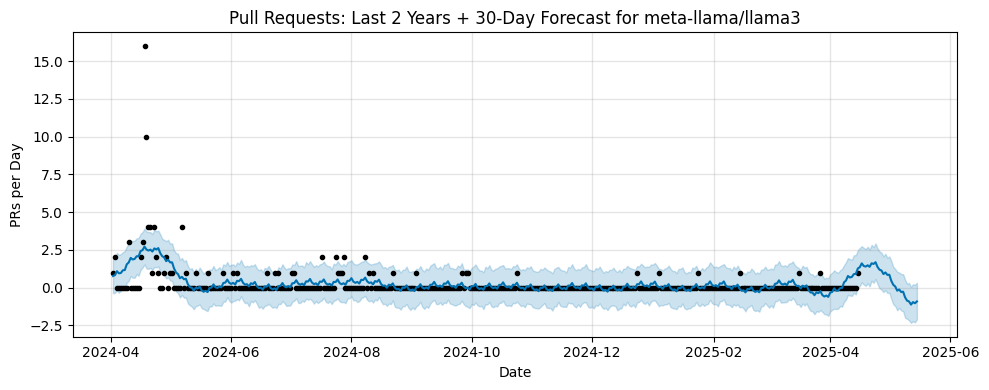


▶ Processing PRs for ollama/ollama…


02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] done processing


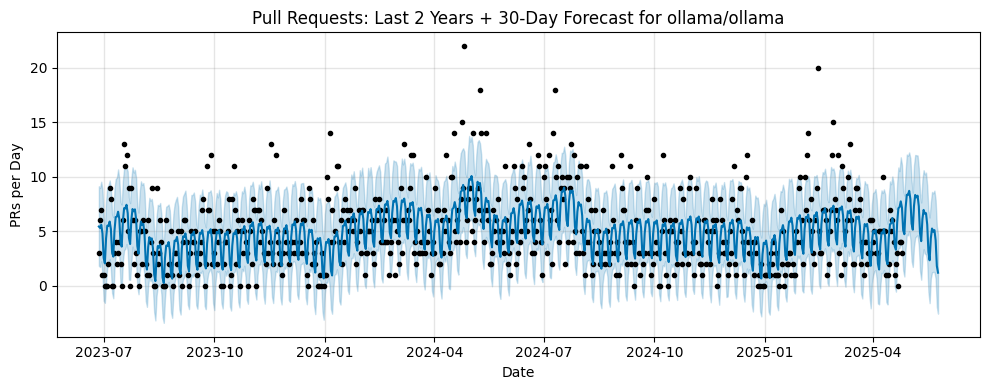


▶ Processing PRs for langchain-ai/langchain…


02:31:46 - cmdstanpy - INFO - Chain [1] start processing
02:31:46 - cmdstanpy - INFO - Chain [1] done processing


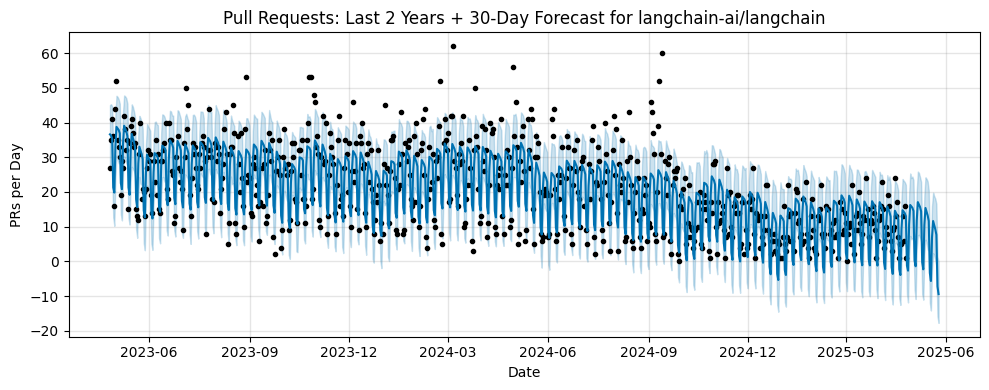


▶ Processing PRs for langchain-ai/langgraph…


02:32:55 - cmdstanpy - INFO - Chain [1] start processing
02:32:55 - cmdstanpy - INFO - Chain [1] done processing


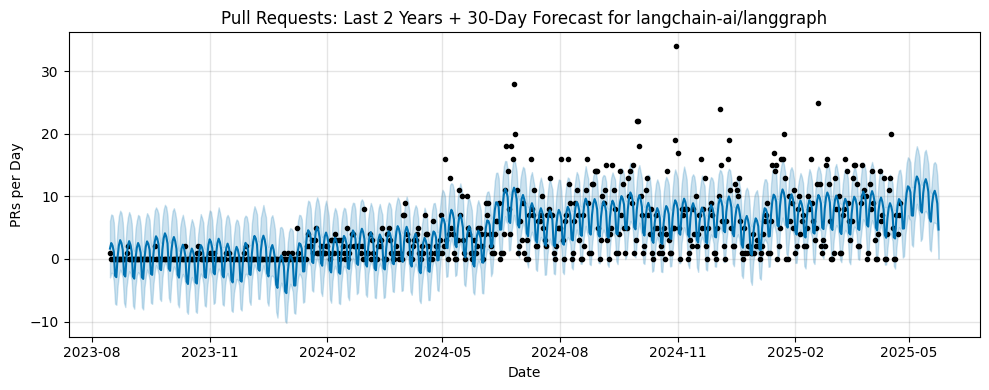


▶ Processing PRs for microsoft/autogen…


02:34:36 - cmdstanpy - INFO - Chain [1] start processing
02:34:36 - cmdstanpy - INFO - Chain [1] done processing


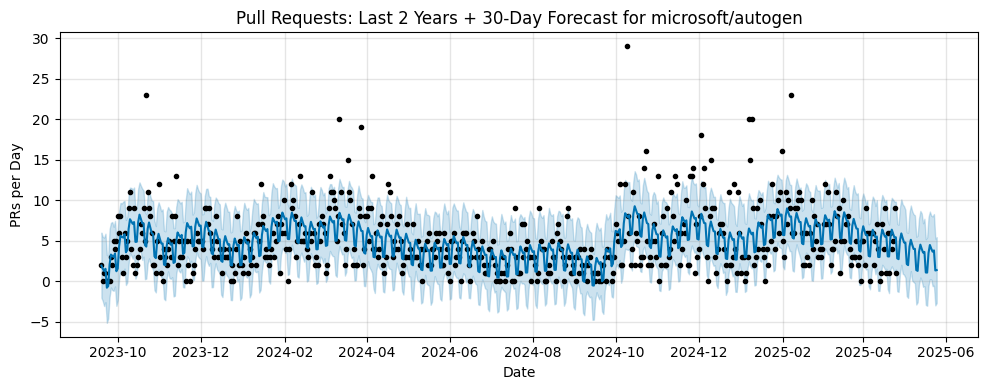


▶ Processing PRs for openai/openai-cookbook…


02:35:09 - cmdstanpy - INFO - Chain [1] start processing
02:35:09 - cmdstanpy - INFO - Chain [1] done processing


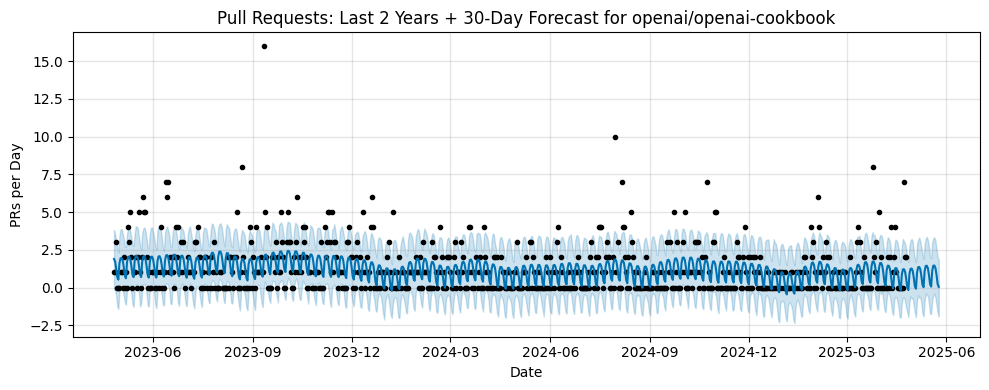


▶ Processing PRs for elastic/elasticsearch…


03:50:54 - cmdstanpy - INFO - Chain [1] start processing
03:50:55 - cmdstanpy - INFO - Chain [1] done processing


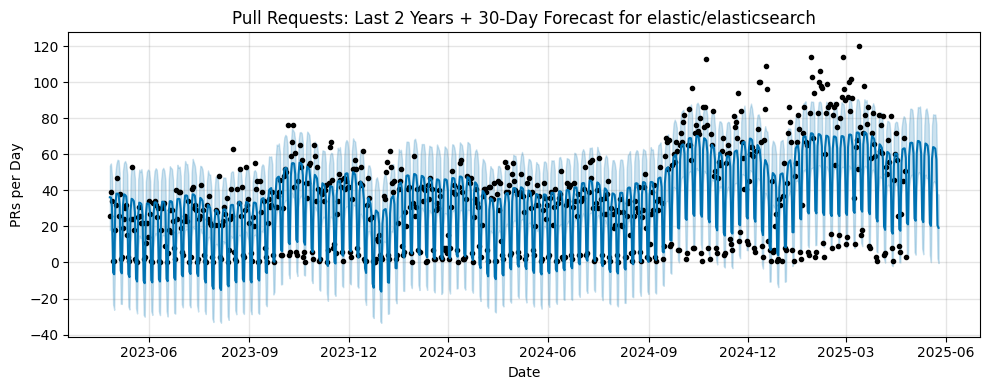


▶ Processing PRs for milvus-io/pymilvus…


03:52:04 - cmdstanpy - INFO - Chain [1] start processing
03:52:04 - cmdstanpy - INFO - Chain [1] done processing


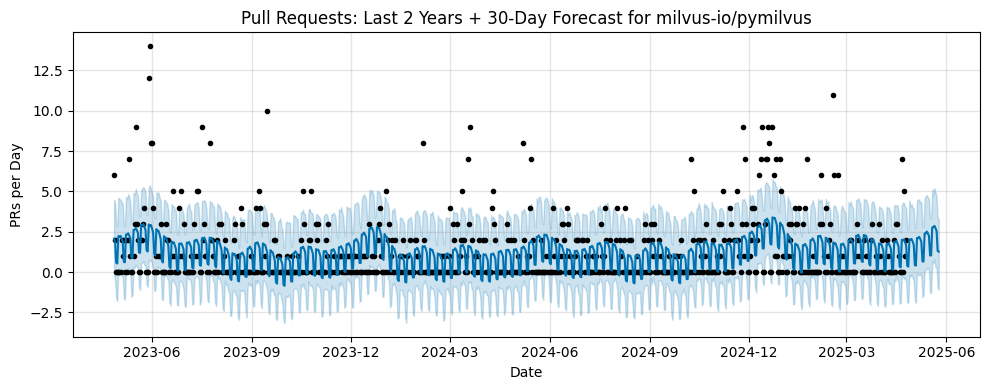

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone

from prophet import Prophet
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""

REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730   # last 2 years
FORECAST_DAYS = 30    # forecast horizon

# ── AUTHENTICATE WITH GITHUB ───────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)

# ── CUTOFF DATE (timezone‐aware) ────────────────────────────────────────────
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing PRs for {repo_full}…")

    # 1) Gather all PR creation dates in the last 2 years
    pulls = repo.get_pulls(state="all")
    dates = [pr.created_at for pr in pulls if pr.created_at >= cutoff]

    if not dates:
        print(f"  – No pull-request data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build a daily time series of counts
    df = pd.DataFrame({"ds": pd.to_datetime(dates)})
    daily = (
        df.set_index("ds")
          .resample("D")
          .size()
          .rename("y")
          .to_frame()
          .reset_index()
    )

    # 3) Fill missing days with zero
    full_idx = pd.date_range(daily["ds"].min(), daily["ds"].max(), freq="D")
    daily = (
        daily
        .set_index("ds")
        .reindex(full_idx, fill_value=0)
        .rename_axis("ds")
        .reset_index()
    )

    # 4) Strip timezone from 'ds' so Prophet will accept it
    daily['ds'] = daily['ds'].dt.tz_localize(None)

    # 5) Fit Prophet with weekly & yearly seasonality
    m = Prophet(weekly_seasonality=True, yearly_seasonality=True)
    m.fit(daily)

    # 6) Forecast the next FORECAST_DAYS
    future = m.make_future_dataframe(periods=FORECAST_DAYS, freq="D")
    forecast = m.predict(future)

    # 7) Plot historical + forecast
    fig, ax = plt.subplots(figsize=(10, 4))
    m.plot(forecast, ax=ax)
    ax.set_title(f"Pull Requests: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    ax.set_xlabel("Date")
    ax.set_ylabel("PRs per Day")
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-7). Plot the commits forecast

</div>


▶ Processing commits for meta-llama/llama3…


03:52:16 - cmdstanpy - INFO - Chain [1] start processing
03:52:16 - cmdstanpy - INFO - Chain [1] done processing


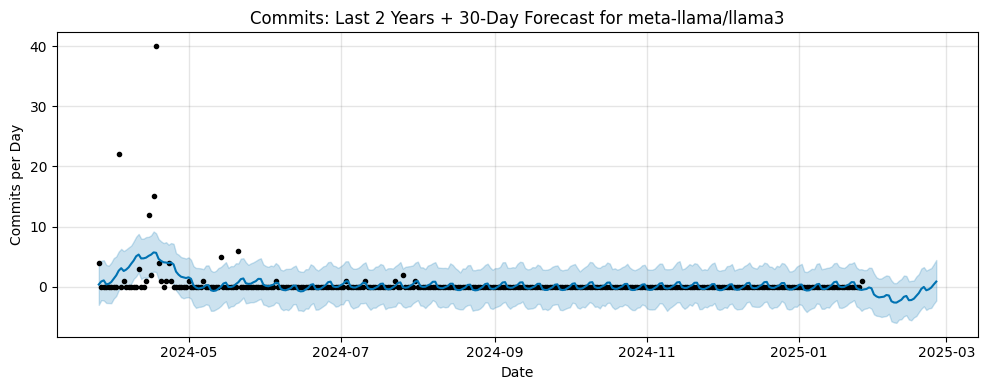


▶ Processing commits for ollama/ollama…


03:53:50 - cmdstanpy - INFO - Chain [1] start processing
03:53:50 - cmdstanpy - INFO - Chain [1] done processing


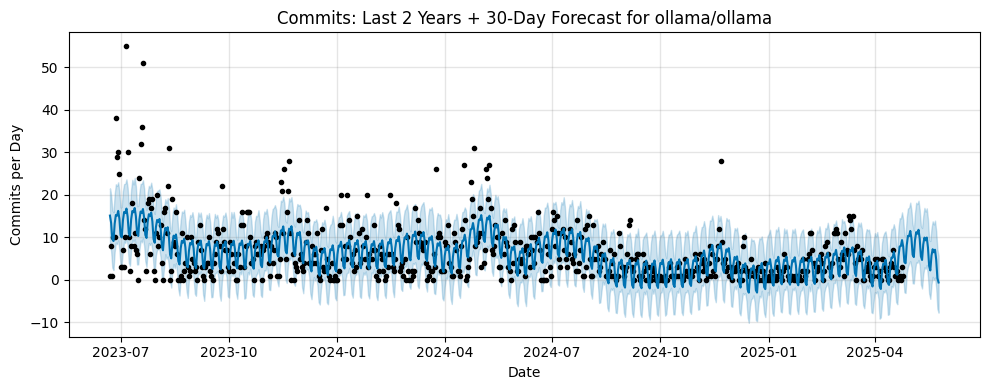


▶ Processing commits for langchain-ai/langchain…


03:58:34 - cmdstanpy - INFO - Chain [1] start processing
03:58:34 - cmdstanpy - INFO - Chain [1] done processing


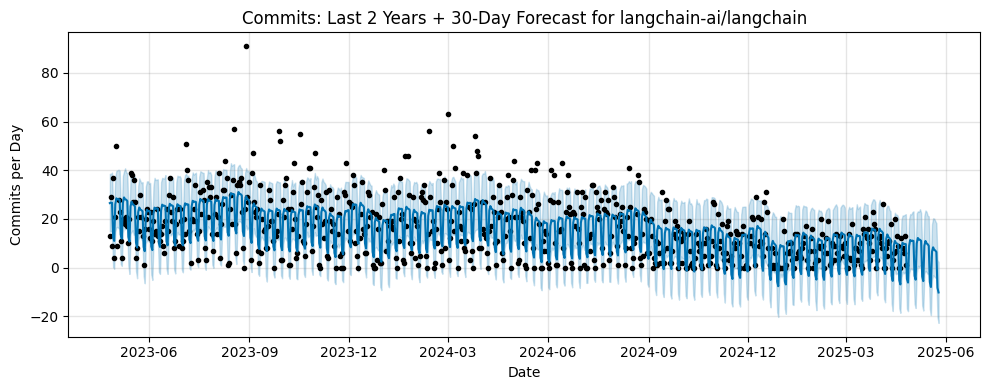


▶ Processing commits for langchain-ai/langgraph…


04:00:32 - cmdstanpy - INFO - Chain [1] start processing
04:00:32 - cmdstanpy - INFO - Chain [1] done processing


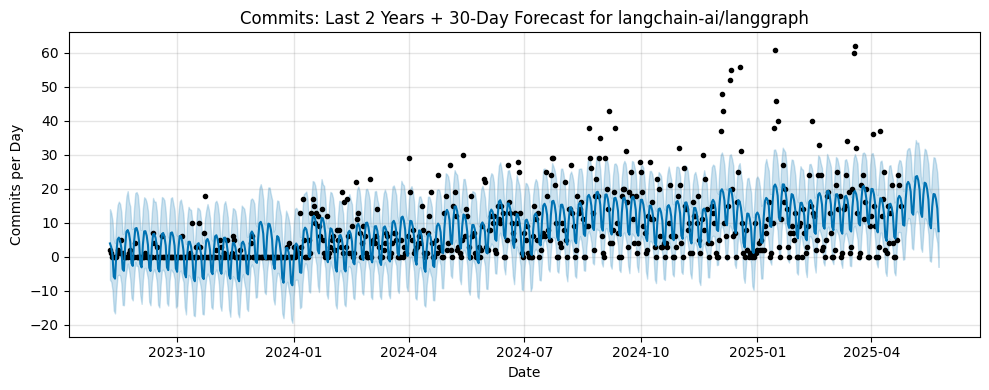


▶ Processing commits for microsoft/autogen…


04:01:56 - cmdstanpy - INFO - Chain [1] start processing
04:01:56 - cmdstanpy - INFO - Chain [1] done processing


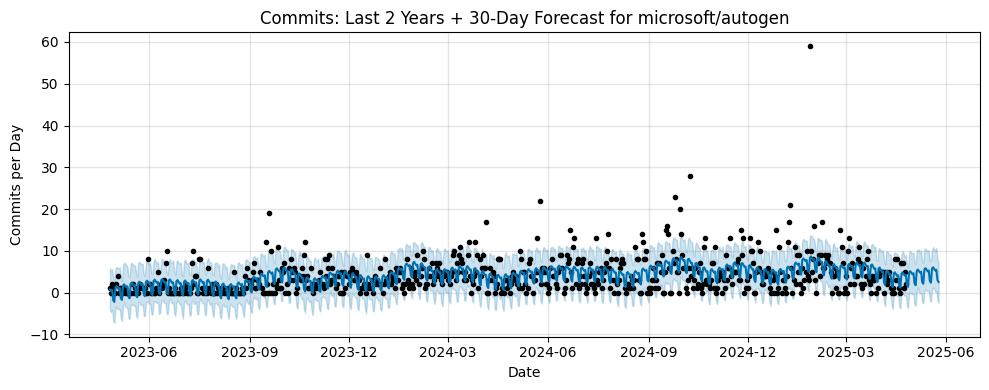


▶ Processing commits for openai/openai-cookbook…


04:02:14 - cmdstanpy - INFO - Chain [1] start processing
04:02:14 - cmdstanpy - INFO - Chain [1] done processing


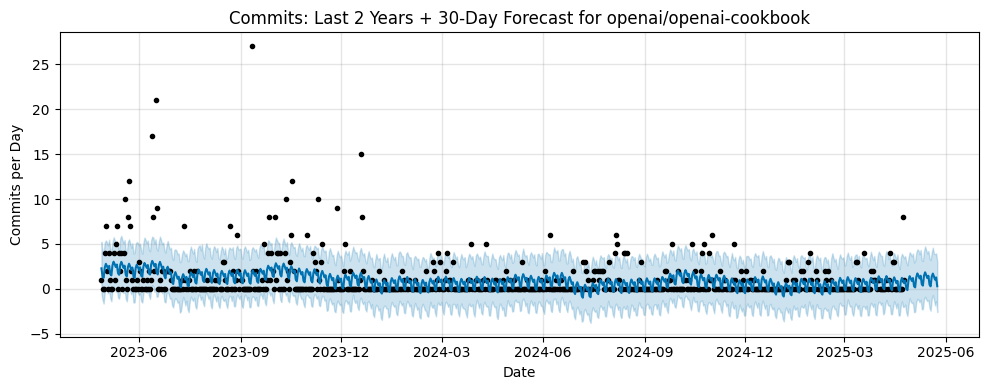


▶ Processing commits for elastic/elasticsearch…


04:09:38 - cmdstanpy - INFO - Chain [1] start processing
04:09:38 - cmdstanpy - INFO - Chain [1] done processing


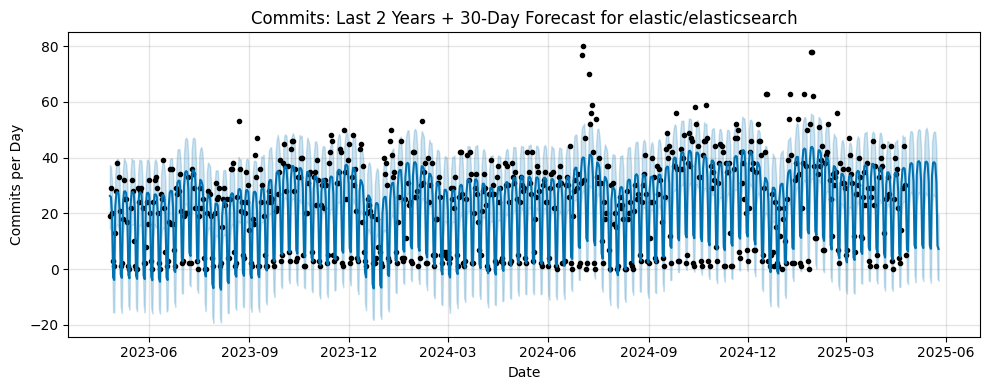


▶ Processing commits for milvus-io/pymilvus…


04:09:48 - cmdstanpy - INFO - Chain [1] start processing
04:09:48 - cmdstanpy - INFO - Chain [1] done processing


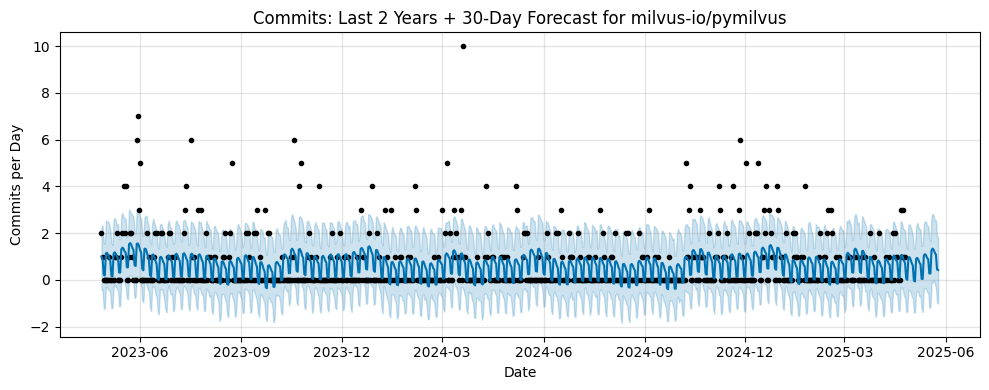

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone

from prophet import Prophet
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""

REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730   # last 2 years
FORECAST_DAYS = 30    # forecast horizon

# ── AUTHENTICATE WITH GITHUB ───────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)

# ── CUTOFF DATE (timezone‐aware) ────────────────────────────────────────────
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing commits for {repo_full}…")

    # 1) Gather all commit dates in the last 2 years
    commits = repo.get_commits(since=cutoff)
    dates = [c.commit.author.date for c in commits if c.commit.author.date >= cutoff]

    if not dates:
        print(f"  – No commits in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build a daily time series of commit counts
    df = pd.DataFrame({"ds": pd.to_datetime(dates)})
    daily = (
        df.set_index("ds")
          .resample("D")
          .size()
          .rename("y")
          .to_frame()
          .reset_index()
    )

    # 3) Fill missing days with zero
    full_idx = pd.date_range(daily["ds"].min(), daily["ds"].max(), freq="D")
    daily = (
        daily
        .set_index("ds")
        .reindex(full_idx, fill_value=0)
        .rename_axis("ds")
        .reset_index()
    )

    # 4) Strip timezone from 'ds' so Prophet will accept it
    daily["ds"] = daily["ds"].dt.tz_localize(None)

    # 5) Fit Prophet with weekly & yearly seasonality
    m = Prophet(weekly_seasonality=True, yearly_seasonality=True)
    m.fit(daily)

    # 6) Forecast the next FORECAST_DAYS
    future = m.make_future_dataframe(periods=FORECAST_DAYS, freq="D")
    forecast = m.predict(future)

    # 7) Plot historical + forecast
    fig, ax = plt.subplots(figsize=(10, 4))
    m.plot(forecast, ax=ax)
    ax.set_title(f"Commits: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Commits per Day")
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-8). Plot the branches forecast

</div>


▶ Processing branch creations for meta-llama/llama3…


04:11:39 - cmdstanpy - INFO - Chain [1] start processing
04:11:39 - cmdstanpy - INFO - Chain [1] done processing


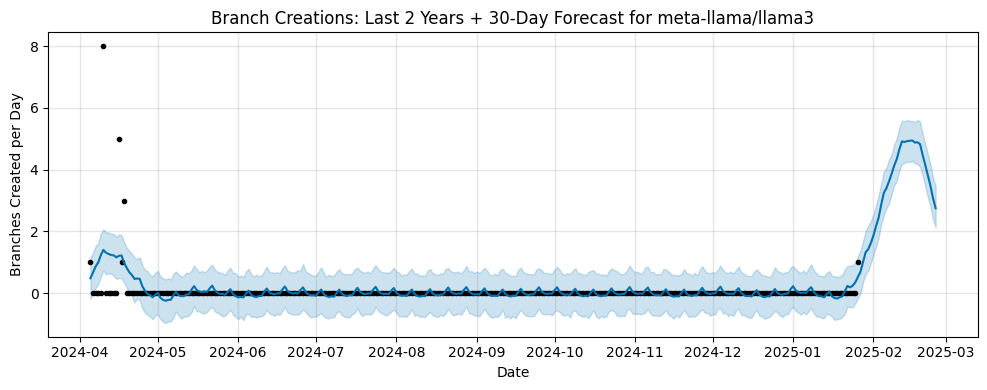


▶ Processing branch creations for ollama/ollama…


04:13:58 - cmdstanpy - INFO - Chain [1] start processing
04:13:58 - cmdstanpy - INFO - Chain [1] done processing


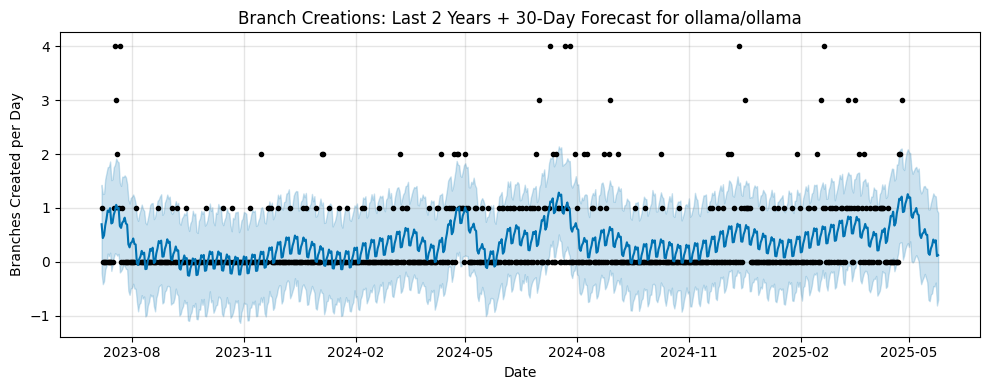


▶ Processing branch creations for langchain-ai/langchain…


04:24:09 - cmdstanpy - INFO - Chain [1] start processing
04:24:09 - cmdstanpy - INFO - Chain [1] done processing


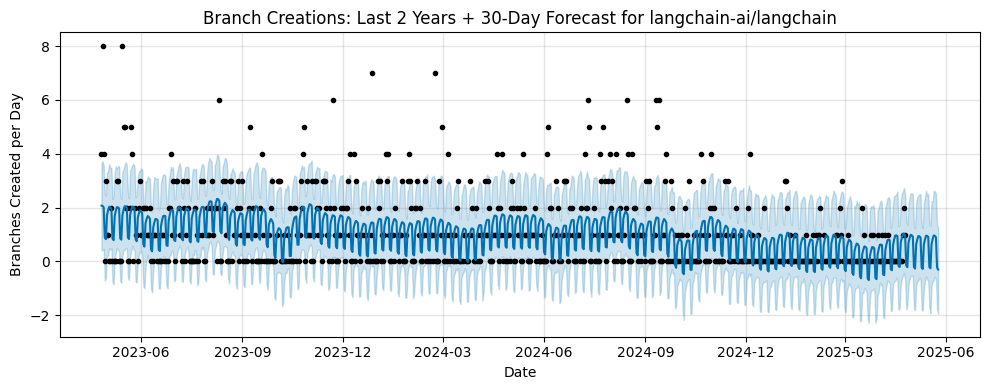


▶ Processing branch creations for langchain-ai/langgraph…


04:25:48 - cmdstanpy - INFO - Chain [1] start processing
04:25:48 - cmdstanpy - INFO - Chain [1] done processing


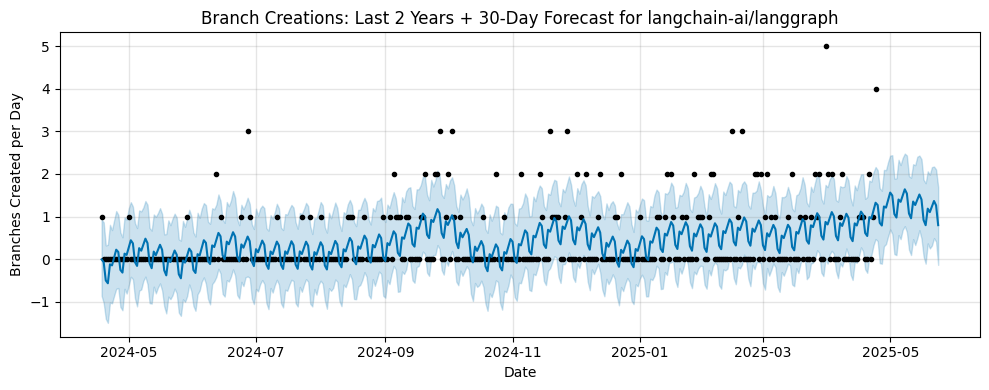


▶ Processing branch creations for microsoft/autogen…


04:28:18 - cmdstanpy - INFO - Chain [1] start processing
04:28:18 - cmdstanpy - INFO - Chain [1] done processing


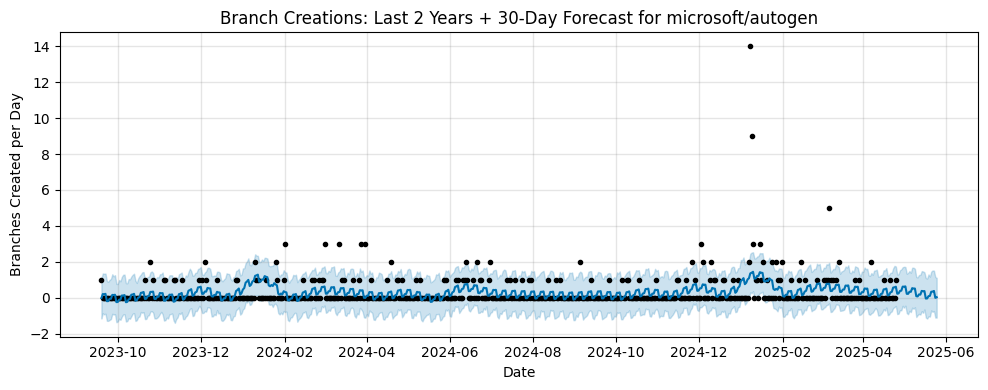


▶ Processing branch creations for openai/openai-cookbook…


04:28:52 - cmdstanpy - INFO - Chain [1] start processing
04:28:52 - cmdstanpy - INFO - Chain [1] done processing


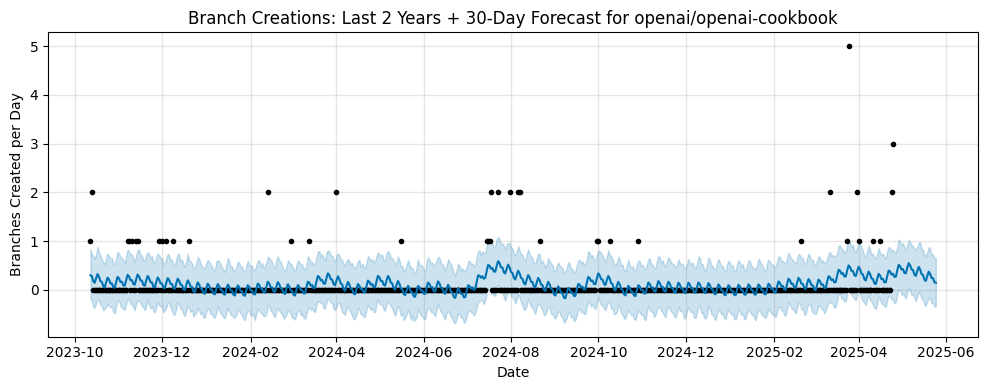


▶ Processing branch creations for elastic/elasticsearch…


04:35:29 - cmdstanpy - INFO - Chain [1] start processing
04:35:29 - cmdstanpy - INFO - Chain [1] done processing


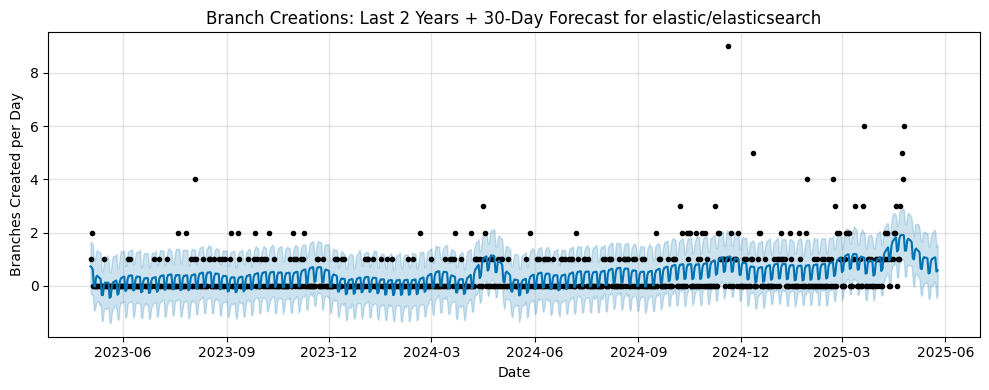


▶ Processing branch creations for milvus-io/pymilvus…


04:35:39 - cmdstanpy - INFO - Chain [1] start processing
04:35:39 - cmdstanpy - INFO - Chain [1] done processing


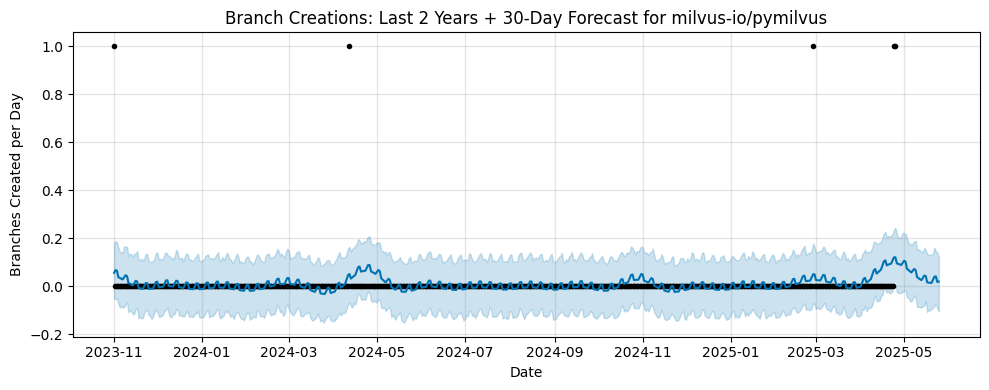

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone

from prophet import Prophet
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730   # last 2 years
FORECAST_DAYS = 30    # forecast horizon

# ── AUTHENTICATE WITH GITHUB ───────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)

# ── CUTOFF DATE (timezone‐aware) ────────────────────────────────────────────
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing branch creations for {repo_full}…")

    # 1) Gather all branch HEAD commit dates in the last 2 years
    branches = repo.get_branches()
    dates = [
        b.commit.commit.author.date
        for b in branches
        if b.commit.commit.author.date >= cutoff
    ]

    if not dates:
        print(f"  – No branch creation data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build a daily time series of branch counts
    df = pd.DataFrame({"ds": pd.to_datetime(dates)})
    daily = (
        df.set_index("ds")
          .resample("D")
          .size()
          .rename("y")
          .to_frame()
          .reset_index()
    )

    # 3) Fill missing days with zero
    full_idx = pd.date_range(daily["ds"].min(), daily["ds"].max(), freq="D")
    daily = (
        daily
        .set_index("ds")
        .reindex(full_idx, fill_value=0)
        .rename_axis("ds")
        .reset_index()
    )

    # 4) Strip timezone from 'ds' so Prophet will accept it
    daily["ds"] = daily["ds"].dt.tz_localize(None)

    # 5) Fit Prophet with weekly & yearly seasonality
    m = Prophet(weekly_seasonality=True, yearly_seasonality=True)
    m.fit(daily)

    # 6) Forecast the next FORECAST_DAYS
    future = m.make_future_dataframe(periods=FORECAST_DAYS, freq="D")
    forecast = m.predict(future)

    # 7) Plot historical + forecast
    fig, ax = plt.subplots(figsize=(10, 4))
    m.plot(forecast, ax=ax)
    ax.set_title(f"Branch Creations: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Branches Created per Day")
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-9). Plot the contributors forecast

</div>


▶ Processing contributors for meta-llama/llama3…


04:36:32 - cmdstanpy - INFO - Chain [1] start processing
04:36:32 - cmdstanpy - INFO - Chain [1] done processing


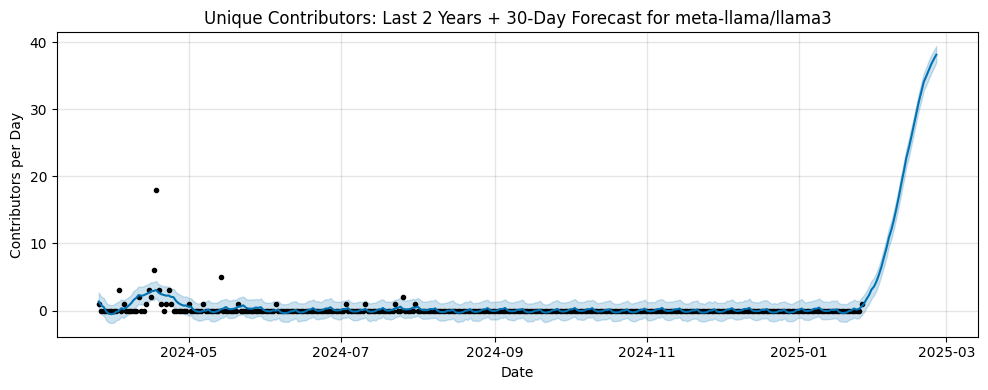


▶ Processing contributors for ollama/ollama…


04:38:01 - cmdstanpy - INFO - Chain [1] start processing
04:38:01 - cmdstanpy - INFO - Chain [1] done processing


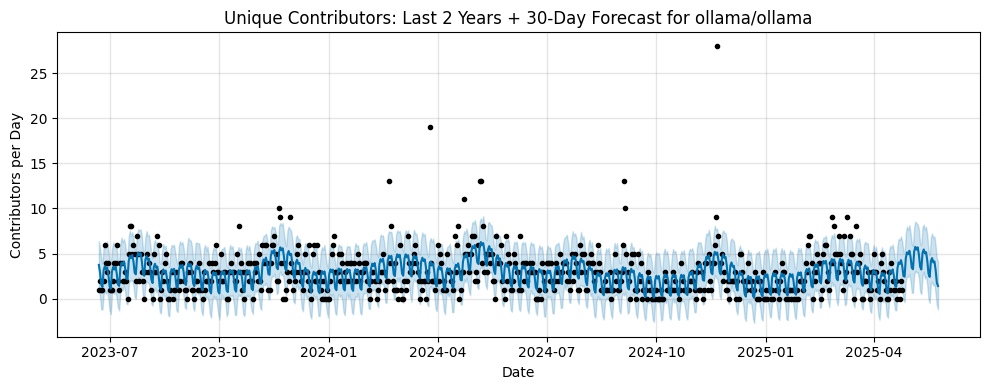


▶ Processing contributors for langchain-ai/langchain…


04:42:37 - cmdstanpy - INFO - Chain [1] start processing
04:42:37 - cmdstanpy - INFO - Chain [1] done processing


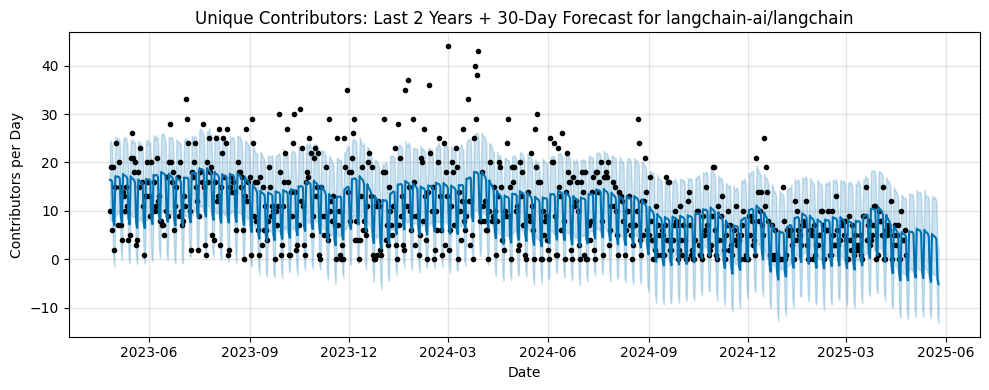


▶ Processing contributors for langchain-ai/langgraph…


04:44:27 - cmdstanpy - INFO - Chain [1] start processing
04:44:27 - cmdstanpy - INFO - Chain [1] done processing


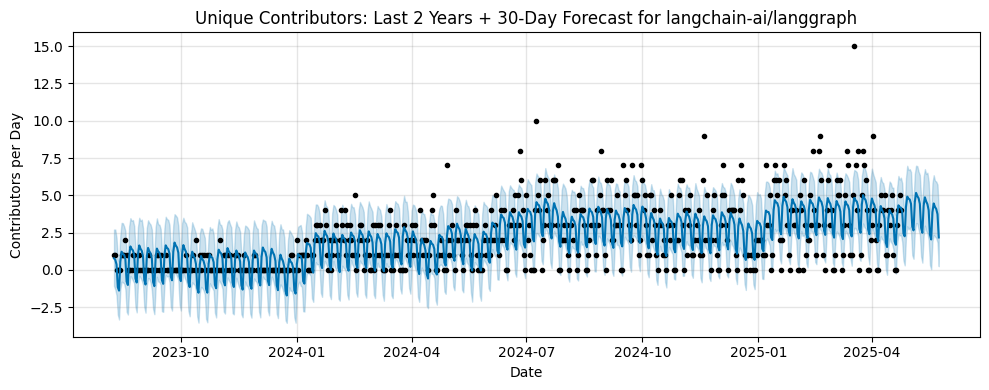


▶ Processing contributors for microsoft/autogen…


04:45:51 - cmdstanpy - INFO - Chain [1] start processing
04:45:51 - cmdstanpy - INFO - Chain [1] done processing


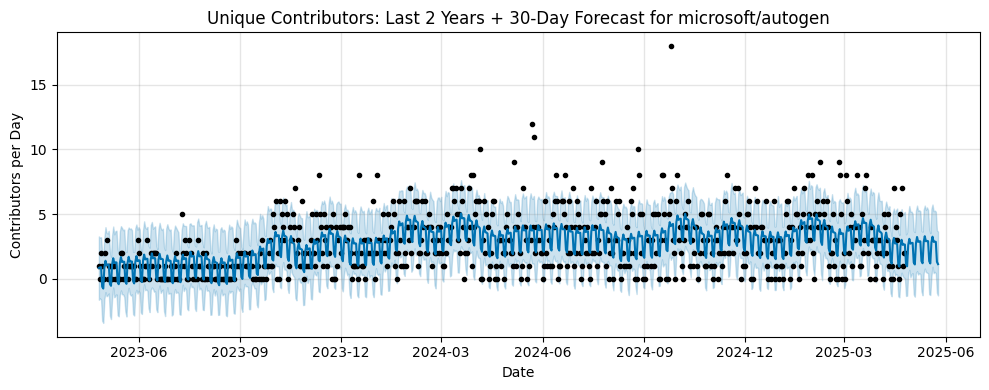


▶ Processing contributors for openai/openai-cookbook…


04:46:07 - cmdstanpy - INFO - Chain [1] start processing
04:46:07 - cmdstanpy - INFO - Chain [1] done processing


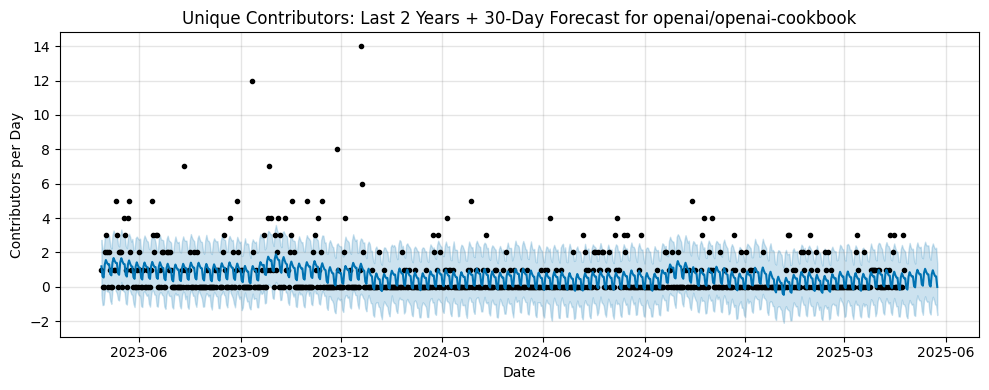


▶ Processing contributors for elastic/elasticsearch…


04:53:09 - cmdstanpy - INFO - Chain [1] start processing
04:53:09 - cmdstanpy - INFO - Chain [1] done processing


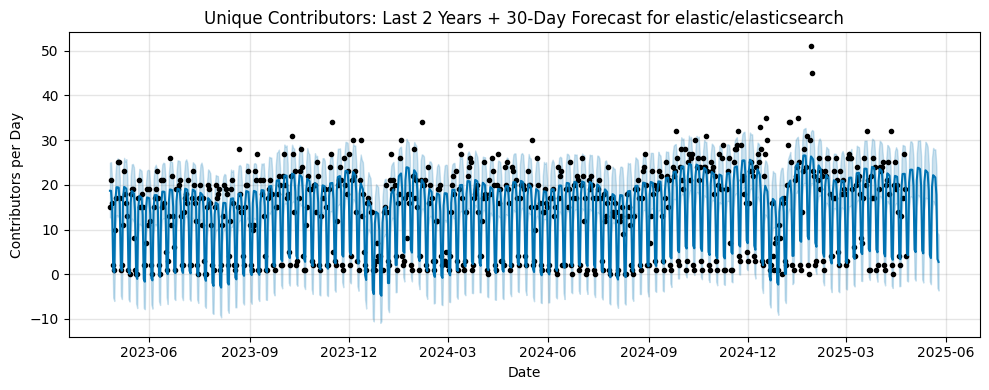


▶ Processing contributors for milvus-io/pymilvus…


04:53:20 - cmdstanpy - INFO - Chain [1] start processing
04:53:20 - cmdstanpy - INFO - Chain [1] done processing


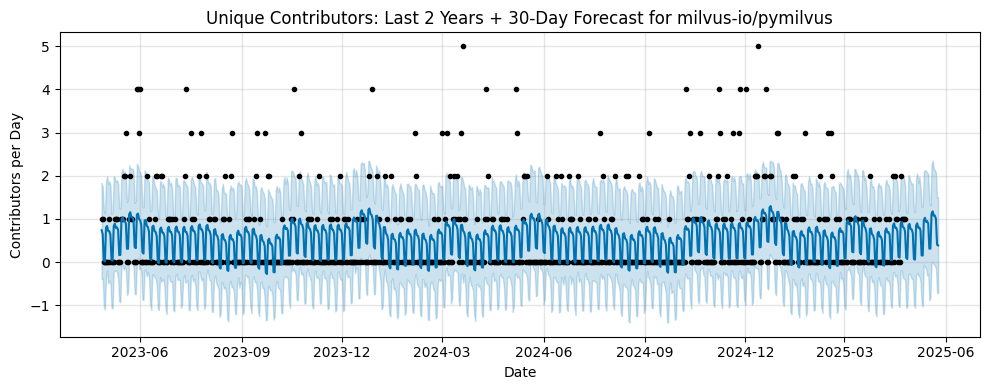

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone

from prophet import Prophet
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730   # last 2 years
FORECAST_DAYS = 30    # forecast horizon

# ── AUTHENTICATE WITH GITHUB ───────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)

# ── CUTOFF DATE (timezone‐aware) ────────────────────────────────────────────
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing contributors for {repo_full}…")

    # 1) Gather all commits in the last 2 years
    commits = repo.get_commits(since=cutoff)
    data = []
    for c in commits:
        dt = c.commit.author.date
        if dt >= cutoff:
            author = c.author.login if c.author else c.commit.author.name
            data.append((dt.date(), author))

    if not data:
        print(f"  – No commit data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build a daily time series of unique contributor counts
    df = pd.DataFrame(data, columns=["date", "author"])
    df["date"] = pd.to_datetime(df["date"])
    daily = (
        df.groupby("date")["author"]
          .nunique()
          .rename("y")
          .to_frame()
          .reset_index()
          .rename(columns={"date":"ds"})
    )

    # 3) Fill missing days with zero
    full_idx = pd.date_range(daily["ds"].min(), daily["ds"].max(), freq="D")
    daily = (
        daily
        .set_index("ds")
        .reindex(full_idx, fill_value=0)
        .rename_axis("ds")
        .reset_index()
    )

    # 4) Strip timezone so Prophet accepts it
    daily["ds"] = daily["ds"].dt.tz_localize(None)

    # 5) Fit Prophet with weekly & yearly seasonality
    m = Prophet(weekly_seasonality=True, yearly_seasonality=True)
    m.fit(daily)

    # 6) Forecast next FORECAST_DAYS
    future = m.make_future_dataframe(periods=FORECAST_DAYS, freq="D")
    forecast = m.predict(future)

    # 7) Plot historical + forecast
    fig, ax = plt.subplots(figsize=(10, 4))
    m.plot(forecast, ax=ax)
    ax.set_title(f"Unique Contributors: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Contributors per Day")
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-10). Plot the releases forecast

</div>


▶ Processing releases for meta-llama/llama3…
  – No release data in last 730 days, skipping.

▶ Processing releases for ollama/ollama…


04:54:47 - cmdstanpy - INFO - Chain [1] start processing
04:54:47 - cmdstanpy - INFO - Chain [1] done processing


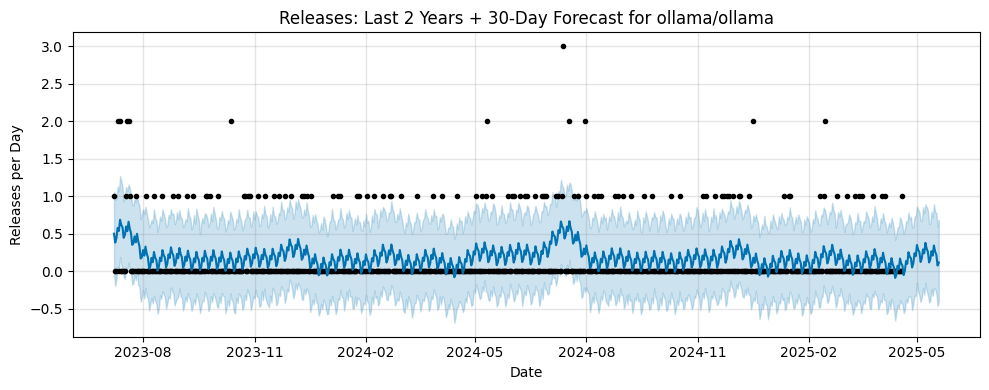


▶ Processing releases for langchain-ai/langchain…


04:55:08 - cmdstanpy - INFO - Chain [1] start processing
04:55:08 - cmdstanpy - INFO - Chain [1] done processing


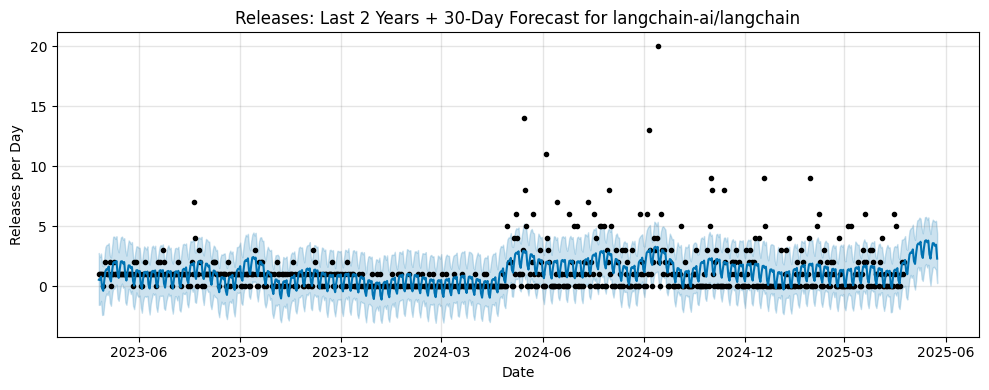


▶ Processing releases for langchain-ai/langgraph…


04:55:16 - cmdstanpy - INFO - Chain [1] start processing
04:55:16 - cmdstanpy - INFO - Chain [1] done processing


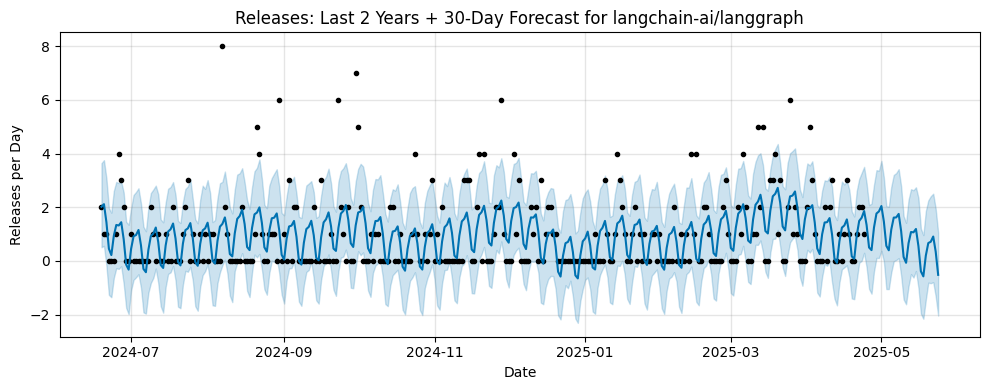


▶ Processing releases for microsoft/autogen…


04:55:19 - cmdstanpy - INFO - Chain [1] start processing
04:55:19 - cmdstanpy - INFO - Chain [1] done processing


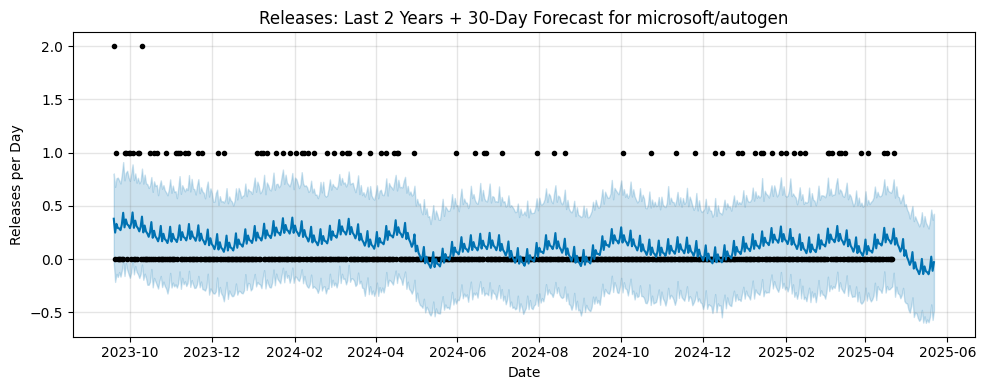


▶ Processing releases for openai/openai-cookbook…
  – No release data in last 730 days, skipping.

▶ Processing releases for elastic/elasticsearch…


04:55:26 - cmdstanpy - INFO - Chain [1] start processing
04:55:26 - cmdstanpy - INFO - Chain [1] done processing


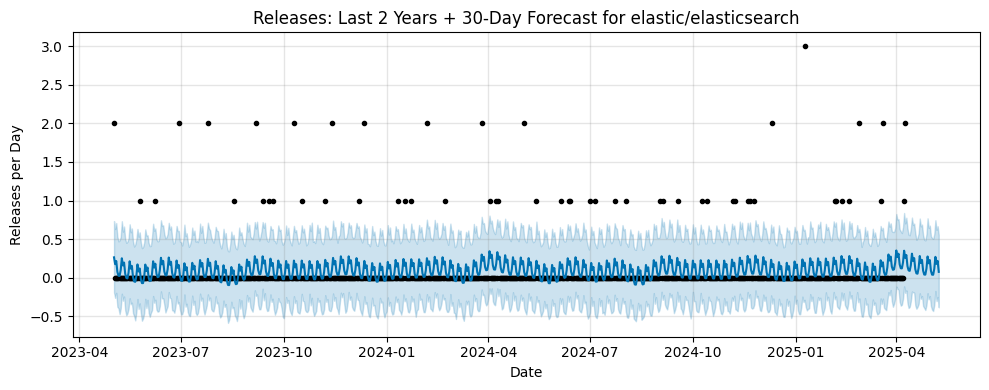


▶ Processing releases for milvus-io/pymilvus…


04:55:29 - cmdstanpy - INFO - Chain [1] start processing
04:55:29 - cmdstanpy - INFO - Chain [1] done processing


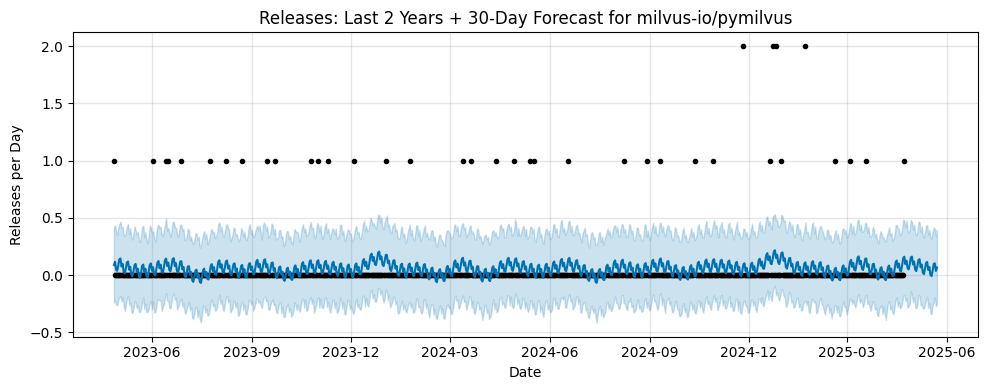

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone

from prophet import Prophet
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730   # last 2 years
FORECAST_DAYS = 30    # forecast horizon

# ── AUTHENTICATE WITH GITHUB ───────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)

# ── CUTOFF DATE (timezone‐aware) ────────────────────────────────────────────
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing releases for {repo_full}…")

    # 1) Gather all release dates in the last 2 years
    releases = list(repo.get_releases())
    dates = [rel.created_at for rel in releases if rel.created_at and rel.created_at >= cutoff]

    if not dates:
        print(f"  – No release data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build a daily time series of release counts
    df = pd.DataFrame({"ds": pd.to_datetime(dates)})
    daily = (
        df.set_index("ds")
          .resample("D")
          .size()
          .rename("y")
          .to_frame()
          .reset_index()
    )

    # 3) Fill missing days with zero
    full_idx = pd.date_range(daily["ds"].min(), daily["ds"].max(), freq="D")
    daily = (
        daily
        .set_index("ds")
        .reindex(full_idx, fill_value=0)
        .rename_axis("ds")
        .reset_index()
    )

    # 4) Strip timezone so Prophet accepts it
    daily["ds"] = daily["ds"].dt.tz_localize(None)

    # 5) Fit Prophet with weekly & yearly seasonality
    m = Prophet(weekly_seasonality=True, yearly_seasonality=True)
    m.fit(daily)

    # 6) Forecast the next FORECAST_DAYS
    future = m.make_future_dataframe(periods=FORECAST_DAYS, freq="D")
    forecast = m.predict(future)

    # 7) Plot historical + forecast
    fig, ax = plt.subplots(figsize=(10, 4))
    m.plot(forecast, ax=ax)
    ax.set_title(f"Releases: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Releases per Day")
    plt.tight_layout()
    plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 10 (STATSMODEL)
- Use StatsModel package to forecast the following for every repository
    
</div>

<div class="alert alert-block alert-danger">   
    
#### REQ10-1). The day of the week maximum number of issues created 
    
</div>

In [43]:
pip install statsmodels

   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   -- ------------------------------------- 0.5/9.9 MB 4.2 MB/s eta 0:00:03
   ----- ---------------------------------- 1.3/9.9 MB 4.5 MB/s eta 0:00:02
   -------- ------------------------------- 2.1/9.9 MB 3.8 MB/s eta 0:00:03
   ----------- ---------------------------- 2.9/9.9 MB 3.7 MB/s eta 0:00:02
   ------------- -------------------------- 3.4/9.9 MB 3.7 MB/s eta 0:00:02
   ----------------- ---------------------- 4.2/9.9 MB 3.5 MB/s eta 0:00:02
   ------------------- -------------------- 4.7/9.9 MB 3.4 MB/s eta 0:00:02
   --------------------- ------------------ 5.2/9.9 MB 3.4 MB/s eta 0:00:02
   ------------------------ --------------- 6.0/9.9 MB 3.4 MB/s eta 0:00:02
   -------------------------- ------------- 6.6/9.9 MB 3.4 MB/s eta 0:00:01
   ----------------------------- ---------- 7.3/9.9 MB 3.3 MB/s eta 0:00:01
   -------------------------------- ------- 8.1/9.9 MB 3.4 MB/s eta 0:00:01
   ----------------

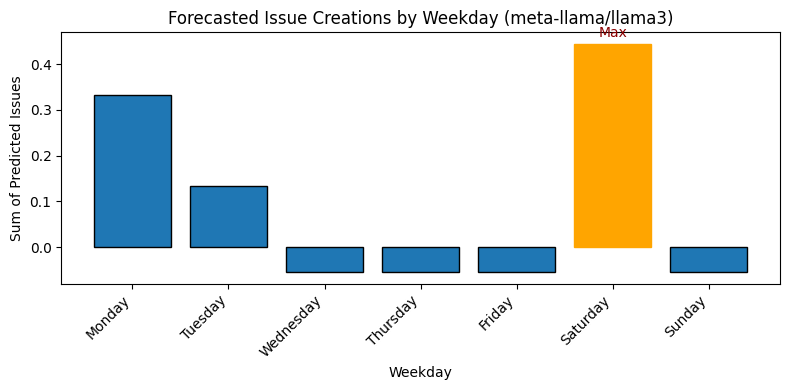

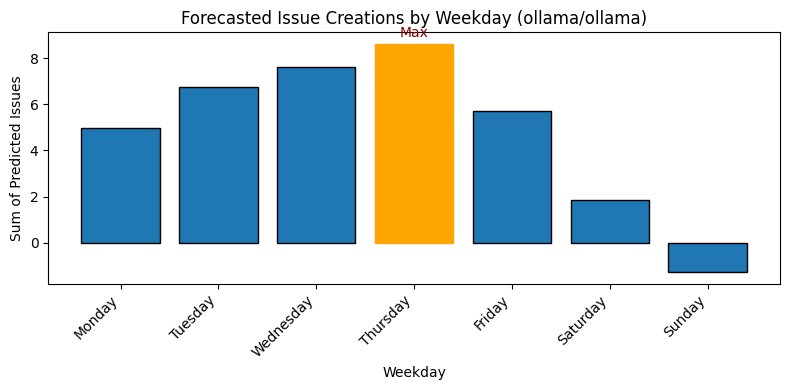

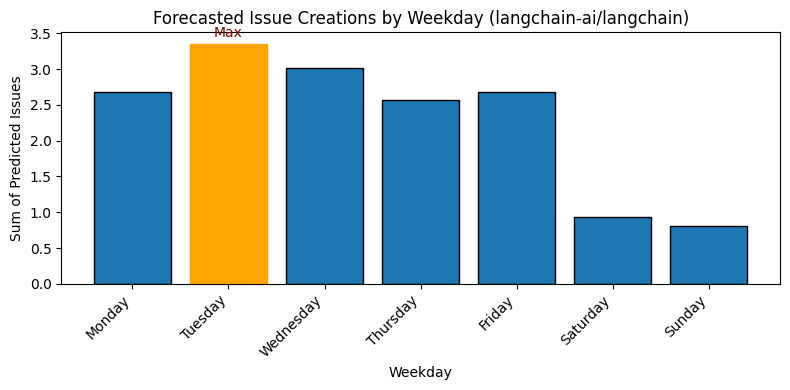

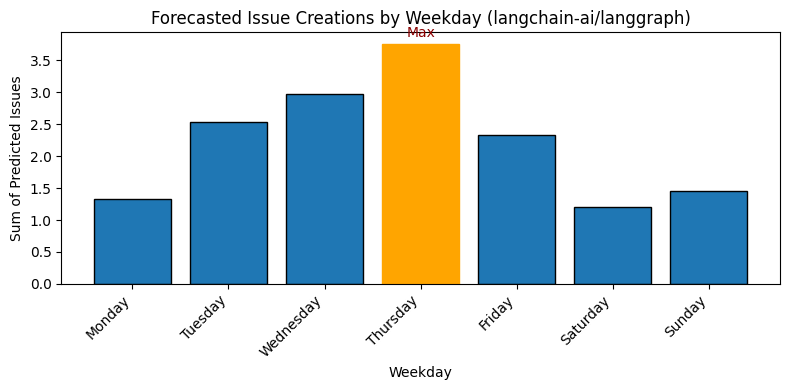

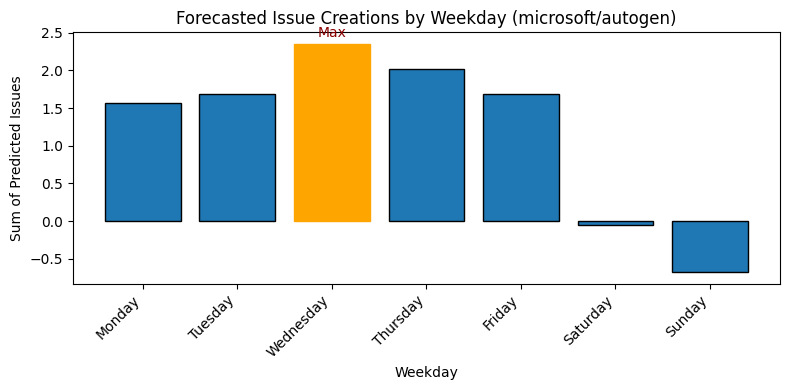

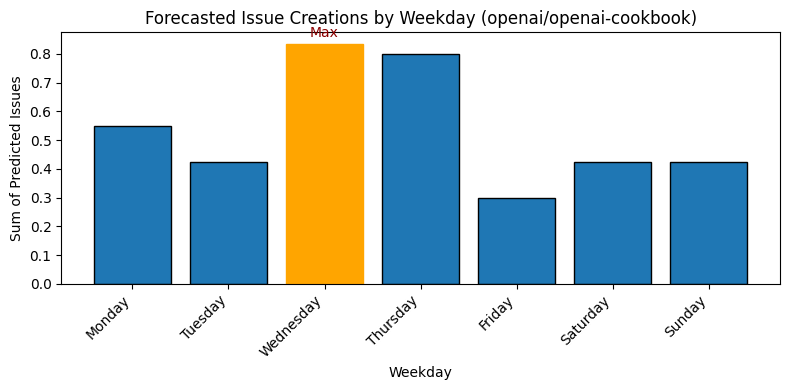

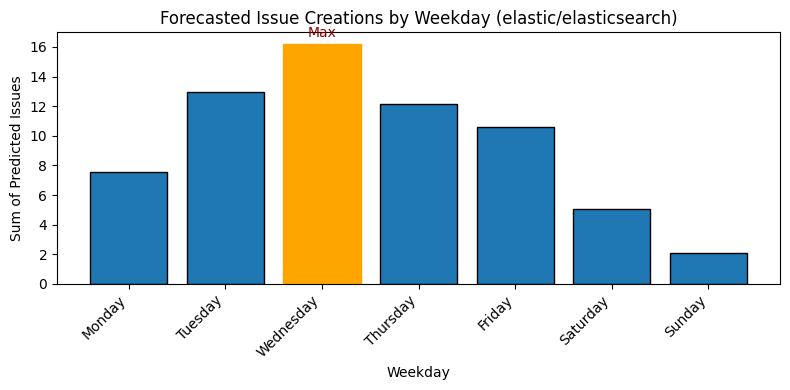

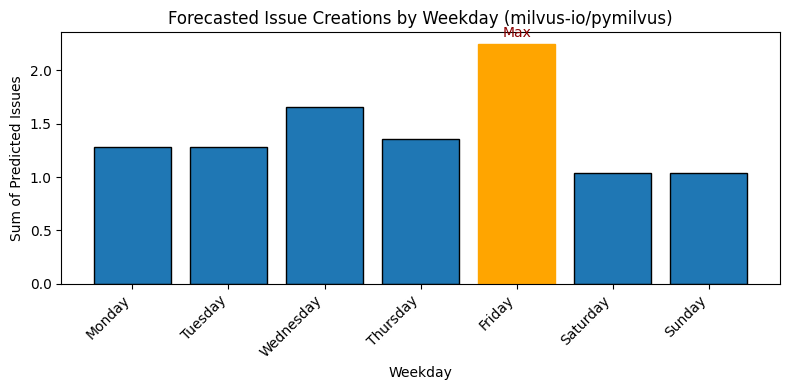

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ── Load & prepare data ──────────────────────────────────────────────────────
df = pd.read_json('issues.json', lines=True)
df['created_at'] = pd.to_datetime(df['created_at'])

# Filter to last 2 months
cutoff = datetime.now() - timedelta(days=60)
df_recent = df[df['created_at'] >= cutoff]

FORECAST_DAYS = 7
WEEK_ORDER = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

# ── Loop per repository and plot weekday‐bar chart of forecasted creations ────
for repo in df_recent['repository'].unique():
    repo_df = df_recent[df_recent['repository'] == repo]
    # Build daily series
    daily = (
        repo_df
        .groupby(repo_df['created_at'].dt.date)
        .size()
        .rename('count')
        .to_frame()
    )
    daily.index = pd.to_datetime(daily.index)
    daily = daily.asfreq('D', fill_value=0)
    
    # Fit Holt–Winters model
    model = ExponentialSmoothing(
        daily['count'],
        trend='add',
        seasonal='add',
        seasonal_periods=7
    )
    fit = model.fit(optimized=True)
    
    # Forecast next 7 days
    forecast = fit.forecast(FORECAST_DAYS)
    
    # Map forecast dates to weekdays and sum predictions
    weekday_preds = pd.Series(
        forecast.values, 
        index=forecast.index
    ).groupby(forecast.index.day_name()).sum().reindex(WEEK_ORDER).fillna(0)
    
    # Plot bar chart
    plt.figure(figsize=(8, 4))
    bars = plt.bar(weekday_preds.index, weekday_preds.values, edgecolor='black')
    plt.title(f'Forecasted Issue Creations by Weekday ({repo})')
    plt.xlabel('Weekday')
    plt.ylabel('Sum of Predicted Issues')
    plt.xticks(rotation=45, ha='right')
    
    # Highlight and annotate max
    max_idx = weekday_preds.values.argmax()
    bars[max_idx].set_color('orange')
    plt.text(
        max_idx, 
        weekday_preds.values[max_idx] * 1.02,
        'Max',
        ha='center', 
        va='bottom',
        color='darkred'
    )
    
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-danger">   
    
#### REQ10-2). The day of the week maximum number of issues closed 

</div>

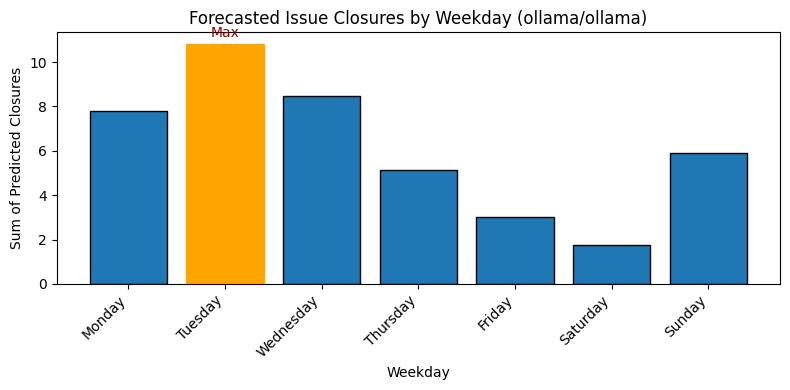

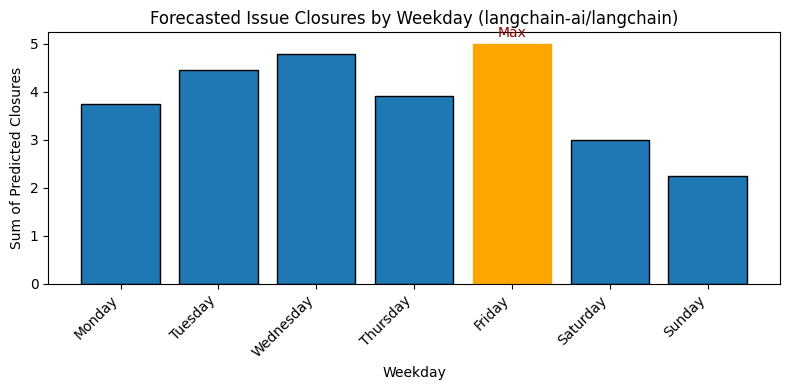

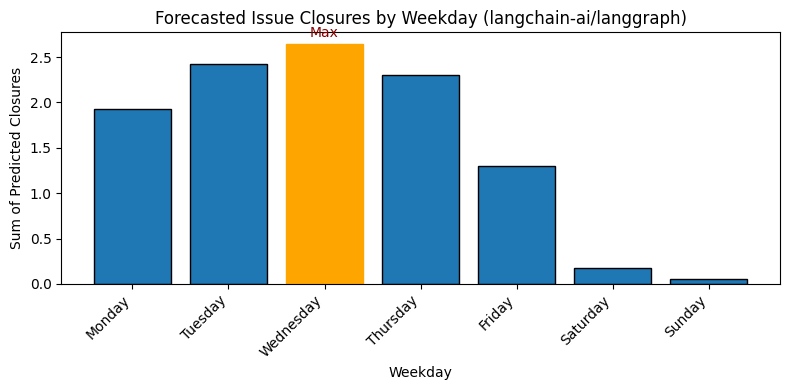

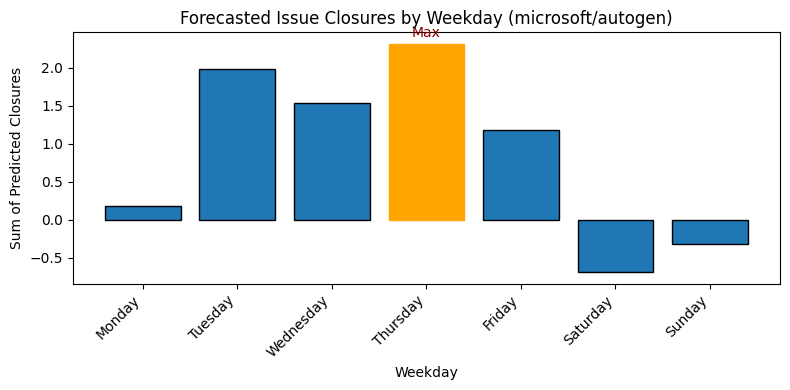

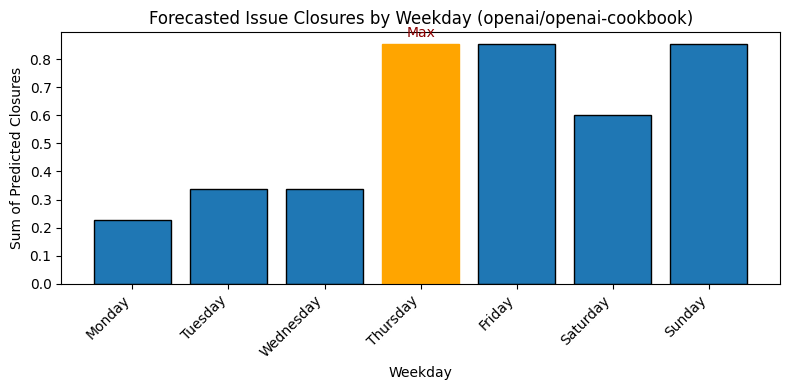

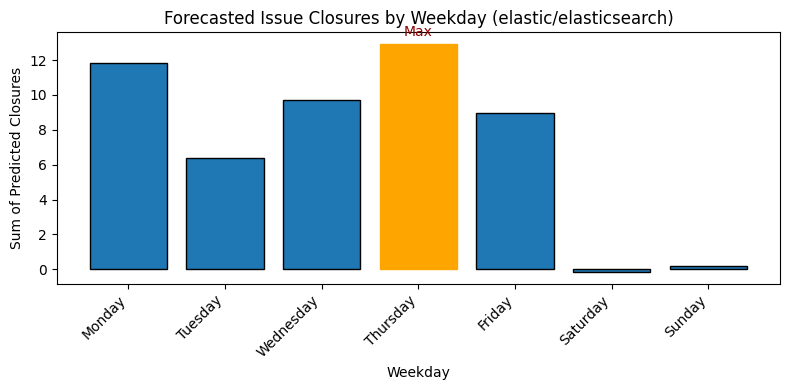

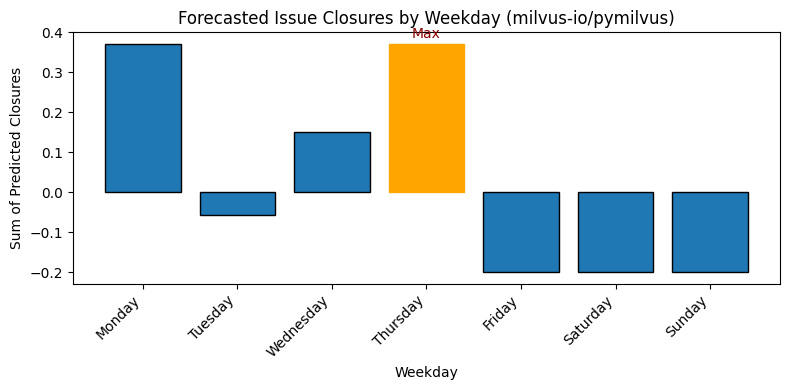

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ── Load & prepare data ──────────────────────────────────────────────────────
df = pd.read_json('issues.json', lines=True)
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')

# ── Filter to last 2 months of closures ──────────────────────────────────────
cutoff = datetime.now() - timedelta(days=60)
df_recent = df[df['closed_at'] >= cutoff].dropna(subset=['closed_at'])

FORECAST_DAYS = 7
WEEK_ORDER    = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

# ── Loop per repository and plot forecasted closures by weekday ─────────────
for repo in df_recent['repository'].unique():
    repo_df = df_recent[df_recent['repository'] == repo]
    if repo_df.empty:
        continue

    # 1) Build daily closed-issue counts
    daily = (
        repo_df
        .groupby(repo_df['closed_at'].dt.date)
        .size()
        .rename('count')
        .to_frame()
    )
    daily.index = pd.to_datetime(daily.index)
    daily = daily.asfreq('D', fill_value=0)

    # 2) Fit Holt–Winters with weekly seasonality
    model = ExponentialSmoothing(
        daily['count'],
        trend='add',
        seasonal='add',
        seasonal_periods=7
    )
    fit = model.fit(optimized=True)

    # 3) Forecast next 7 days
    forecast = fit.forecast(FORECAST_DAYS)

    # 4) Aggregate forecast by weekday
    weekday_preds = (
        pd.Series(forecast.values, index=forecast.index)
          .groupby(forecast.index.day_name())
          .sum()
          .reindex(WEEK_ORDER)
          .fillna(0)
    )

    # 5) Plot a bar chart for this repository
    plt.figure(figsize=(8, 4))
    bars = plt.bar(weekday_preds.index, weekday_preds.values, edgecolor='black')
    plt.title(f'Forecasted Issue Closures by Weekday ({repo})')
    plt.xlabel('Weekday')
    plt.ylabel('Sum of Predicted Closures')
    plt.xticks(rotation=45, ha='right')

    # 6) Highlight & annotate the max weekday
    max_idx = weekday_preds.values.argmax()
    bars[max_idx].set_color('orange')
    plt.text(
        max_idx,
        weekday_preds.values[max_idx] * 1.02,
        'Max',
        ha='center',
        va='bottom',
        color='darkred'
    )

    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-danger">   
    
#### REQ10-3). The month of the year that has maximum number of issues closed 


</div>

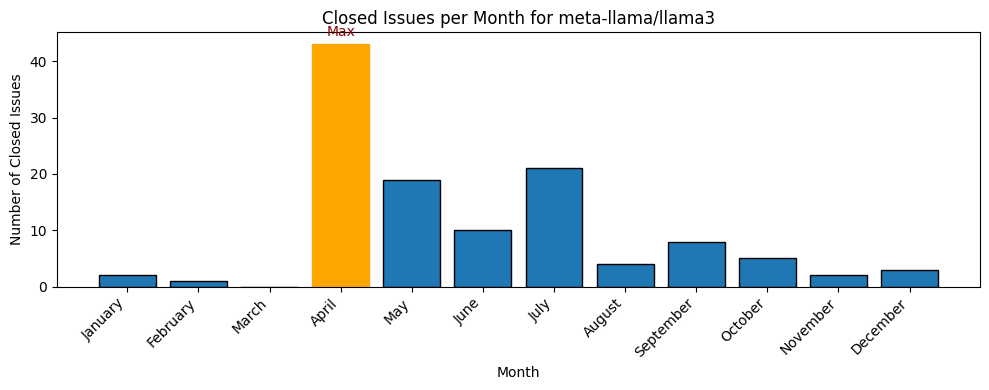

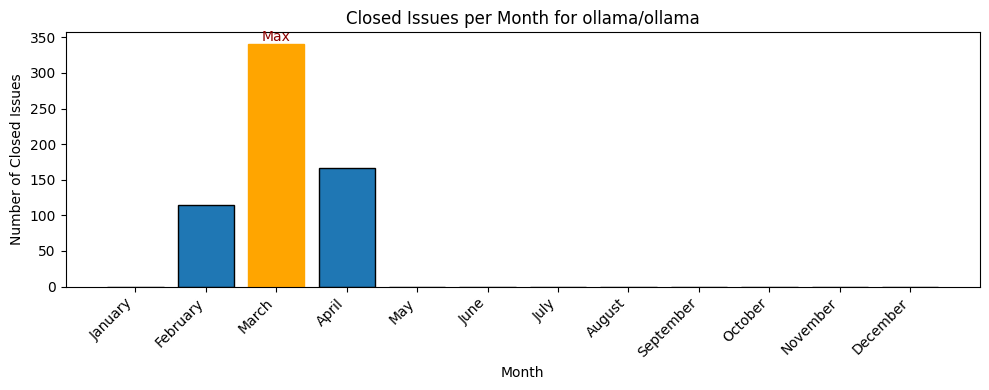

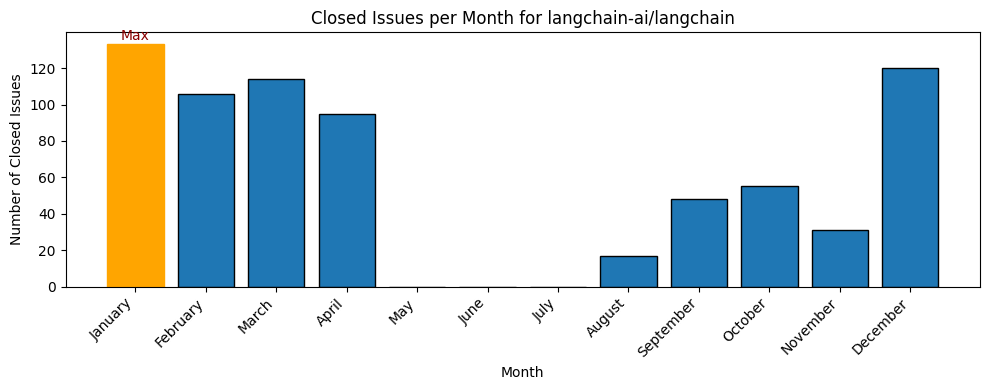

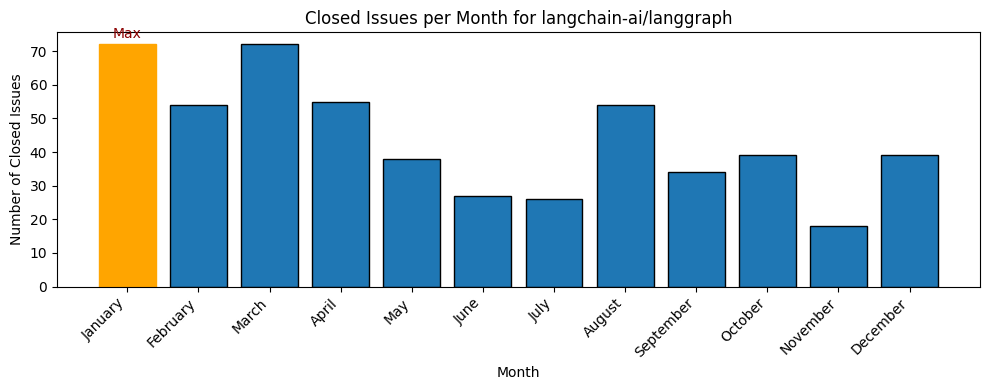

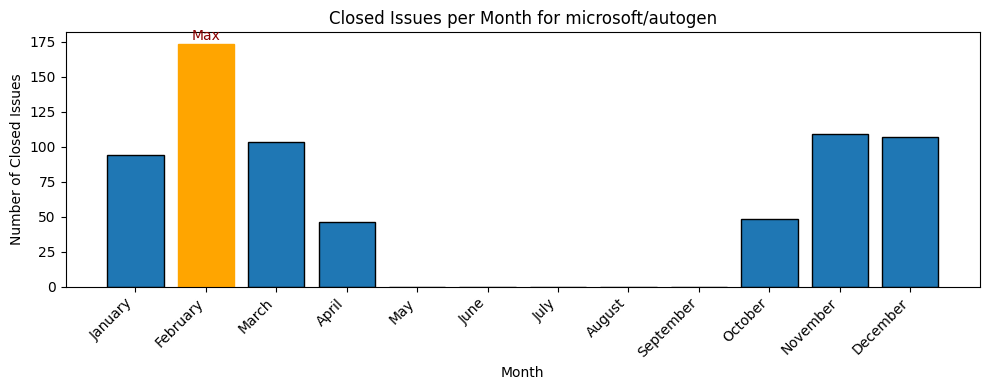

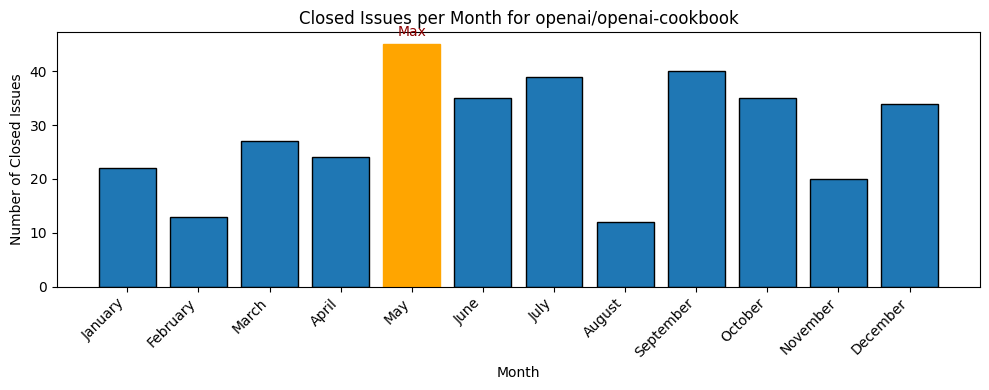

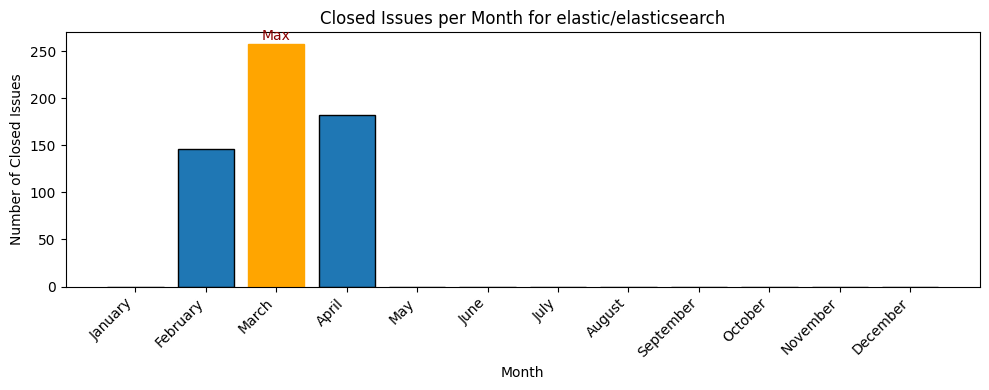

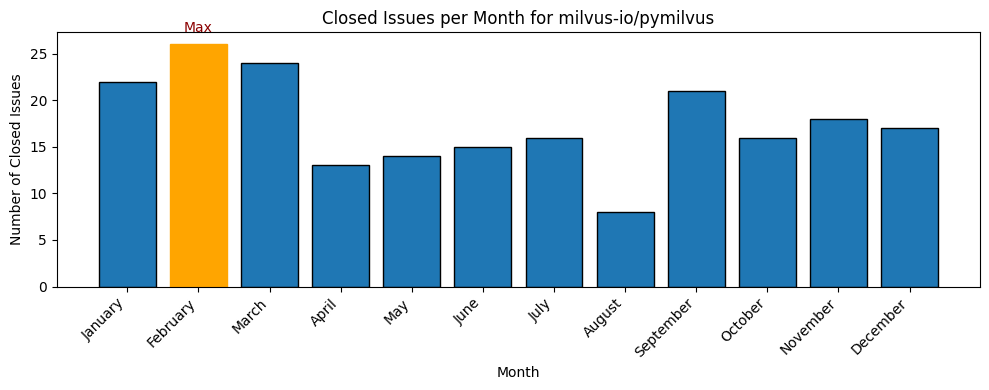

In [74]:
import pandas as pd
import matplotlib.pyplot as plt

# ── Load & prepare data ──────────────────────────────────────────────────────
df = pd.read_json('issues.json', lines=True)
df['closed_at'] = pd.to_datetime(df['closed_at'], errors='coerce')
df_closed = df.dropna(subset=['closed_at']).copy()

# Chronological month order
months_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]

# ── Loop per repository and plot monthly closed‐issue counts ─────────────────
for repo in df_closed['repository'].unique():
    repo_df = df_closed[df_closed['repository'] == repo]
    if repo_df.empty:
        continue

    # 1) Count closures by month
    monthly_counts = (
        repo_df
        .groupby(repo_df['closed_at'].dt.month_name())
        .size()
        .reindex(months_order, fill_value=0)
    )

    # 2) Plot
    plt.figure(figsize=(10, 4))
    bars = plt.bar(monthly_counts.index, monthly_counts.values, edgecolor='black')
    plt.title(f'Closed Issues per Month for {repo}')
    plt.xlabel('Month')
    plt.ylabel('Number of Closed Issues')
    plt.xticks(rotation=45, ha='right')

    # 3) Highlight & annotate the month with max closures
    max_idx = monthly_counts.values.argmax()
    bars[max_idx].set_color('orange')
    plt.text(
        max_idx,
        monthly_counts.values[max_idx] + 1,
        'Max',
        ha='center',
        va='bottom',
        color='darkred'
    )

    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-danger">   
    
#### REQ10-4). Plot the created issues forecast 

</div>


▶ Processing created‐issues for meta-llama/llama3…


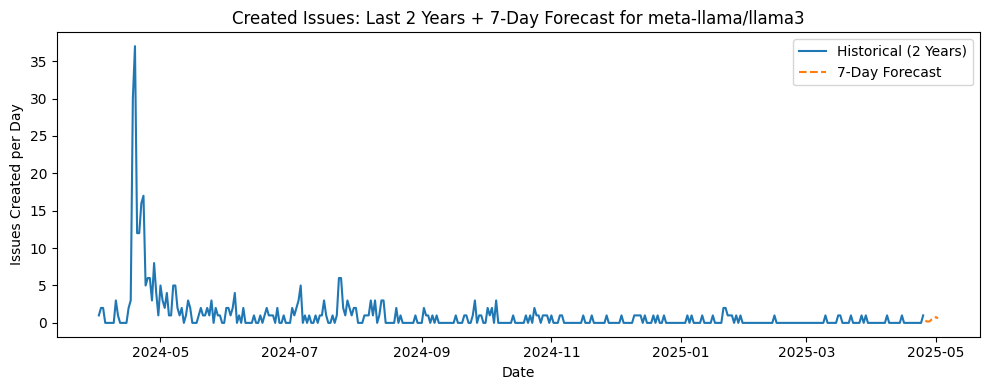


▶ Processing created‐issues for ollama/ollama…


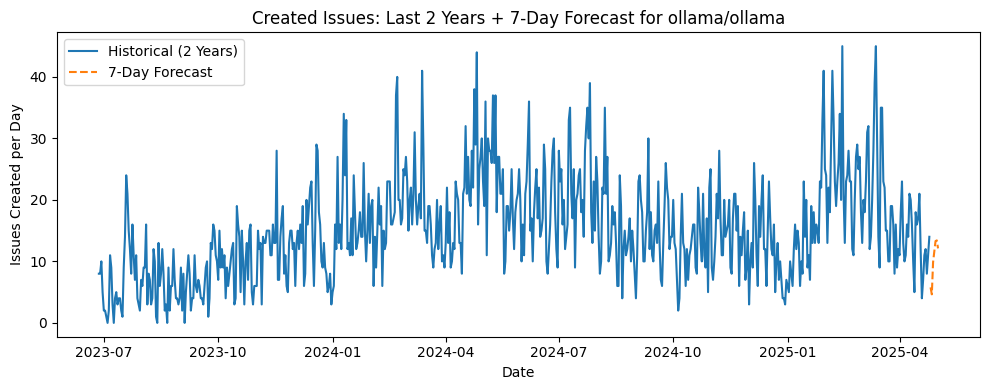


▶ Processing created‐issues for langchain-ai/langchain…


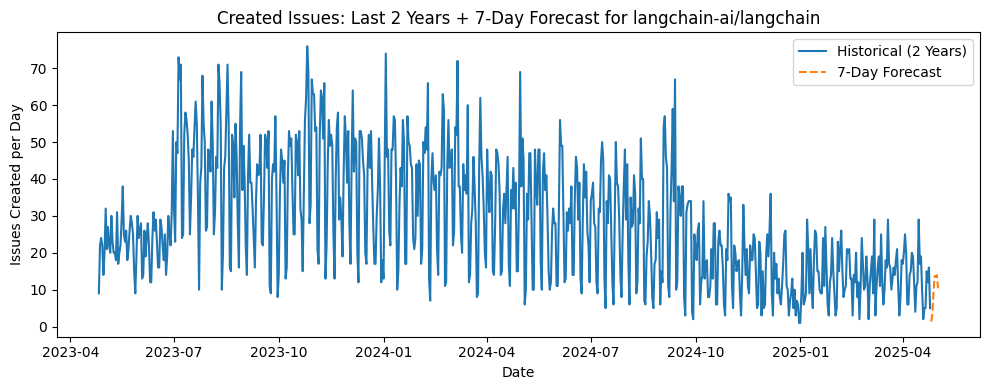


▶ Processing created‐issues for langchain-ai/langgraph…


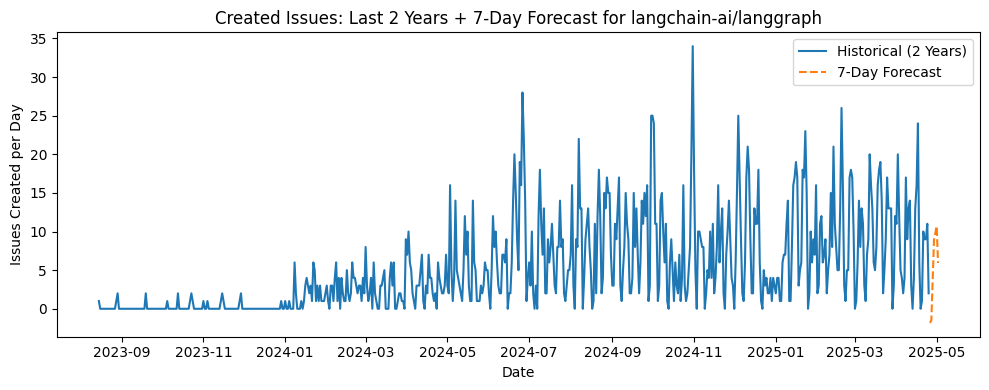


▶ Processing created‐issues for microsoft/autogen…


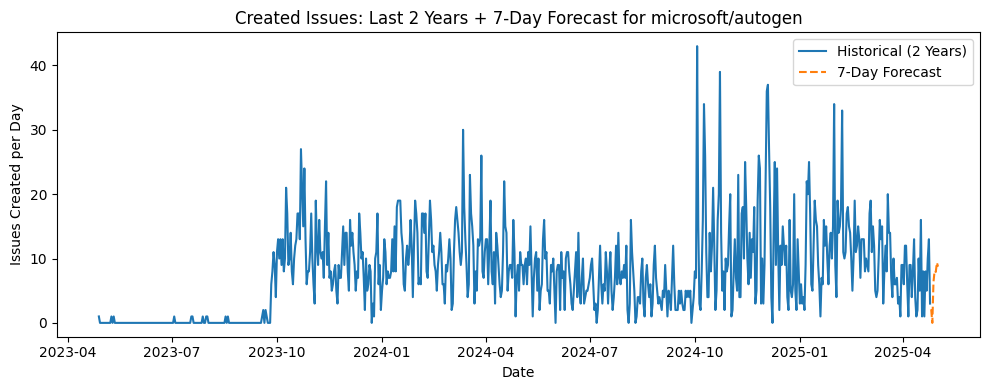


▶ Processing created‐issues for openai/openai-cookbook…


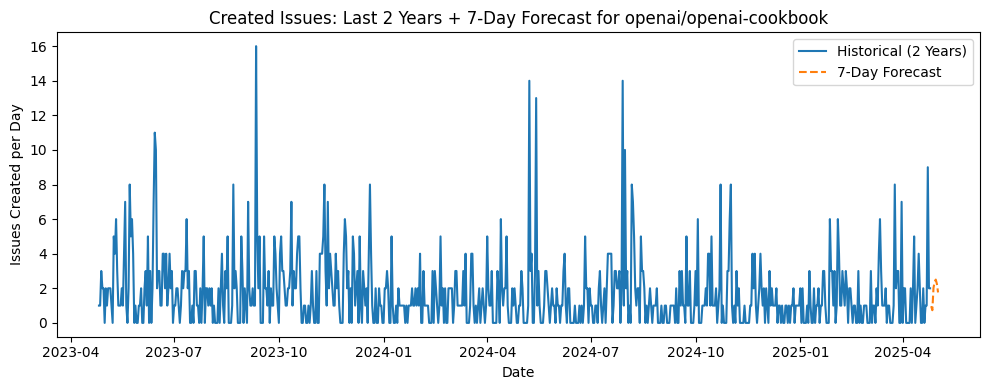


▶ Processing created‐issues for elastic/elasticsearch…


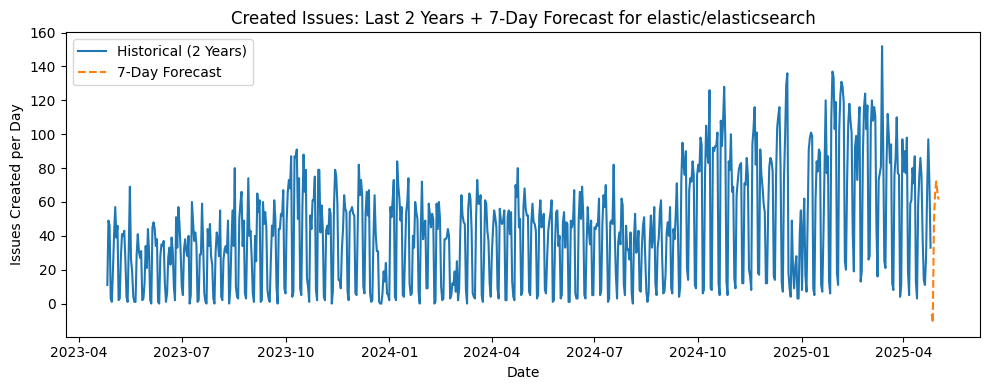


▶ Processing created‐issues for milvus-io/pymilvus…


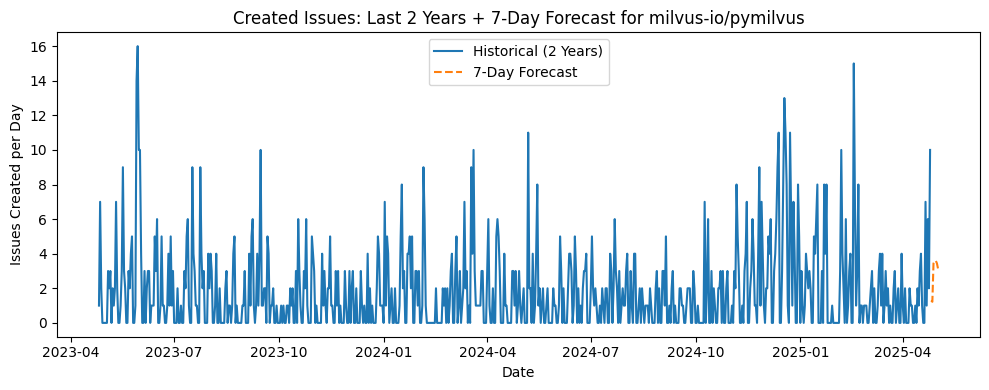

In [ ]:
# REQ10-4: Created Issues Forecast using StatsModels (Last 2 Years + 7-Day Forecast via GitHub API)

import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone
from github import Github
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""

REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730    # use last 2 years of history
FORECAST_DAYS = 7      # forecast next week

# ── AUTHENTICATE ─────────────────────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing created‐issues for {repo_full}…")

    # 1) Fetch all issues (open+closed) created in the last two years
    issues = repo.get_issues(state="all", since=cutoff)
    dates = [
        iss.created_at
        for iss in issues
        if iss.created_at and iss.created_at >= cutoff
    ]

    if not dates:
        print(f"  – No created‐issue data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build daily time series of creation counts
    df = pd.DataFrame({"date": pd.to_datetime(dates)})
    daily = (
        df.set_index("date")
          .resample("D")
          .size()
          .rename("count")
          .to_frame()
          .asfreq("D", fill_value=0)
    )

    # 3) Fit Holt–Winters model with weekly seasonality
    model = ExponentialSmoothing(
        daily["count"],
        trend="add",
        seasonal="add",
        seasonal_periods=7
    )
    fit = model.fit(optimized=True)

    # 4) Forecast next 7 days
    forecast = fit.forecast(FORECAST_DAYS)

    # 5) Plot history + forecast
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index, daily["count"], label="Historical (2 Years)")
    plt.plot(forecast.index, forecast.values, "--", label="7-Day Forecast")
    plt.title(f"Created Issues: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("Issues Created per Day")
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-danger">   
    
#### REQ10-5). Plot the closed issues forecast 

</div>


▶ Processing closed‐issues for meta-llama/llama3…


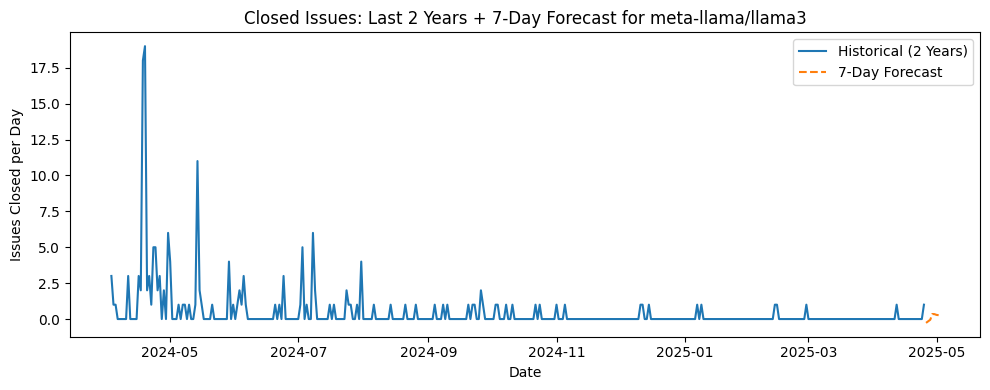


▶ Processing closed‐issues for ollama/ollama…


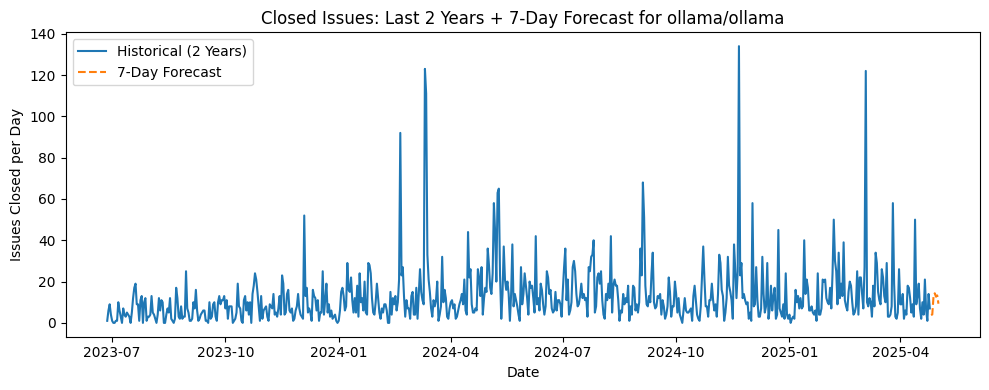


▶ Processing closed‐issues for langchain-ai/langchain…


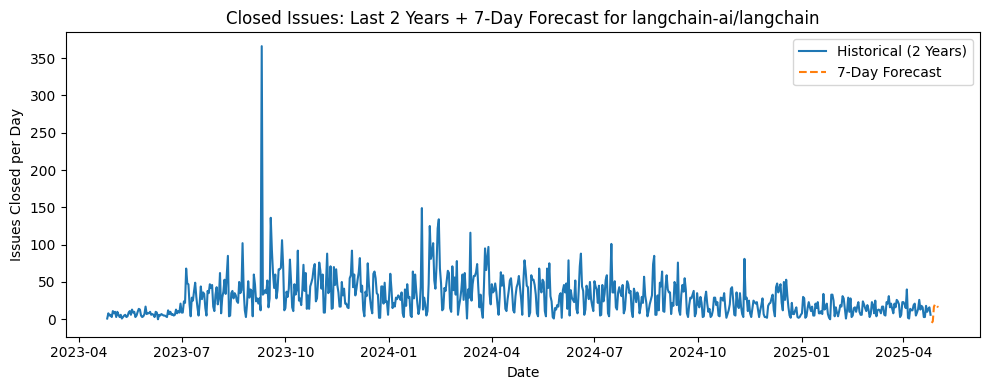


▶ Processing closed‐issues for langchain-ai/langgraph…


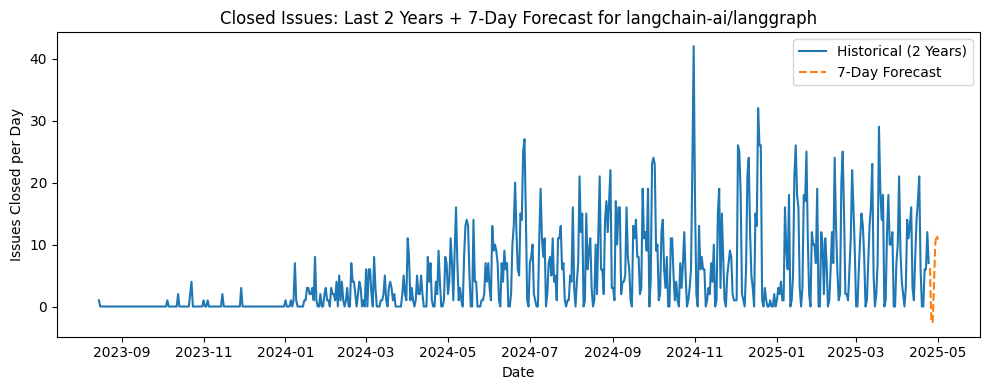


▶ Processing closed‐issues for microsoft/autogen…


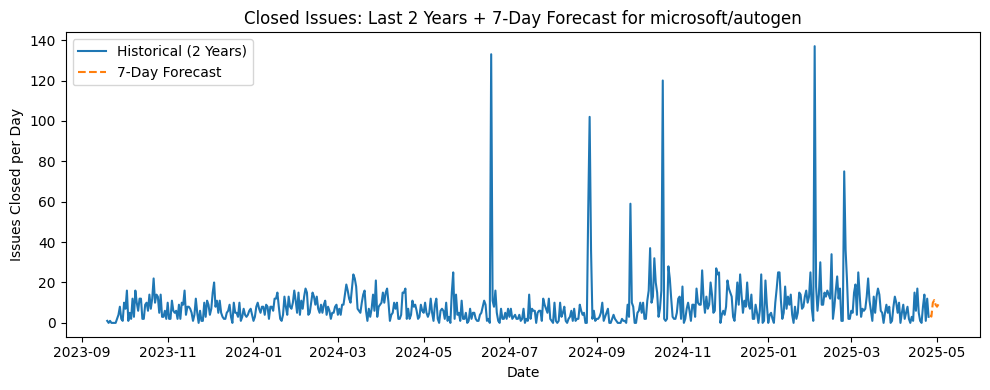


▶ Processing closed‐issues for openai/openai-cookbook…


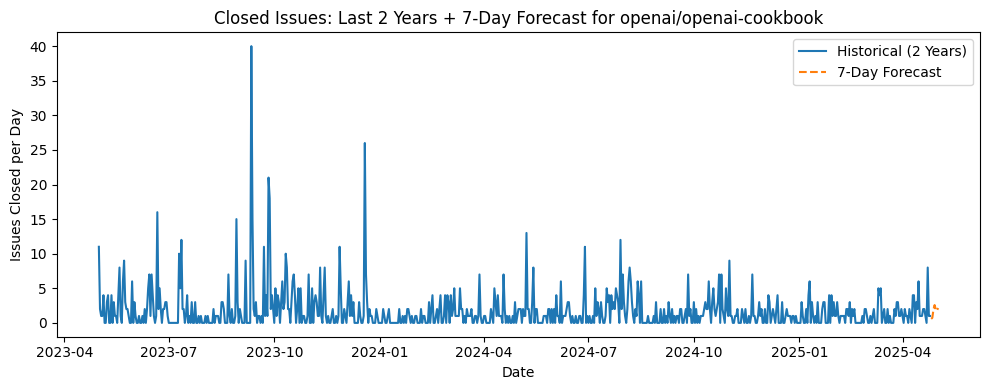


▶ Processing closed‐issues for elastic/elasticsearch…


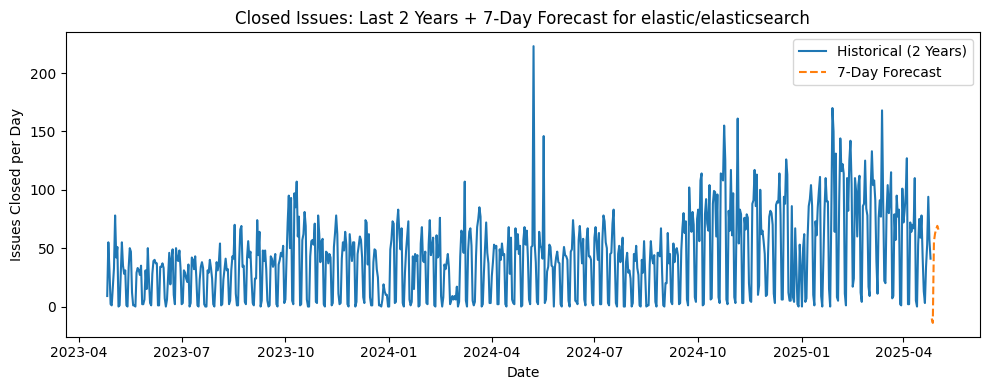


▶ Processing closed‐issues for milvus-io/pymilvus…


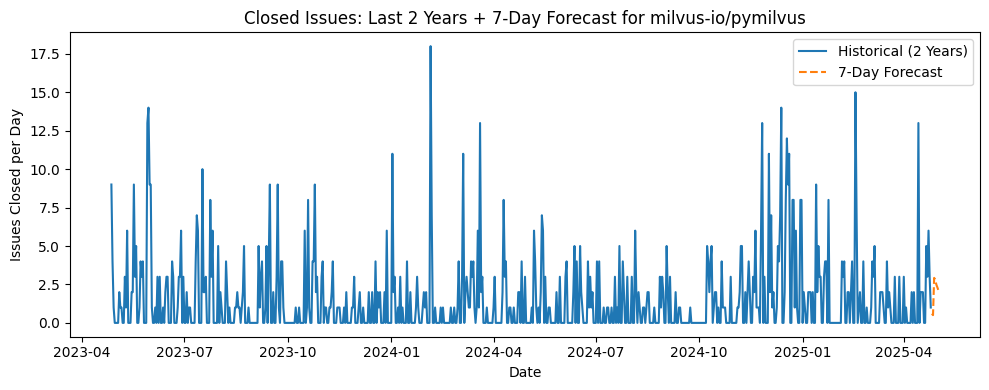

In [ ]:
# REQ10-5: Closed Issues Forecast using StatsModels (Last 2 Years + 7-Day Forecast via GitHub API)

import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone
from github import Github
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730    # use last 2 years of history
FORECAST_DAYS = 7      # forecast next week

# ── AUTHENTICATE ─────────────────────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing closed‐issues for {repo_full}…")

    # 1) Fetch all issues created since cutoff
    issues = repo.get_issues(state="all", since=cutoff)
    dates = []
    for iss in issues:
        dt = iss.closed_at
        if not dt:
            continue
        # make dt timezone‐aware if it isn’t
        if dt.tzinfo is None:
            dt = dt.replace(tzinfo=timezone.utc)
        if dt >= cutoff:
            dates.append(dt)

    if not dates:
        print(f"  – No closed‐issue data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build daily time series of closures
    df = pd.DataFrame({"date": pd.to_datetime(dates)})
    daily = (
        df.set_index("date")
          .resample("D")
          .size()
          .rename("count")
          .to_frame()
          .asfreq("D", fill_value=0)
    )

    # 3) Fit Holt–Winters model with weekly seasonality
    model = ExponentialSmoothing(
        daily["count"],
        trend="add",
        seasonal="add",
        seasonal_periods=7
    )
    fit = model.fit(optimized=True)

    # 4) Forecast next 7 days
    forecast = fit.forecast(FORECAST_DAYS)

    # 5) Plot history + forecast
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index,    daily["count"],    label="Historical (2 Years)")
    plt.plot(forecast.index, forecast.values, "--", label="7-Day Forecast")
    plt.title(f"Closed Issues: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("Issues Closed per Day")
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-danger">   
    
#### REQ10-6). Plot the pulls forecast 

</div>


▶ Processing pull‐requests for meta-llama/llama3…


05:12:06 - cmdstanpy - INFO - Chain [1] start processing
05:12:06 - cmdstanpy - INFO - Chain [1] done processing


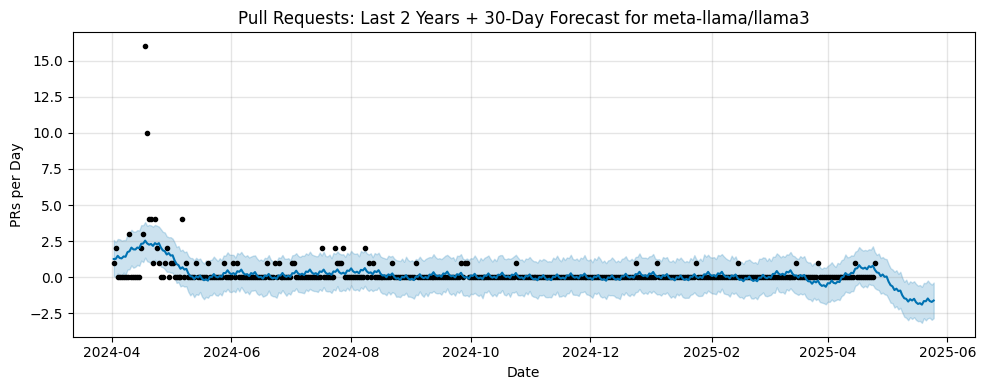


▶ Processing pull‐requests for ollama/ollama…


05:13:37 - cmdstanpy - INFO - Chain [1] start processing
05:13:37 - cmdstanpy - INFO - Chain [1] done processing


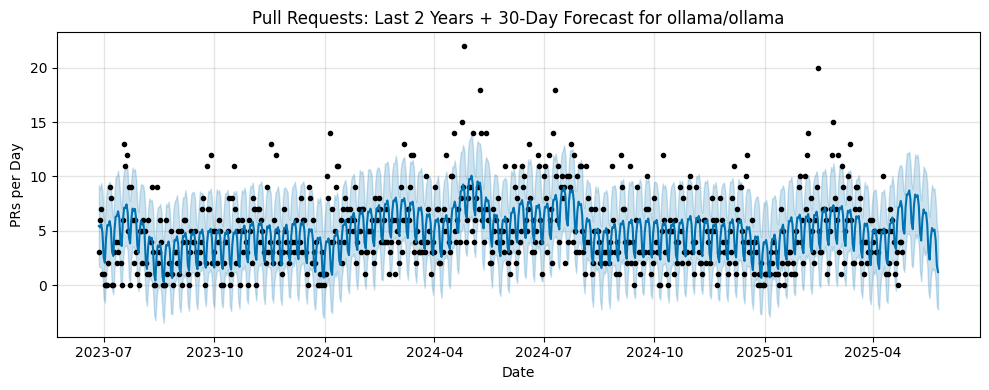


▶ Processing pull‐requests for langchain-ai/langchain…


05:23:16 - cmdstanpy - INFO - Chain [1] start processing
05:23:16 - cmdstanpy - INFO - Chain [1] done processing


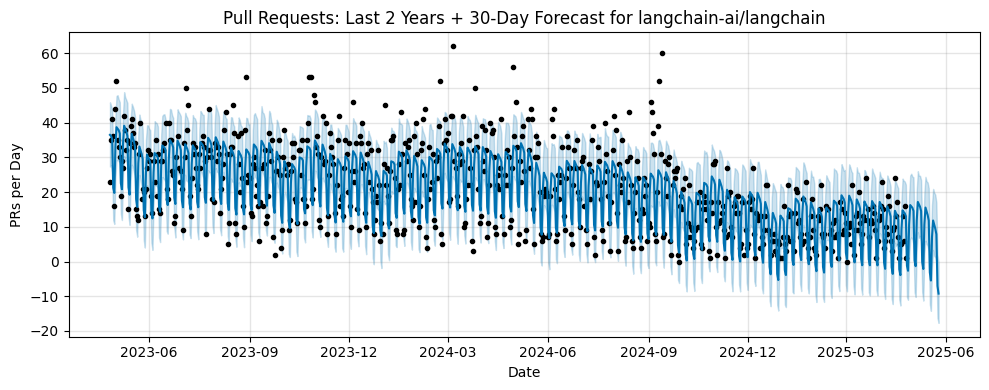


▶ Processing pull‐requests for langchain-ai/langgraph…


05:24:25 - cmdstanpy - INFO - Chain [1] start processing
05:24:25 - cmdstanpy - INFO - Chain [1] done processing


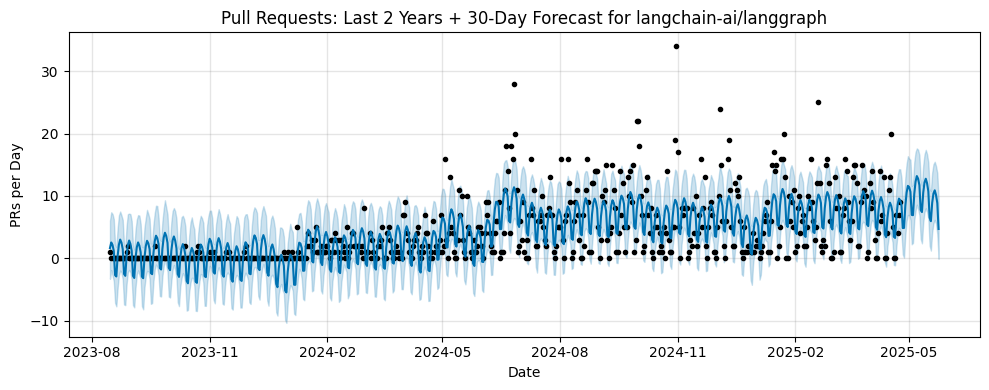


▶ Processing pull‐requests for microsoft/autogen…


05:26:06 - cmdstanpy - INFO - Chain [1] start processing
05:26:06 - cmdstanpy - INFO - Chain [1] done processing


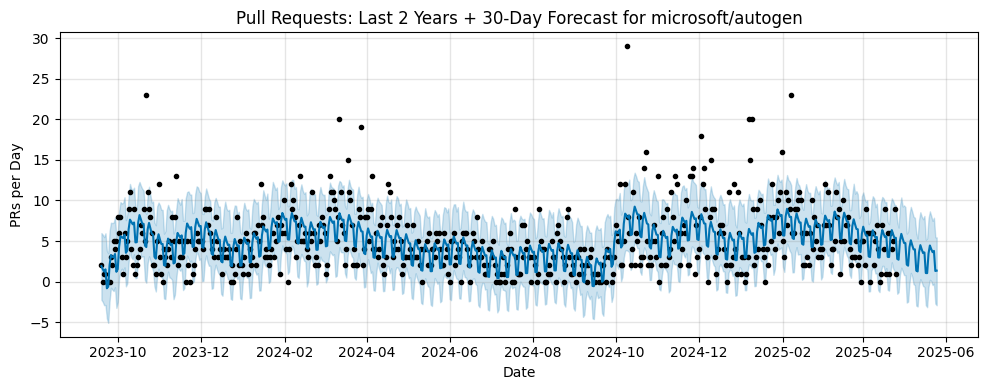


▶ Processing pull‐requests for openai/openai-cookbook…


05:26:37 - cmdstanpy - INFO - Chain [1] start processing
05:26:38 - cmdstanpy - INFO - Chain [1] done processing


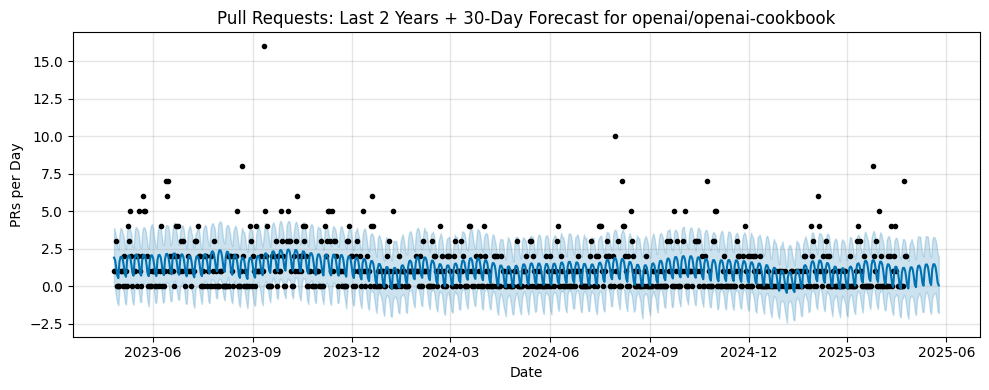


▶ Processing pull‐requests for elastic/elasticsearch…


06:41:45 - cmdstanpy - INFO - Chain [1] start processing
06:41:45 - cmdstanpy - INFO - Chain [1] done processing


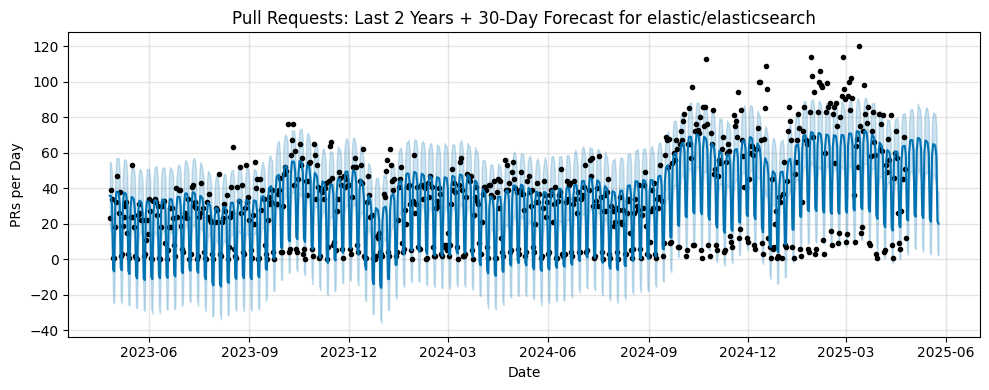


▶ Processing pull‐requests for milvus-io/pymilvus…


06:42:41 - cmdstanpy - INFO - Chain [1] start processing
06:42:42 - cmdstanpy - INFO - Chain [1] done processing


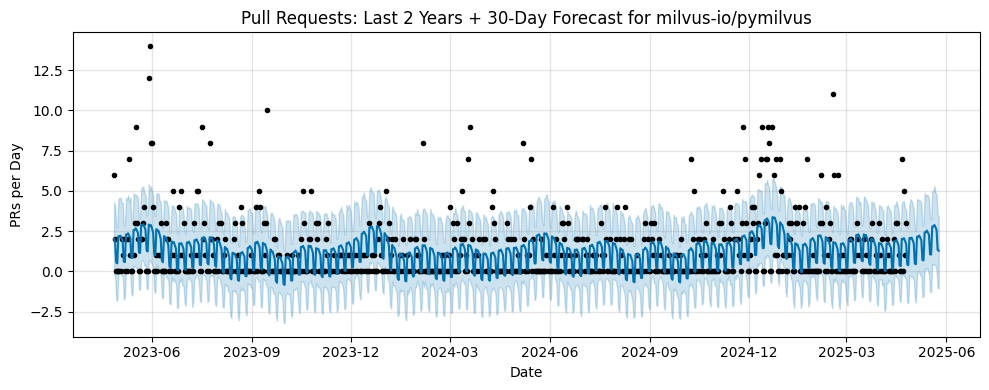

In [ ]:
#### REQ9-6). Pull‐Requests Creation Forecast using Prophet (directly via GitHub API)

import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone

from prophet import Prophet
from github import Github

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730   # last 2 years
FORECAST_DAYS = 30    # forecast horizon

# ── AUTHENTICATE WITH GITHUB ───────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)

# ── CUTOFF DATE (timezone‐aware) ────────────────────────────────────────────
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing pull‐requests for {repo_full}…")

    # 1) Fetch all pulls (state=all) and filter by creation date
    pulls = repo.get_pulls(state="all")
    dates = [pr.created_at for pr in pulls if pr.created_at >= cutoff]

    if not dates:
        print(f"  – No pull‐request data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build daily time series of PR counts
    df = pd.DataFrame({"ds": dates})
    df["ds"] = pd.to_datetime(df["ds"])
    daily = (
        df.set_index("ds")
          .resample("D")
          .size()
          .rename("y")
          .to_frame()
          .reset_index()
    )

    # 3) Fill missing days with zero
    full_idx = pd.date_range(daily["ds"].min(), daily["ds"].max(), freq="D")
    daily = (
        daily
        .set_index("ds")
        .reindex(full_idx, fill_value=0)
        .rename_axis("ds")
        .reset_index()
    )

    # 4) Strip timezone so Prophet accepts it
    daily["ds"] = daily["ds"].dt.tz_localize(None)

    # 5) Fit Prophet (weekly + yearly seasonality)
    m = Prophet(weekly_seasonality=True, yearly_seasonality=True)
    m.fit(daily)

    # 6) Forecast the next FORECAST_DAYS
    future = m.make_future_dataframe(periods=FORECAST_DAYS, freq="D")
    forecast = m.predict(future)

    # 7) Plot historical + forecast
    fig, ax = plt.subplots(figsize=(10, 4))
    m.plot(forecast, ax=ax)
    ax.set_title(f"Pull Requests: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    ax.set_xlabel("Date")
    ax.set_ylabel("PRs per Day")
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-danger">   
    
#### REQ10-7). Plot the commits forecast

</div>


▶ Processing commits for meta-llama/llama3…


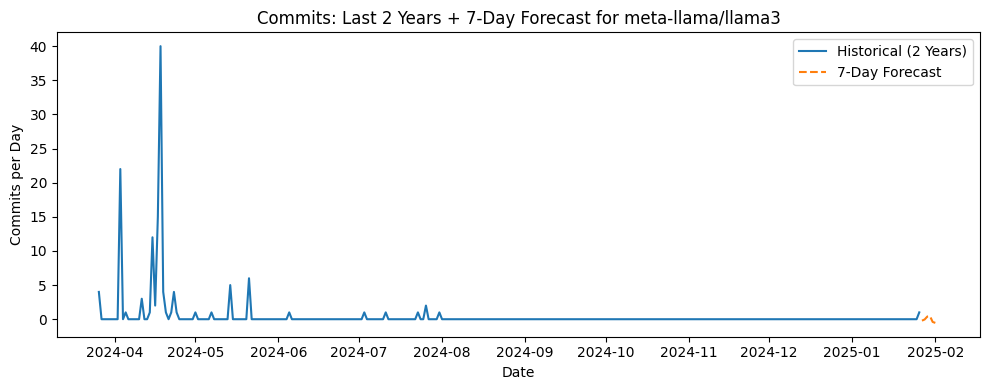


▶ Processing commits for ollama/ollama…


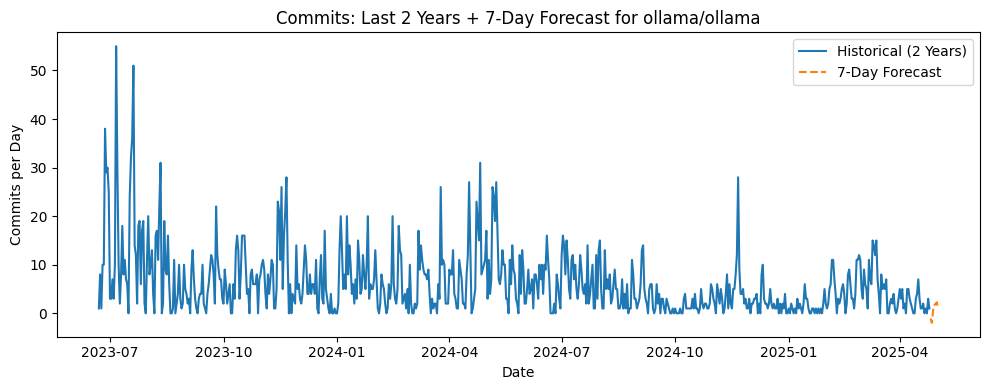


▶ Processing commits for langchain-ai/langchain…


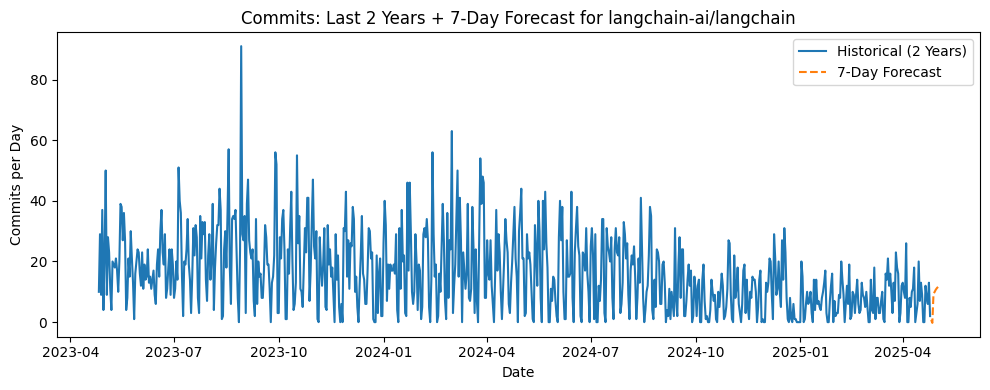


▶ Processing commits for langchain-ai/langgraph…


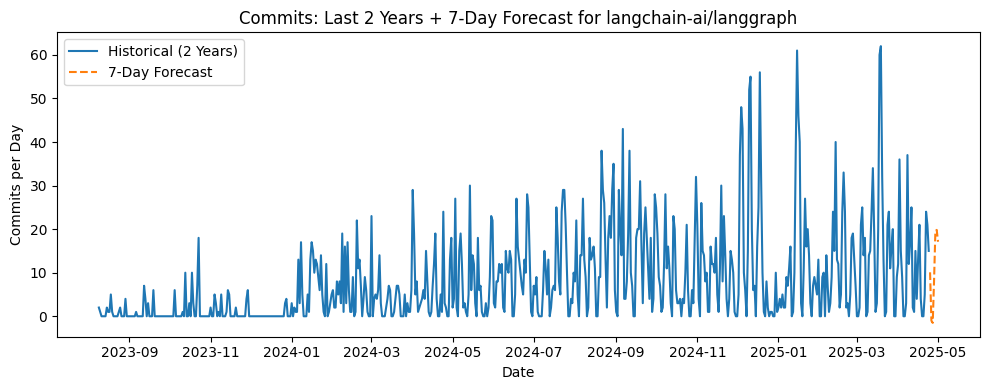


▶ Processing commits for microsoft/autogen…


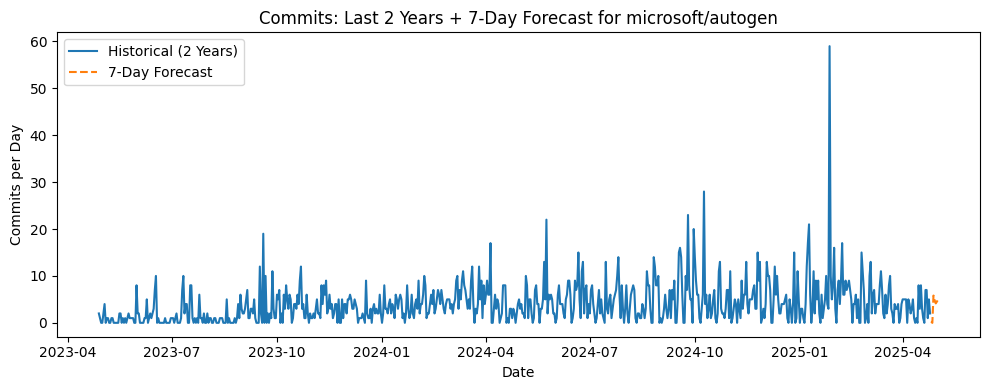


▶ Processing commits for openai/openai-cookbook…


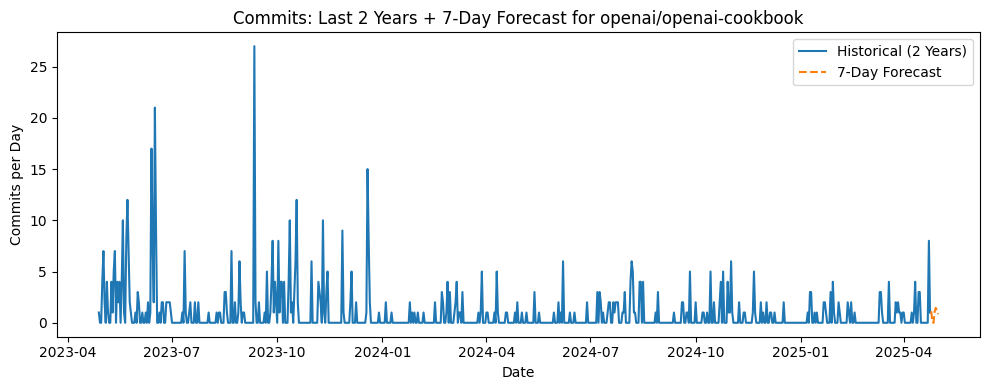


▶ Processing commits for elastic/elasticsearch…


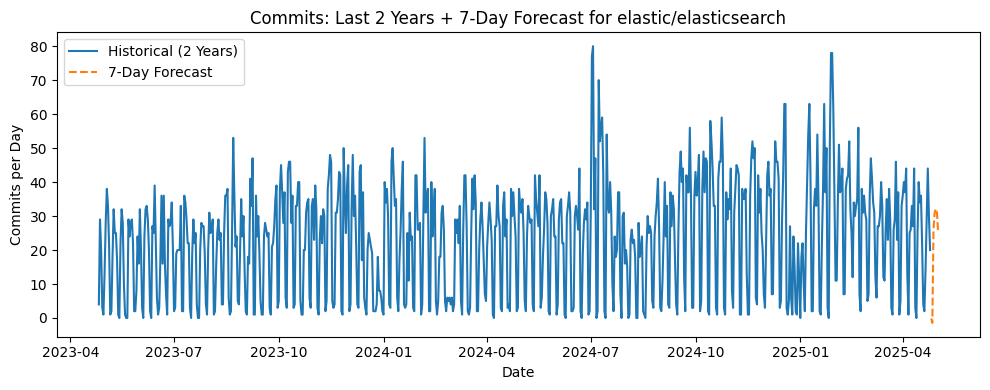


▶ Processing commits for milvus-io/pymilvus…


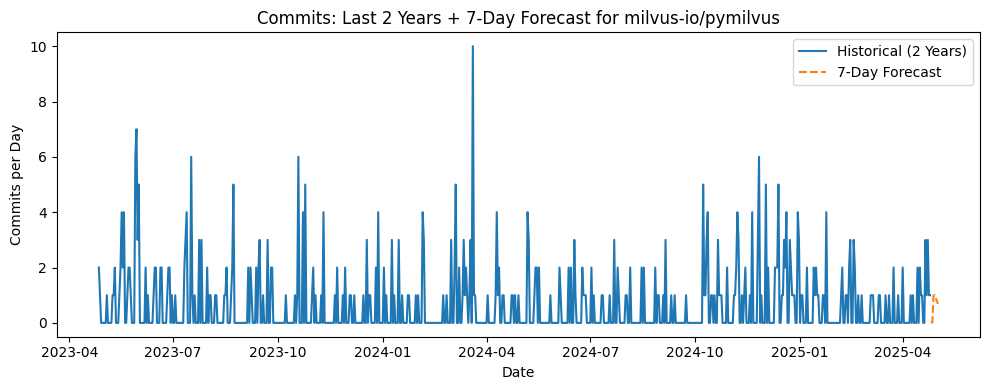

In [ ]:
# REQ10-7: Commits Forecast using StatsModels (Last 2 Years + 7-Day Forecast via GitHub API)

import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone
from github import Github
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730    # use last 2 years of history
FORECAST_DAYS = 7      # forecast next week

# ── AUTHENTICATE WITH GITHUB ───────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing commits for {repo_full}…")

    # 1) Fetch all commits since cutoff
    commits = repo.get_commits(since=cutoff)
    dates = []
    for c in commits:
        dt = c.commit.author.date
        if dt is None:
            continue
        # Make timezone-aware if naive
        if dt.tzinfo is None:
            dt = dt.replace(tzinfo=timezone.utc)
        if dt >= cutoff:
            dates.append(dt)

    if not dates:
        print(f"  – No commit data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build daily time series of commit counts
    df = pd.DataFrame({"date": pd.to_datetime(dates)})
    daily = (
        df.set_index("date")
          .resample("D")
          .size()
          .rename("count")
          .to_frame()
          .asfreq('D', fill_value=0)
    )

    # 3) Fit Holt–Winters with weekly seasonality
    model = ExponentialSmoothing(
        daily["count"],
        trend="add",
        seasonal="add",
        seasonal_periods=7
    )
    fit = model.fit(optimized=True)

    # 4) Forecast next 7 days
    forecast = fit.forecast(FORECAST_DAYS)

    # 5) Plot history + forecast
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index,    daily["count"],    label="Historical (2 Years)")
    plt.plot(forecast.index, forecast.values, "--", label="7-Day Forecast")
    plt.title(f"Commits: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("Commits per Day")
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-danger">   
    
#### REQ10-8). Plot the branches forecast

</div>


▶ Processing branch creations for meta-llama/llama3…


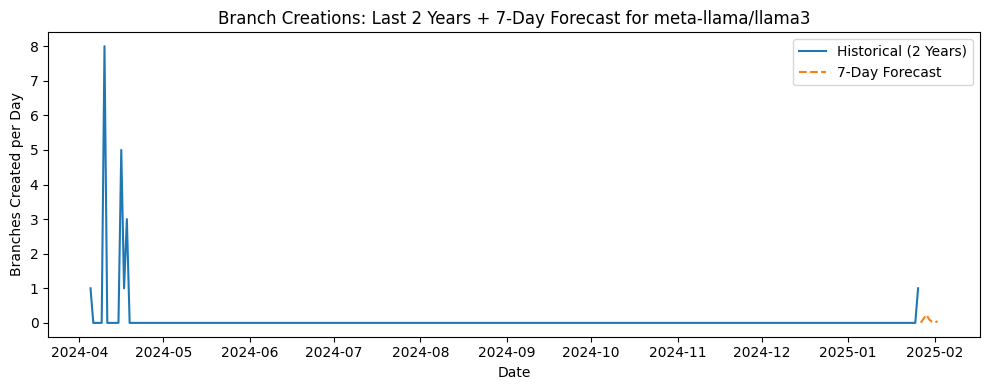


▶ Processing branch creations for ollama/ollama…


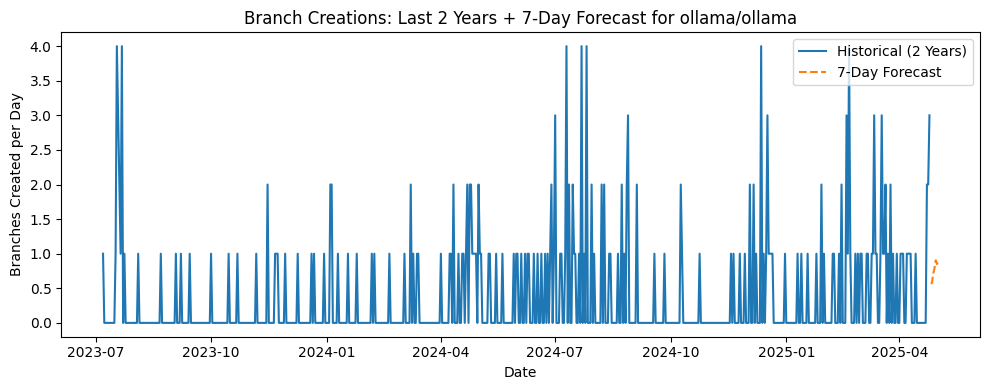


▶ Processing branch creations for langchain-ai/langchain…


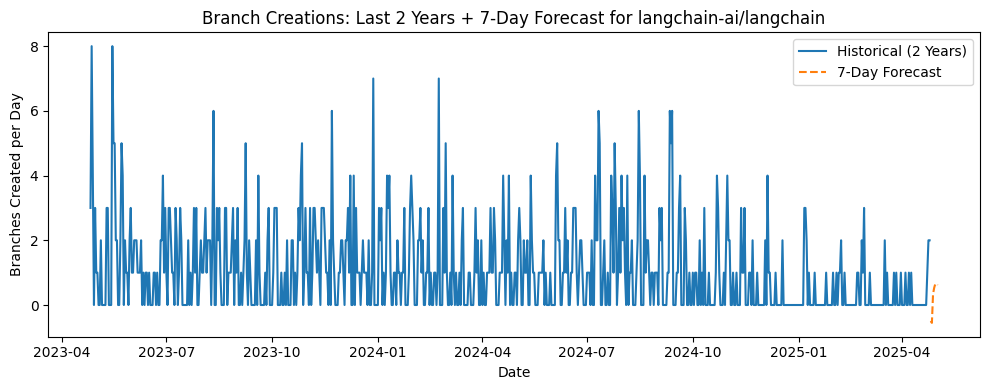


▶ Processing branch creations for langchain-ai/langgraph…


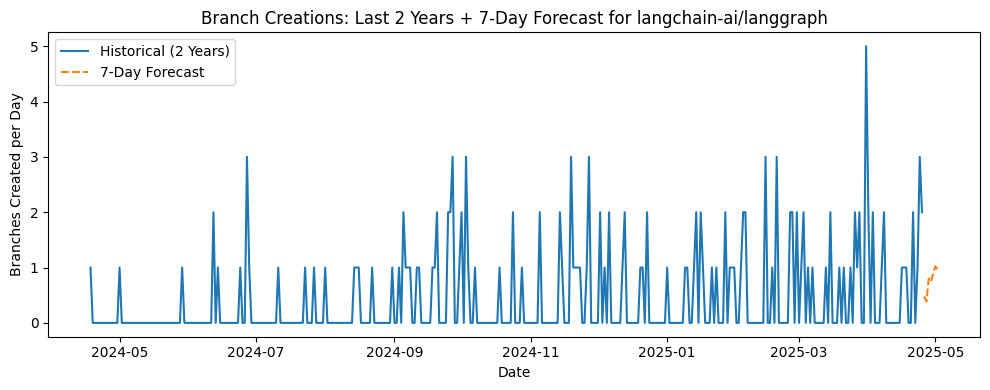


▶ Processing branch creations for microsoft/autogen…


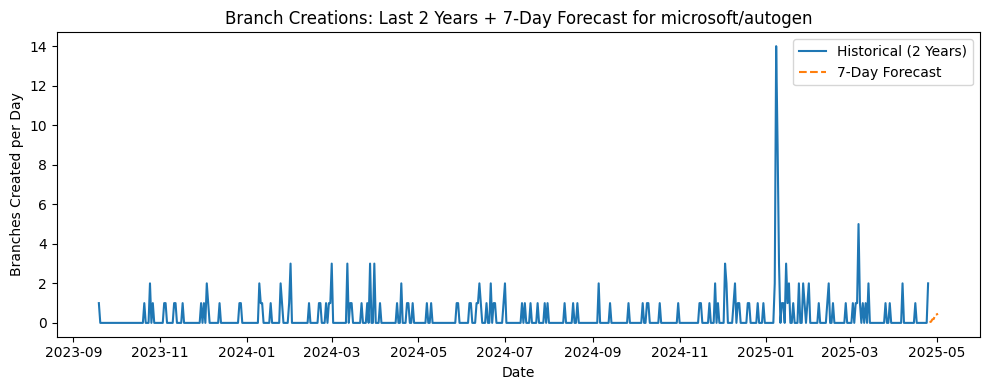


▶ Processing branch creations for openai/openai-cookbook…


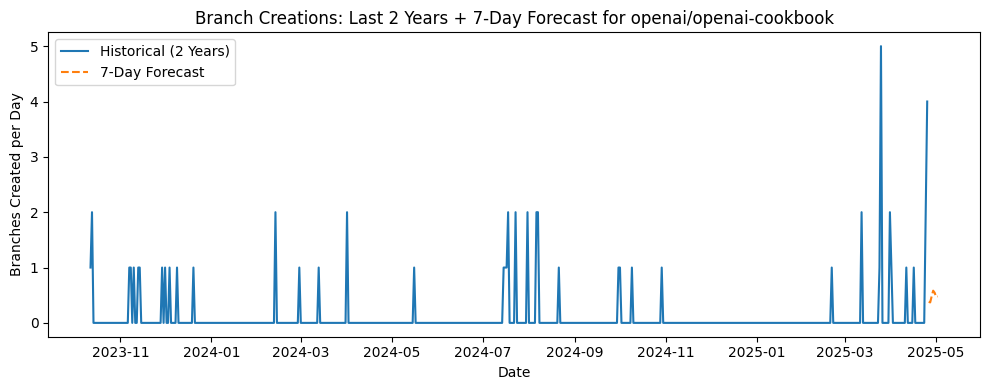


▶ Processing branch creations for elastic/elasticsearch…


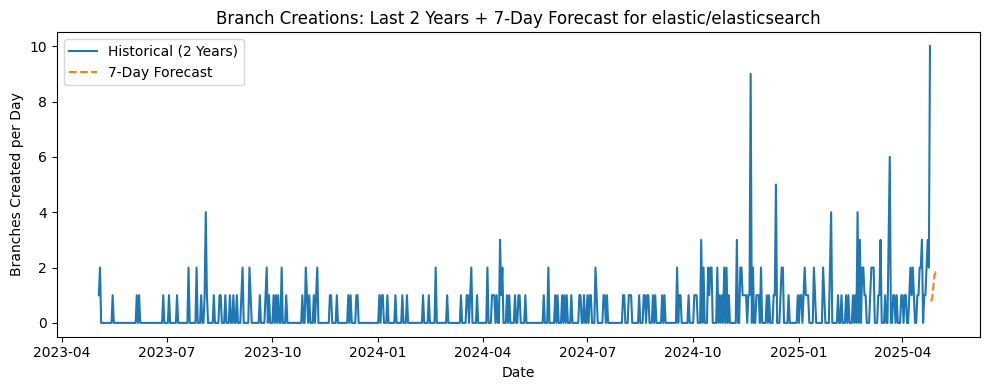


▶ Processing branch creations for milvus-io/pymilvus…


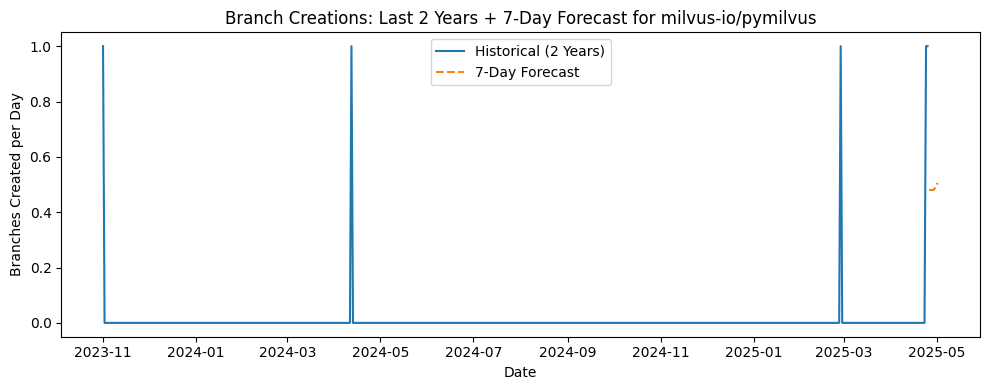

In [ ]:
# REQ10-8: Branch Creation Forecast using StatsModels (Last 2 Years + 7-Day Forecast via GitHub API)

import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone
from github import Github
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730    # last 2 years of history
FORECAST_DAYS = 7      # forecast next week

# ── AUTHENTICATE ─────────────────────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing branch creations for {repo_full}…")

    # 1) Fetch all branches and filter by their head commit date
    branches = repo.get_branches()
    dates = []
    for b in branches:
        dt = b.commit.commit.author.date
        if dt is None:
            continue
        # make dt timezone-aware if naive
        if dt.tzinfo is None:
            dt = dt.replace(tzinfo=timezone.utc)
        if dt >= cutoff:
            dates.append(dt)

    if not dates:
        print(f"  – No branch‐creation data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build daily time series of branch counts
    df = pd.DataFrame({"date": pd.to_datetime(dates)})
    daily = (
        df.set_index("date")
          .resample("D")
          .size()
          .rename("count")
          .to_frame()
          .asfreq('D', fill_value=0)
    )

    # 3) Fit Holt–Winters with weekly seasonality
    model = ExponentialSmoothing(
        daily["count"],
        trend="add",
        seasonal="add",
        seasonal_periods=7
    )
    fit = model.fit(optimized=True)

    # 4) Forecast next 7 days
    forecast = fit.forecast(FORECAST_DAYS)

    # 5) Plot history + forecast
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index,    daily["count"],    label="Historical (2 Years)")
    plt.plot(forecast.index, forecast.values, "--", label="7-Day Forecast")
    plt.title(f"Branch Creations: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("Branches Created per Day")
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-danger">   
    
#### REQ10-9). Plot the contributors forecast

</div>


▶ Processing contributors for meta-llama/llama3…


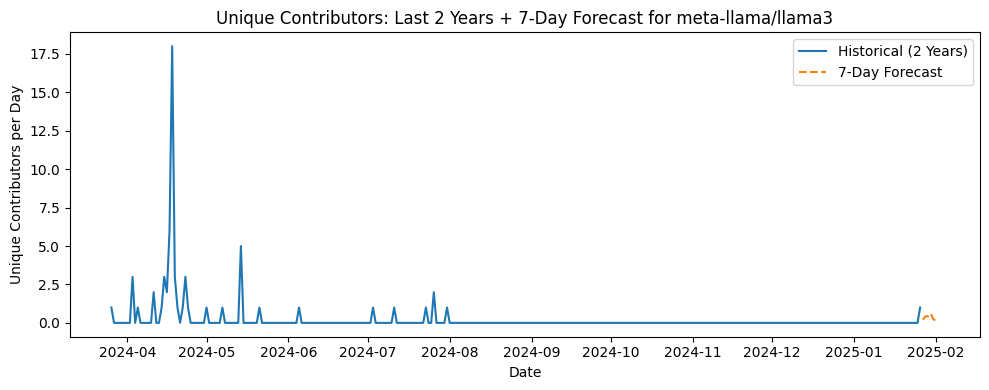


▶ Processing contributors for ollama/ollama…


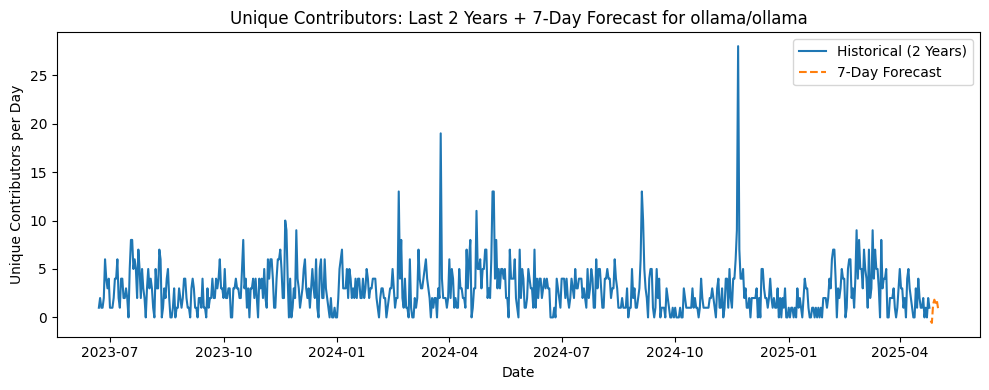


▶ Processing contributors for langchain-ai/langchain…


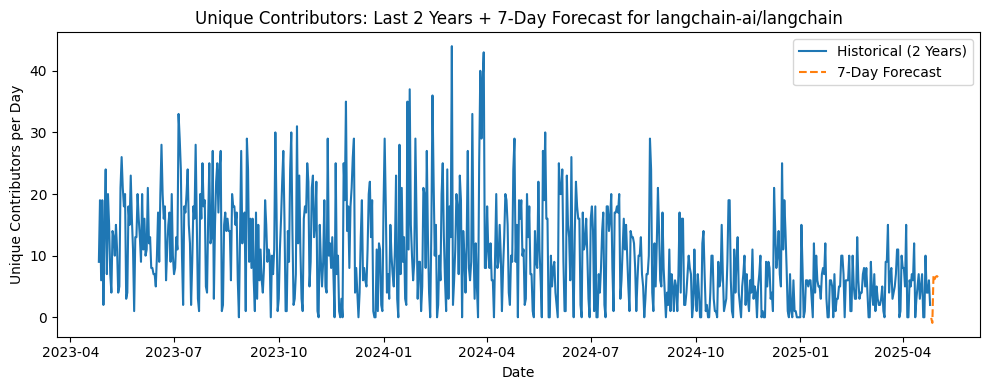


▶ Processing contributors for langchain-ai/langgraph…


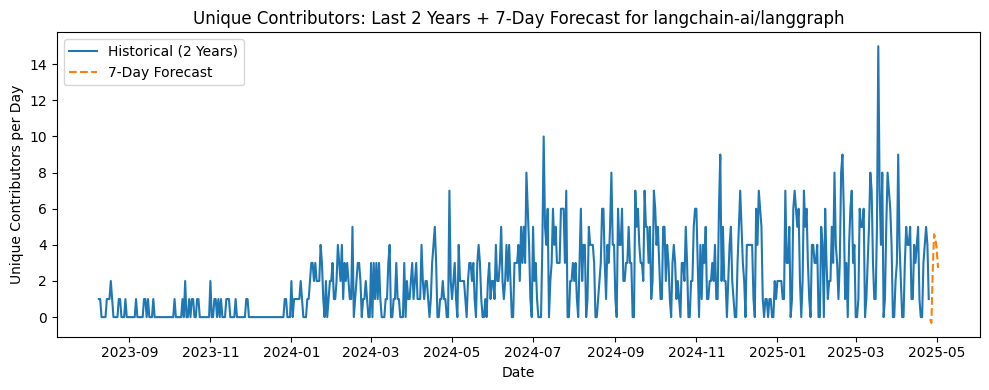


▶ Processing contributors for microsoft/autogen…


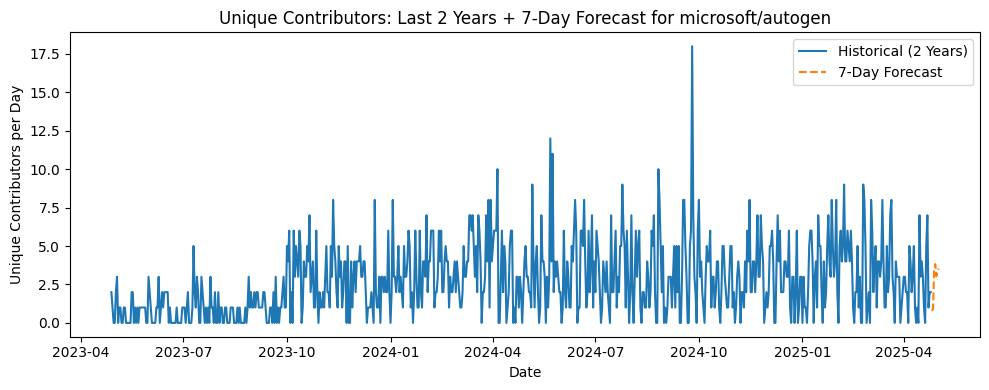


▶ Processing contributors for openai/openai-cookbook…


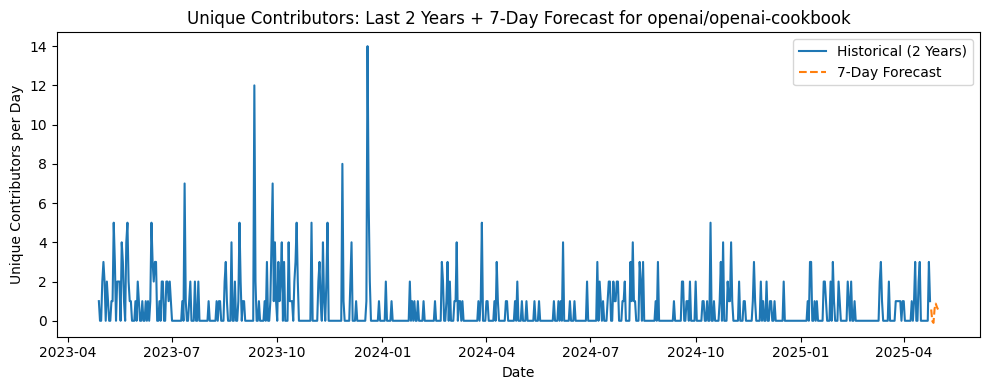


▶ Processing contributors for elastic/elasticsearch…


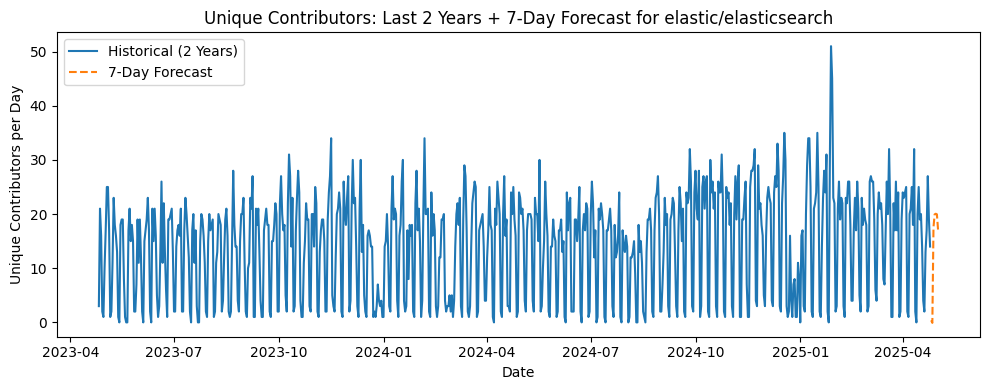


▶ Processing contributors for milvus-io/pymilvus…


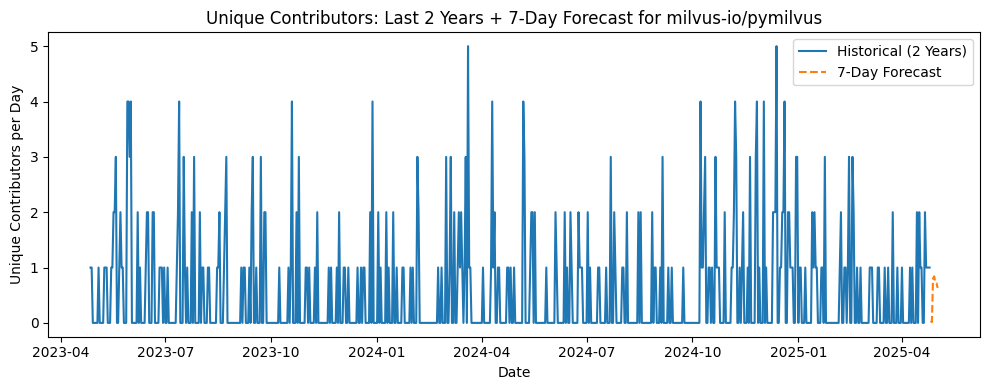

In [ ]:
# REQ10-9: Unique Contributors Forecast using StatsModels (Last 2 Years + 7-Day Forecast via GitHub API)

import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone
from github import Github
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730    # last 2 years of history
FORECAST_DAYS = 7      # forecast next week

# ── AUTHENTICATE WITH GITHUB ───────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing contributors for {repo_full}…")

    # 1) Fetch all commits since cutoff
    commits = repo.get_commits(since=cutoff)
    data = []
    for c in commits:
        dt = c.commit.author.date
        if dt is None:
            continue
        # make dt timezone-aware if naive
        if dt.tzinfo is None:
            dt = dt.replace(tzinfo=timezone.utc)
        if dt >= cutoff:
            author = c.author.login if c.author else c.commit.author.name
            data.append((dt.date(), author))

    if not data:
        print(f"  – No commit/contributor data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build daily unique-contributor counts
    df = pd.DataFrame(data, columns=["date","author"])
    df["date"] = pd.to_datetime(df["date"])
    daily = (
        df
        .groupby("date")["author"]
        .nunique()
        .rename("count")
        .to_frame()
        .asfreq("D", fill_value=0)
    )

    # 3) Fit Holt–Winters with weekly seasonality
    model = ExponentialSmoothing(
        daily["count"],
        trend="add",
        seasonal="add",
        seasonal_periods=7
    )
    fit = model.fit(optimized=True)

    # 4) Forecast next 7 days
    forecast = fit.forecast(FORECAST_DAYS)

    # 5) Plot history + forecast
    plt.figure(figsize=(10,4))
    plt.plot(daily.index,    daily["count"],    label="Historical (2 Years)")
    plt.plot(forecast.index, forecast.values, "--", label="7-Day Forecast")
    plt.title(f"Unique Contributors: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("Unique Contributors per Day")
    plt.legend()
    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-danger">   
    
#### REQ10-10). Plot the releases forecast

</div>


▶ Processing releases for meta-llama/llama3…
  – No release data in last 730 days, skipping.

▶ Processing releases for ollama/ollama…


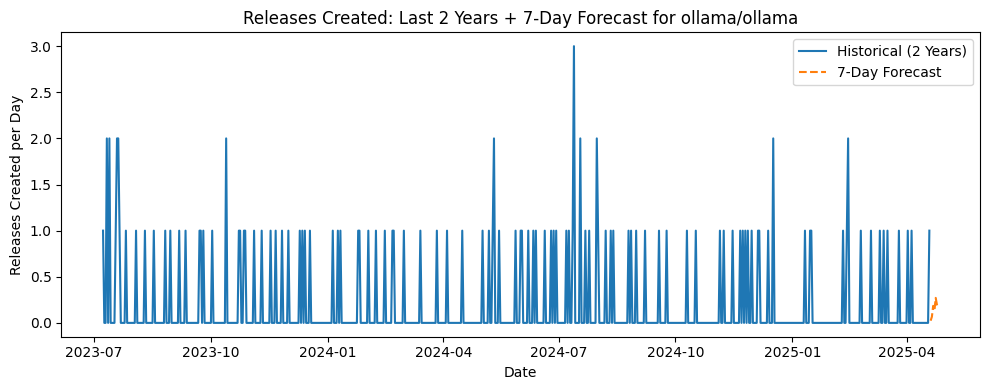


▶ Processing releases for langchain-ai/langchain…


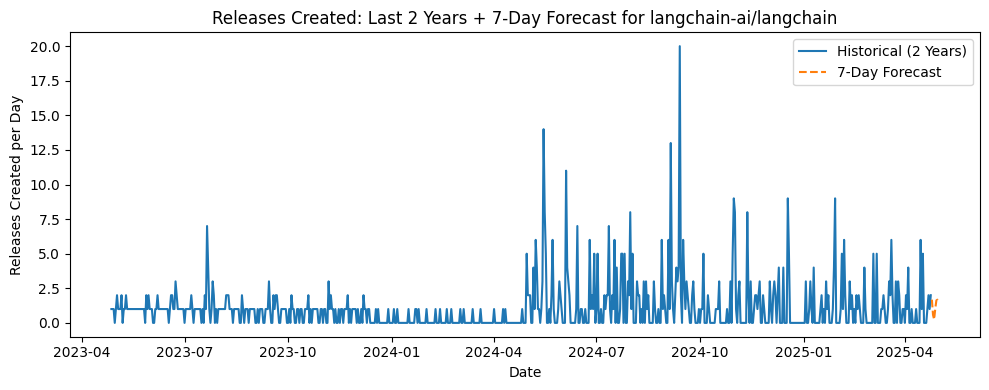


▶ Processing releases for langchain-ai/langgraph…


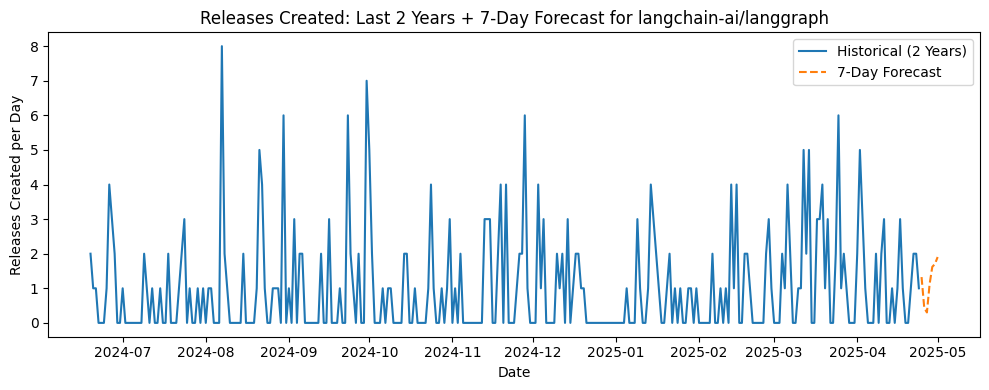


▶ Processing releases for microsoft/autogen…


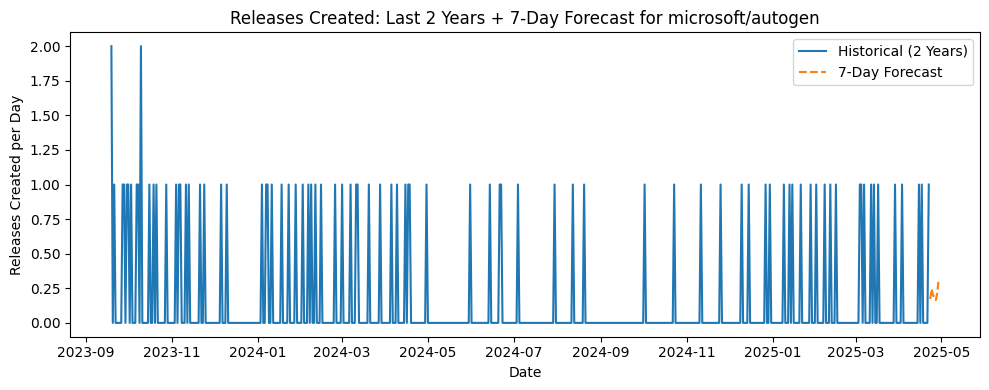


▶ Processing releases for openai/openai-cookbook…
  – No release data in last 730 days, skipping.

▶ Processing releases for elastic/elasticsearch…


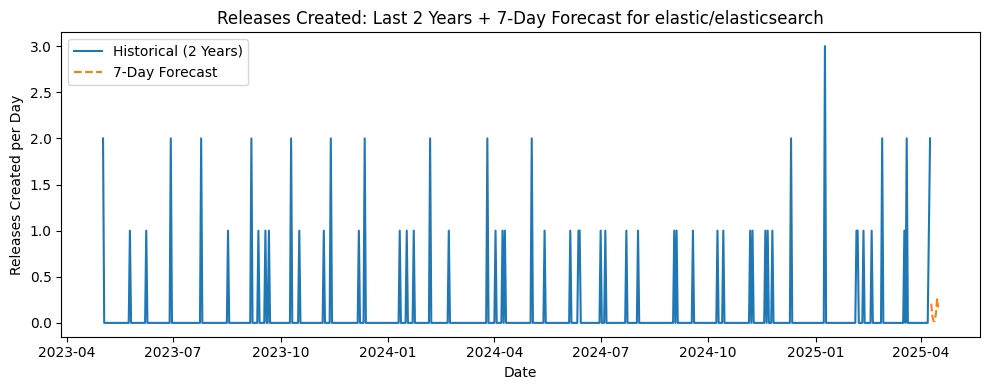


▶ Processing releases for milvus-io/pymilvus…


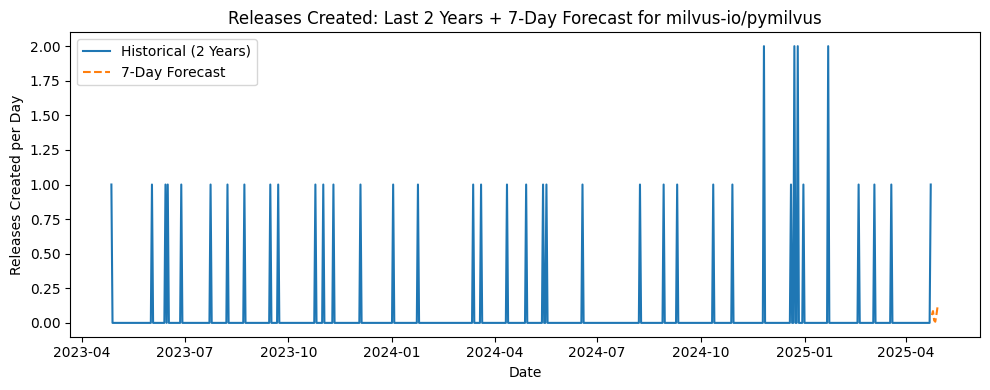

In [ ]:
# REQ10-10: Release Creation Forecast using StatsModels (Last 2 Years + 7-Day Forecast via GitHub API)

import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone
from github import Github
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ── CONFIGURATION ────────────────────────────────────────────────────────────
GITHUB_TOKEN = ""
REPOSITORIES  = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]
LOOKBACK_DAYS = 730    # last 2 years of history
FORECAST_DAYS = 7      # forecast next week

# ── AUTHENTICATE ─────────────────────────────────────────────────────────────
gh = Github(GITHUB_TOKEN)
cutoff = datetime.now(timezone.utc) - timedelta(days=LOOKBACK_DAYS)

for repo_full in REPOSITORIES:
    repo = gh.get_repo(repo_full)
    print(f"\n▶ Processing releases for {repo_full}…")

    # 1) Fetch all releases
    releases = list(repo.get_releases())
    dates = []
    for rel in releases:
        dt = getattr(rel, "created_at", None)
        if dt is None:
            continue
        # ensure dt is timezone-aware
        if dt.tzinfo is None:
            dt = dt.replace(tzinfo=timezone.utc)
        if dt >= cutoff:
            dates.append(dt)

    if not dates:
        print(f"  – No release data in last {LOOKBACK_DAYS} days, skipping.")
        continue

    # 2) Build daily time series of releases
    df = pd.DataFrame({"date": pd.to_datetime(dates)})
    daily = (
        df.set_index("date")
          .resample("D")
          .size()
          .rename("count")
          .to_frame()
          .asfreq("D", fill_value=0)
    )

    # 3) Fit Holt–Winters with weekly seasonality
    model = ExponentialSmoothing(
        daily["count"],
        trend="add",
        seasonal="add",
        seasonal_periods=7
    )
    fit = model.fit(optimized=True)

    # 4) Forecast next 7 days
    forecast = fit.forecast(FORECAST_DAYS)

    # 5) Plot history + forecast
    plt.figure(figsize=(10, 4))
    plt.plot(daily.index,    daily["count"],    label="Historical (2 Years)")
    plt.plot(forecast.index, forecast.values, "--", label="7-Day Forecast")
    plt.title(f"Releases Created: Last 2 Years + {FORECAST_DAYS}-Day Forecast for {repo_full}")
    plt.xlabel("Date")
    plt.ylabel("Releases Created per Day")
    plt.legend()
    plt.tight_layout()
    plt.show()
